# Initialise Spark context

In [1]:
#def init_spark():
    import pyspark
    from pyspark import SparkConf, SparkContext
    from pyspark.sql import SparkSession
    import pyspark.sql.functions as F

    # start the session
    conf = SparkConf().setAppName('*')
    conf.set('spark.driver.cores', '5')
    conf.set('spark.driver.memory', '40G')
    conf.set('spark.driver.maxResultSize', '40G')
    conf.set('spark.executor.cores', '10')
    conf.set('spark.executor.instances', '20')
    conf.set('spark.executor.memory', '40G')
    conf.set('spark.executor.memoryOverhead', '10G')
    conf.set('spark.kryoserializer.buffer.max', '2047')
    conf.set('spark.locality.wait', '0')
    conf.set('spark.port.maxRetries', '128')
    conf.set('spark.scheduler.minRegisteredResourcesRatio', '1')
    conf.set('spark.network.timeout', '500')
    conf.set('spark.dynamicAllocation.enabled', 'False')
    conf.set('spark.shuffle.service.enabled', 'False')
    conf.set('spark.sql.legacy.allowCreatingManagedTableUsingNonemptyLocation', 'True')
    conf.set("spark.sql.broadcastTimeout", "1800")
    sc = SparkContext(conf = conf)
    spark = SparkSession(sc)


# Imports

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from pyspark.sql.functions import col
from pyspark.sql import DataFrame
from pyspark.sql.functions import col, count, approx_count_distinct
import re
from pyspark.sql.functions import to_date, col, regexp_replace

#Smote
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline
from collections import Counter

# Statistics
from scipy.stats import chi2_contingency
#sklearn
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, roc_curve
# Import the split function from sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler

In [3]:
source_csv_file = 'Churndata_2023-11.csv'
load_df = spark.read.csv('{csv_file}'.format(csv_file=source_csv_file), header=True, sep=';', inferSchema= True)

In [4]:
load_df.printSchema()

root
 |-- msisdn: integer (nullable = true)
 |-- vas_code: string (nullable = true)
 |-- actual_premium: integer (nullable = true)
 |-- Tenure: integer (nullable = true)
 |-- 1Yr_Loss_Ratio: string (nullable = true)
 |-- 3Yr_Loss_Ratio: string (nullable = true)
 |-- 1Yr_LR_band: string (nullable = true)
 |-- 3Yr_LR_band: string (nullable = true)
 |-- LR_Increase: string (nullable = true)
 |-- TP_2: string (nullable = true)
 |-- PSR_2: string (nullable = true)
 |-- PSR_2_Increase_Loading: string (nullable = true)
 |-- Premium Increase: string (nullable = true)
 |-- New_Premium_2: string (nullable = true)
 |-- Segment: string (nullable = true)
 |-- New_Premium_PSR: string (nullable = true)
 |-- monetary increase: string (nullable = true)
 |-- lsm: string (nullable = true)
 |-- PolicyMakeMapped: string (nullable = true)
 |-- SI_Band: string (nullable = true)
 |-- Count_TH_LO: integer (nullable = true)
 |-- Count_AD_Repair: integer (nullable = true)
 |-- Gendr_Cd: string (nullable = true)


In [5]:
for old_col in load_df.columns:
    new_col = old_col.lower().replace(" ", "_")
    load_df = load_df.withColumnRenamed(old_col, new_col)

In [6]:
load_df.printSchema()

root
 |-- msisdn: integer (nullable = true)
 |-- vas_code: string (nullable = true)
 |-- actual_premium: integer (nullable = true)
 |-- tenure: integer (nullable = true)
 |-- 1yr_loss_ratio: string (nullable = true)
 |-- 3yr_loss_ratio: string (nullable = true)
 |-- 1yr_lr_band: string (nullable = true)
 |-- 3yr_lr_band: string (nullable = true)
 |-- lr_increase: string (nullable = true)
 |-- tp_2: string (nullable = true)
 |-- psr_2: string (nullable = true)
 |-- psr_2_increase_loading: string (nullable = true)
 |-- premium_increase: string (nullable = true)
 |-- new_premium_2: string (nullable = true)
 |-- segment: string (nullable = true)
 |-- new_premium_psr: string (nullable = true)
 |-- monetary_increase: string (nullable = true)
 |-- lsm: string (nullable = true)
 |-- policymakemapped: string (nullable = true)
 |-- si_band: string (nullable = true)
 |-- count_th_lo: integer (nullable = true)
 |-- count_ad_repair: integer (nullable = true)
 |-- gendr_cd: string (nullable = true)


In [7]:
load_df = load_df.drop("msisdn")
load_df = load_df.drop("msisdn26")
load_df = load_df.drop("policyvascode")
load_df = load_df.drop("policyinceptiondate2")
load_df = load_df.drop("policyinceptiondate35")
load_df = load_df.drop("thlo_acpc_expected")
load_df = load_df.drop("ad_repair_acpc_expected")
load_df = load_df.drop("ad_replace_acpc_expected")
load_df = load_df.drop("policyym")
load_df = load_df.drop("monthlypremium")
load_df = load_df.drop("age")
load_df = load_df.drop("lsm2")
load_df = load_df.drop("upgrade_date")
load_df = load_df.drop("target_date_of_increase")
load_df = load_df.drop("policymakesiband")
load_df = load_df.drop("gendr_cd")

In [8]:
load_df = load_df.withColumnRenamed("target_date_of_increase_", "target_date_of_increase")
load_df = load_df.withColumnRenamed("policymakemapped", "policy_make_mapped")
load_df = load_df.withColumnRenamed("insuredvalue", "insured_value")
load_df = load_df.withColumnRenamed("perilfilter", "peril_filter")
load_df = load_df.withColumnRenamed("tenuregroup", "tenure_group")
load_df = load_df.withColumnRenamed("mapage", "map_age")
load_df = load_df.withColumnRenamed("1yr_loss_ratio", "one_yr_loss_ratio")
load_df = load_df.withColumnRenamed("3yr_loss_ratio", "three_yr_loss_ratio")
load_df = load_df.withColumnRenamed("1yr_lr_band", "one_yr_lr_band")
load_df = load_df.withColumnRenamed("3yr_lr_band", "three_yr_lr_band")
load_df = load_df.withColumnRenamed("1yrall", "one_yr_all")
load_df = load_df.withColumnRenamed("3yrall", "three_yr_all")
load_df = load_df.withColumnRenamed("5yrall", "five_yr_all")
load_df = load_df.withColumnRenamed("1yrclaims", "one_yr_claims")
load_df = load_df.withColumnRenamed("3yrclaims", "three_yr_claims")
load_df = load_df.withColumnRenamed("5yrclaims", "five_yr_claims")
load_df = load_df.withColumnRenamed("ad_lossofsi", "ad_loss_of_si")

In [9]:
load_df.printSchema()

root
 |-- vas_code: string (nullable = true)
 |-- actual_premium: integer (nullable = true)
 |-- tenure: integer (nullable = true)
 |-- one_yr_loss_ratio: string (nullable = true)
 |-- three_yr_loss_ratio: string (nullable = true)
 |-- one_yr_lr_band: string (nullable = true)
 |-- three_yr_lr_band: string (nullable = true)
 |-- lr_increase: string (nullable = true)
 |-- tp_2: string (nullable = true)
 |-- psr_2: string (nullable = true)
 |-- psr_2_increase_loading: string (nullable = true)
 |-- premium_increase: string (nullable = true)
 |-- new_premium_2: string (nullable = true)
 |-- segment: string (nullable = true)
 |-- new_premium_psr: string (nullable = true)
 |-- monetary_increase: string (nullable = true)
 |-- lsm: string (nullable = true)
 |-- policy_make_mapped: string (nullable = true)
 |-- si_band: string (nullable = true)
 |-- count_th_lo: integer (nullable = true)
 |-- count_ad_repair: integer (nullable = true)
 |-- tenure_group: string (nullable = true)
 |-- most_used_pr

In [10]:
load_df.count()

351000

In [11]:
pandas_df = load_df.toPandas()

In [12]:
s = pandas_df

In [13]:
pandas_df.head()

,vas_code,actual_premium,tenure,one_yr_loss_ratio,three_yr_loss_ratio,one_yr_lr_band,three_yr_lr_band,lr_increase,tp_2,psr_2,...,one_yr_claims,three_yr_claims,five_yr_claims,net_th_lo,net_ad_repair,net_ad_replace,ad_loss_of_si,map_age,insured_value,cancellation_check
0,VIC01,346,29,0,0,a: 0 to 20%,a: 0 to 20%,0,"131,6987147","2,627208632",...,0.0,0.0,0.0,0.0,0.0,0.0,0,81 to 90,23293.973595,0
1,IC08,221,5,0,0,a: 0 to 20%,a: 0 to 20%,0,"318,307609","0,694296943",...,0.0,0.0,0.0,0.0,0.0,0.0,0,41 to 50,15879.702051,0
2,VIC01,364,29,0,0,a: 0 to 20%,a: 0 to 20%,0,"147,2188878","2,472508829",...,0.0,0.0,0.0,0.0,0.0,0.0,0,51 to 60,12422.679742,0
3,VIC01,107,18,"4,335825545","2,890550363",f: 100%+,f: 100%+,"0,07","184,7814566","0,579062434",...,0.0,0.0,0.0,0.0,0.0,0.0,0,41 to 50,5823.499222,0
4,VIC01,74,11,0,0,a: 0 to 20%,a: 0 to 20%,0,"233,7753435","0,31654322",...,0.0,0.0,0.0,0.0,0.0,0.0,0,41 to 50,15529.318318,0


In [14]:
pandas_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 351000 entries, 0 to 350999
Data columns (total 44 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   vas_code                        351000 non-null  object 
 1   actual_premium                  351000 non-null  int32  
 2   tenure                          351000 non-null  int32  
 3   one_yr_loss_ratio               351000 non-null  object 
 4   three_yr_loss_ratio             351000 non-null  object 
 5   one_yr_lr_band                  351000 non-null  object 
 6   three_yr_lr_band                351000 non-null  object 
 7   lr_increase                     351000 non-null  object 
 8   tp_2                            348437 non-null  object 
 9   psr_2                           348437 non-null  object 
 10  psr_2_increase_loading          348437 non-null  object 
 11  premium_increase                351000 non-null  object 
 12  new_premium_2   

In [15]:
#converting to strings

# str_colums = ["msisdn", 'lsm']

# # Converting to int format
# for col_name in str_colums:
#     pandas_df[col_name] = pandas_df[str_colums].astype(object)

In [16]:
# int_columns = [ "actual_premium", "tenure" , "cancellation_check"]
# # Converting to int format
# for col_name in int_columns:
#     pandas_df[col_name] = pandas_df[col_name].astype(int)

In [17]:
flt_columns = ["one_yr_loss_ratio", "three_yr_loss_ratio", "lr_increase", "tp_2", "psr_2", "psr_2_increase_loading", \
               "premium_increase", "new_premium_2", "new_premium_psr", "monetary_increase", "gross_ad_repair", \
               "gross_ad_replace", "gross_th_lo", "gross_ad", "ad_loss_of_si"]

# Converting to float format
for col_name in flt_columns:
    pandas_df[col_name] = pandas_df[col_name].str.replace(',', '.').astype(float)

In [18]:
# Converting date columns to the specified date format
# date_columns = ["upgrade_date", "target_date_of_increase"]

# for col_name in date_columns:
#     pandas_df[col_name] = pd.to_datetime(pandas_df[col_name], format="%Y/%m/%d")

In [19]:
pandas_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 351000 entries, 0 to 350999
Data columns (total 44 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   vas_code                        351000 non-null  object 
 1   actual_premium                  351000 non-null  int32  
 2   tenure                          351000 non-null  int32  
 3   one_yr_loss_ratio               351000 non-null  float64
 4   three_yr_loss_ratio             351000 non-null  float64
 5   one_yr_lr_band                  351000 non-null  object 
 6   three_yr_lr_band                351000 non-null  object 
 7   lr_increase                     351000 non-null  float64
 8   tp_2                            348437 non-null  float64
 9   psr_2                           348437 non-null  float64
 10  psr_2_increase_loading          348437 non-null  float64
 11  premium_increase                351000 non-null  float64
 12  new_premium_2   

In [20]:
pandas_df.shape

(351000, 44)

In [21]:
pandas_df.count()

vas_code                          351000
actual_premium                    351000
tenure                            351000
one_yr_loss_ratio                 351000
three_yr_loss_ratio               351000
one_yr_lr_band                    351000
three_yr_lr_band                  351000
lr_increase                       351000
tp_2                              348437
psr_2                             348437
psr_2_increase_loading            348437
premium_increase                  351000
new_premium_2                     351000
segment                           351000
new_premium_psr                   351000
monetary_increase                 351000
lsm                               324768
policy_make_mapped                351000
si_band                           350994
count_th_lo                       351000
count_ad_repair                   351000
tenure_group                      351000
most_used_prov                    347473
dmuc_24h_distnct_cell_site_qty    349500
count_ad_replace

In [22]:
pandas_df.isnull().sum()

vas_code                              0
actual_premium                        0
tenure                                0
one_yr_loss_ratio                     0
three_yr_loss_ratio                   0
one_yr_lr_band                        0
three_yr_lr_band                      0
lr_increase                           0
tp_2                               2563
psr_2                              2563
psr_2_increase_loading             2563
premium_increase                      0
new_premium_2                         0
segment                               0
new_premium_psr                       0
monetary_increase                     0
lsm                               26232
policy_make_mapped                    0
si_band                               6
count_th_lo                           0
count_ad_repair                       0
tenure_group                          0
most_used_prov                     3527
dmuc_24h_distnct_cell_site_qty     1500
count_ad_replace                      0


In [23]:
pandas_df['cancellation_check'].value_counts()

0    335097
1     15903
Name: cancellation_check, dtype: int64

In [24]:
pandas_dfna = pandas_df.dropna()

In [25]:
pandas_dfna['cancellation_check'].value_counts()

0    307367
1     14067
Name: cancellation_check, dtype: int64

In [26]:
#pandas_df = pandas_df.fillna(pandas_df.median())

In [27]:
#pandas_df.isnull().sum()

In [28]:
#pandas_df = pandas_df.apply(lambda x: x.fillna(x.value_counts().index[0]))

In [29]:
#pandas_df.isnull().sum()

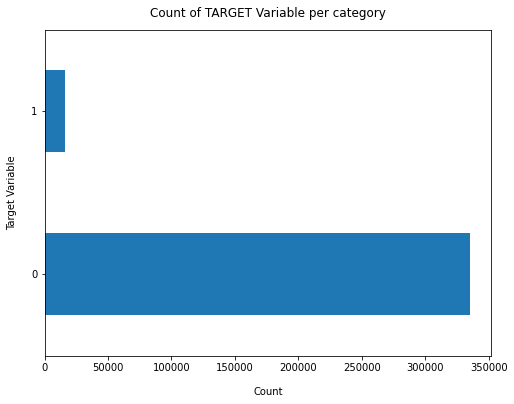

In [30]:
pandas_df['cancellation_check'].value_counts().plot(kind='barh', figsize=(8, 6))
plt.xlabel("Count", labelpad=14)
plt.ylabel("Target Variable", labelpad=14)
plt.title("Count of TARGET Variable per category", y=1.02);

In [31]:
pandas_df.describe()

,actual_premium,tenure,one_yr_loss_ratio,three_yr_loss_ratio,lr_increase,tp_2,psr_2,psr_2_increase_loading,premium_increase,new_premium_2,...,three_yr_all,one_yr_claims,three_yr_claims,five_yr_claims,net_th_lo,net_ad_repair,net_ad_replace,ad_loss_of_si,insured_value,cancellation_check
count,351000.000000,351000.000000,351000.000000,351000.000000,351000.000000,3.484370e+05,3.484370e+05,348437.000000,351000.000000,351000.000000,...,351000.000000,351000.000000,351000.000000,351000.000000,351000.000000,351000.000000,351000.000000,3.510000e+05,3.509960e+05,351000.000000
mean,122.718060,19.258678,0.482671,0.661342,0.009310,1.617353e+02,3.989062e+03,0.005549,0.094818,134.603356,...,0.040553,99.588422,115.234274,123.404121,48.446227,14.850625,7.797470,1.387009e+01,7.883375e+03,0.045308
std,87.579953,13.519204,2.392993,3.371648,0.021073,1.691250e+02,4.120119e+05,0.005641,0.022347,96.406541,...,0.434138,1330.633526,1592.108607,1715.389805,748.758395,307.464838,292.287423,5.224161e+03,6.631124e+03,0.207978
min,1.000000,0.000000,0.000000,0.000000,0.000000,1.903740e-07,6.118765e-03,0.000000,0.080000,1.170000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,6.599987e-03,0.000000
25%,60.000000,8.000000,0.000000,0.000000,0.000000,5.367032e+01,6.100125e-01,0.000000,0.080000,66.600000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,3.771644e+03,0.000000
50%,100.000000,17.000000,0.000000,0.000000,0.000000,1.167906e+02,8.952433e-01,0.005000,0.085000,108.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,5.793972e+03,0.000000
75%,167.000000,29.000000,0.000000,0.000000,0.000000,2.136377e+02,1.363658e+00,0.010000,0.095000,181.440000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,1.164699e+04,0.000000
max,699.000000,244.000000,408.002728,811.822847,0.070000,3.611840e+04,2.416293e+08,0.020000,0.170000,768.900000,...,18.000000,121475.104348,162521.739130,174657.965217,44972.904348,20402.608696,27043.591304,2.151880e+06,1.277814e+06,1.000000


In [32]:
pandas_df.describe(include=['object'])

,vas_code,one_yr_lr_band,three_yr_lr_band,segment,lsm,policy_make_mapped,si_band,tenure_group,most_used_prov,dmuc_24h_distnct_cell_site_qty,peril_filter,five_yr_all,map_age
count,351000,351000,351000,351000,324768,351000,350994,351000,347473,349500,351000,351000,351000
unique,29,6,6,6,11,4,11,5,8,7,2,4,8
top,VIC01,a: 0 to 20%,a: 0 to 20%,aspiration seeker,Group 6,Samsung,5000 to 7500,gt 5yr,Southern Gauteng,7plus,COMP,0,41 to 50
freq,194909,314774,277690,142031,158658,144123,83414,209500,84590,109423,286084,249477,83965


In [33]:
# Skew Value (x)	Description of Data
# -0.5 < x < 0.5	Fairly Symmetrical
# -1 < x < -0.5	Moderate Negative Skew
# 0.5 < x < 1	Moderate Positive Skew
# x < -1	High Negative Skew
# x > 1	High Positve Skew
pandas_df.skew()

actual_premium              1.148291
tenure                      2.141449
one_yr_loss_ratio          40.055097
three_yr_loss_ratio        62.711593
lr_increase                 2.230705
tp_2                       29.211175
psr_2                     578.912411
psr_2_increase_loading      0.495646
premium_increase            2.051852
new_premium_2               1.156793
new_premium_psr           580.709192
monetary_increase           1.659346
count_th_lo                11.799521
count_ad_repair            16.527749
count_ad_replace           28.686070
count_ad                   14.281602
gross_ad_repair            28.041761
gross_ad_replace           50.681156
gross_ad                   28.497159
gross_th_lo                21.802735
one_yr_all                 13.175713
three_yr_all               14.373207
one_yr_claims              25.261849
three_yr_claims            26.959398
five_yr_claims             26.390463
net_th_lo                  21.549231
net_ad_repair              29.013335
n

In [34]:
# High kurtosis (>3) indicates a large number of outliers and low kurtosis (<3) a lack of outliers
pandas_df.kurtosis()

actual_premium                 0.513119
tenure                        15.689718
one_yr_loss_ratio           4741.200085
three_yr_loss_ratio        10936.246019
lr_increase                    3.503781
tp_2                        5867.156512
psr_2                     339478.374662
psr_2_increase_loading        -1.090042
premium_increase               3.158439
new_premium_2                  0.556600
new_premium_psr           341715.615354
monetary_increase              3.425616
count_th_lo                  137.229474
count_ad_repair              271.168018
count_ad_replace             820.895276
count_ad                     201.965297
gross_ad_repair              972.171872
gross_ad_replace            2970.025899
gross_ad                    1041.166535
gross_th_lo                  580.855153
one_yr_all                   215.189668
three_yr_all                 259.800508
one_yr_claims               1014.547719
three_yr_claims             1188.783484
five_yr_claims              1116.790004


In [35]:
features = ['actual_premium', 'tenure', 'one_yr_loss_ratio', 'three_yr_loss_ratio',
       'lr_increase', 'tp_2', 'psr_2', 'psr_2_increase_loading',
       'premium_increase', 'new_premium_2', 'new_premium_psr',
       'monetary_increase', 'cancellation_check', 'count_th_lo',
       'count_ad_repair', 'count_ad_replace', 'insured_value', 'count_ad',
       'gross_ad_repair', 'gross_ad_replace', 'gross_th_lo', 'gross_ad',
       'one_yr_all', 'three_yr_all', 'one_yr_claims', 'three_yr_claims', 'five_yr_claims',
       'net_th_lo', 'net_ad_repair', 'net_ad_replace', 'ad_loss_of_si']

In [35]:
features1 = ['tenure']

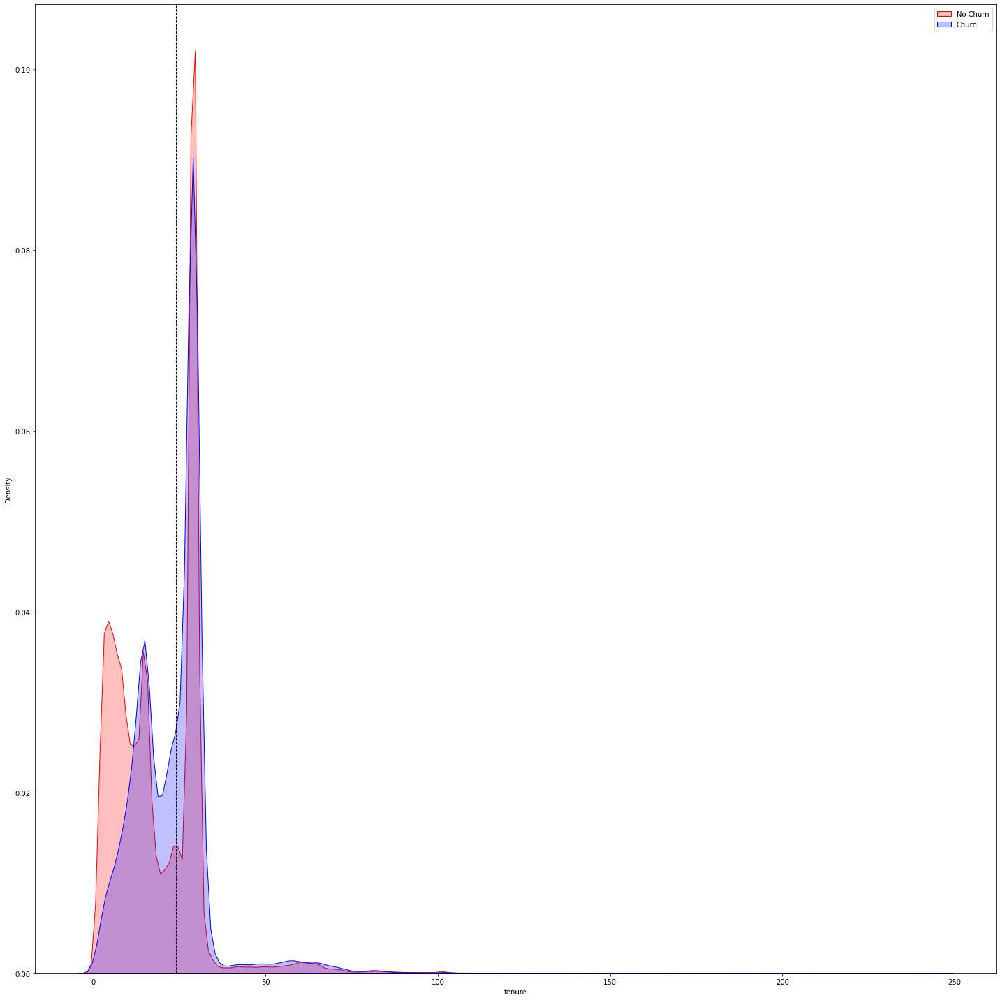

In [37]:
f, axes = plt.subplots(1, 1,  figsize=(20, 20))  
y = 0;
for name in features1:
    Mth = sns.kdeplot(x = pandas_df[name][(pandas_df["cancellation_check"] == 0) ],ax=axes, color="Red", shade = True)
    Mth = sns.kdeplot(x = pandas_df[name][(pandas_df["cancellation_check"] == 1) ], ax=axes, color="Blue", shade= True)
    Mth.legend(["No Churn","Churn"],loc='upper right')
    y = y + 1
plt.axvline(24, color='k', linestyle='dashed', linewidth=1)
plt.tight_layout()
plt.show()

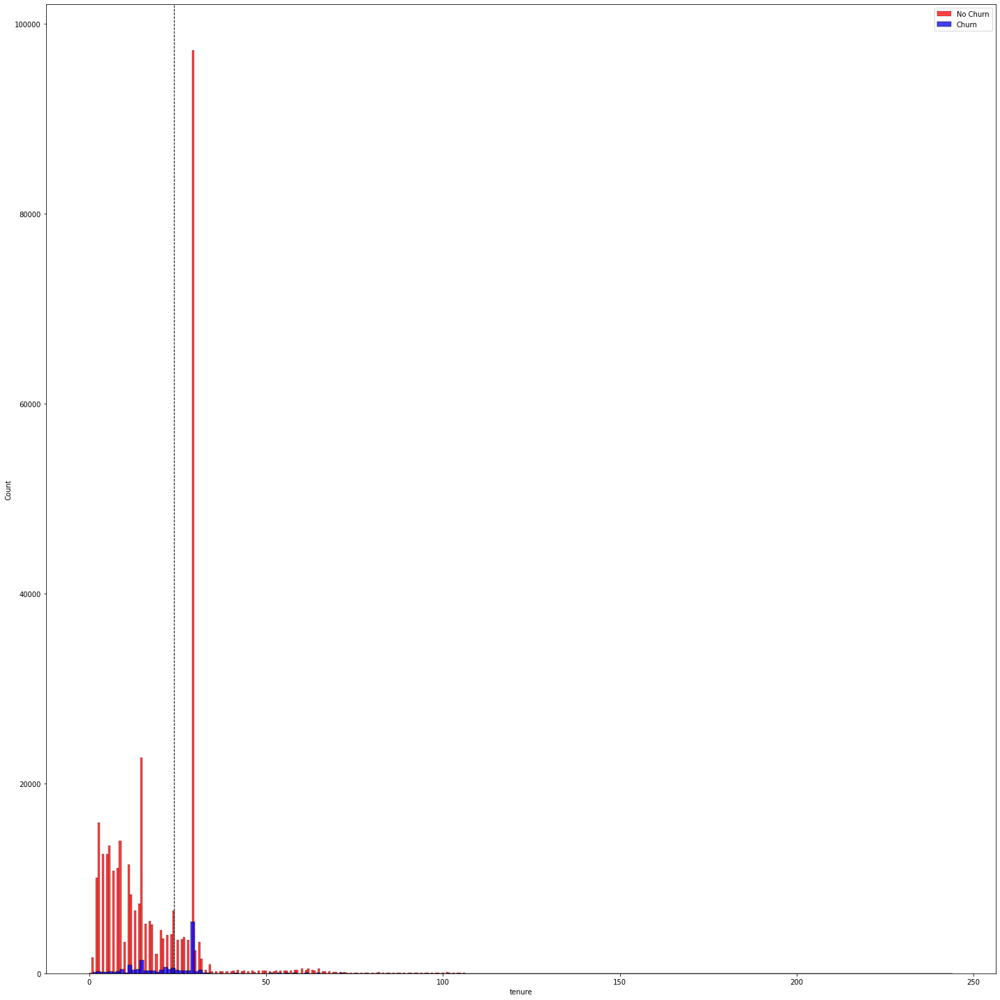

In [38]:
f, axes = plt.subplots(1, 1,  figsize=(20, 20))  
y = 0;
for name in features1:
    Mth = sns.histplot(x = pandas_df[name][(pandas_df["cancellation_check"] == 0) ],ax=axes, color="Red")
    Mth = sns.histplot(x = pandas_df[name][(pandas_df["cancellation_check"] == 1) ], ax=axes, color="Blue")
    Mth.legend(["No Churn","Churn"],loc='upper right')
    y = y + 1
plt.axvline(24, color='k', linestyle='dashed', linewidth=1)
plt.tight_layout()
plt.show()

In [36]:
pandas_df['tenure'].mode()

0    29
dtype: int32

/home/nxums003/.virtualenv/nxums003/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/home/nxums003/.virtualenv/nxums003/lib/python3.6/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


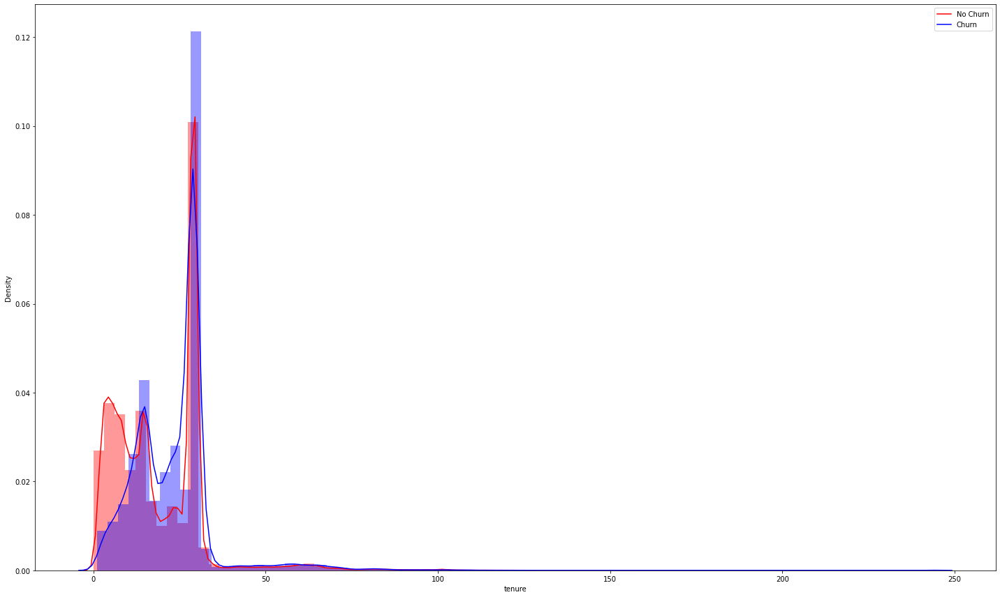

In [40]:
f, axes = plt.subplots(1, 1,  figsize=(20, 12))
for name in features1:
    zeros = pandas_df[name][(pandas_df["cancellation_check"] == 0)]
    ones = pandas_df[name][(pandas_df["cancellation_check"] == 1) ]
    Mth = sns.distplot(zeros, kde=True, bins=80, hist=True,ax=axes, color="Red")
    Mth = sns.distplot(ones, kde=True, bins=80, hist=True,ax=axes, color="Blue")
    Mth.legend(["No Churn","Churn"],loc='upper right')
plt.tight_layout()
plt.show()

In [41]:
def bins_calc(a ,b, ini, final, spaces):
    def function_hist(a, ini, final, spaces):

        # 12 bins
        bins = np.linspace(ini, final, spaces +1)
        weightsa = np.ones_like(a)/float(len(a))
        hist = np.histogram(np.array(a), bins)
        return hist

    bins = function_hist(a, ini, final, spaces)[1]
    tot = function_hist(a, ini, final, spaces)[0]
    churned = function_hist(b, ini, final, spaces)[0]
    list_of_tuples = list(zip(bins, tot, churned))
    df = pd.DataFrame(list_of_tuples,
                      columns=['bins', 'tot', 'churned'])
    return df
a = pandas_df['tenure']
b = pandas_df[pandas_df['cancellation_check'] == 1]['tenure']
df = bins_calc(a, b, 0, 36, 12)
df['churn_rate'] = df['churned']/df['tot']

In [42]:
#df.set_index("bins", inplace=True)

In [43]:
df

,bins,tot,churned,churn_rate
0,0.0,11835,99,0.008365
1,3.0,41495,478,0.011519
2,6.0,35894,591,0.016465
3,9.0,29676,973,0.032787
4,12.0,23397,1203,0.051417
5,15.0,35398,1978,0.055879
6,18.0,12594,832,0.066063
7,21.0,12813,1077,0.084055
8,24.0,15032,1271,0.084553
9,27.0,110452,6009,0.054404


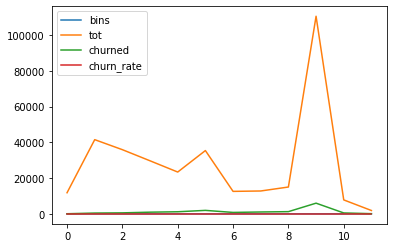

In [44]:
df.plot()

plt.show()

<AxesSubplot:>

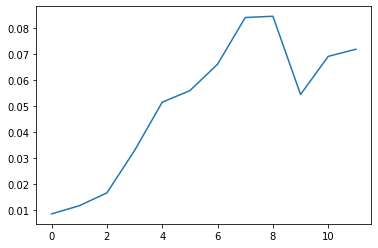

In [45]:
df['churn_rate'].plot()

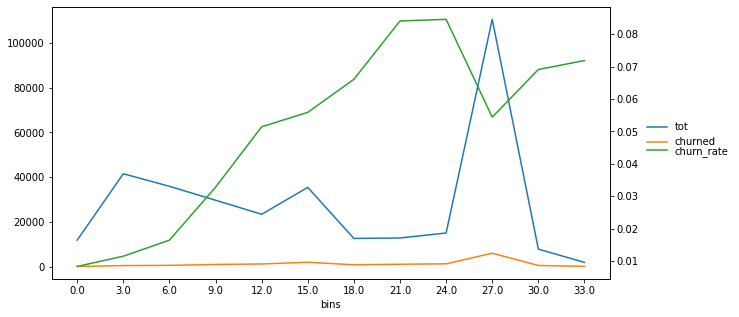

In [46]:
ax = df.plot(x='bins', y=['tot','churned','churn_rate'], secondary_y='churn_rate', figsize=(10, 5))
xticks = df['bins']
x = df['bins']
plt.xticks(x,xticks)
# move the legend for each y axis
ax.legend(bbox_to_anchor=(1.05, 0.53), loc='center left', frameon=False)
ax.right_ax.legend(bbox_to_anchor=(1.05, 0.47), loc='center left', frameon=False)

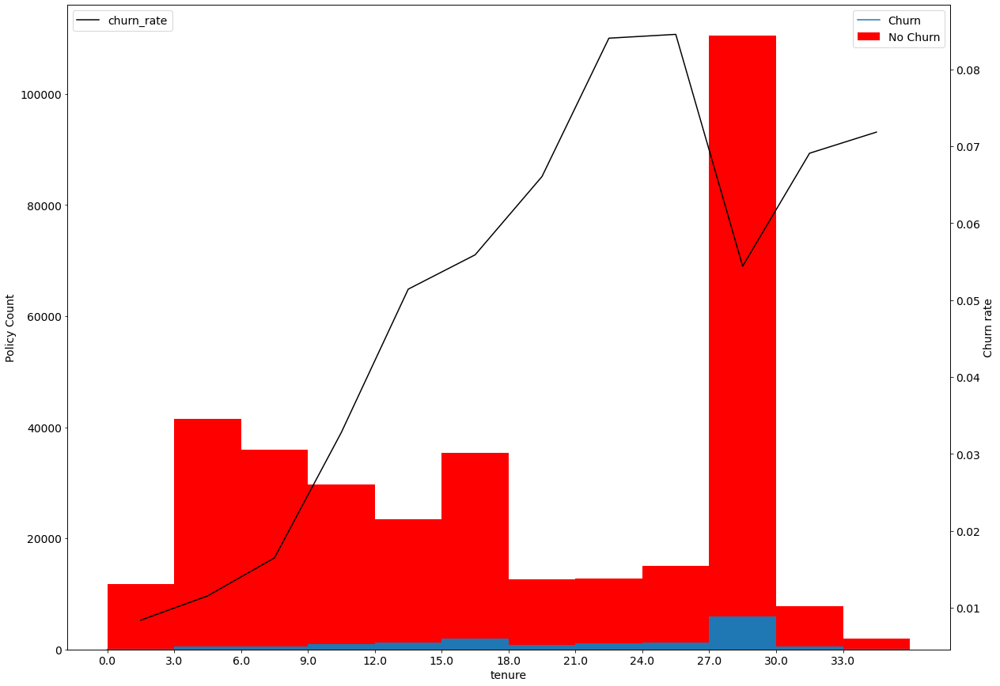

In [191]:
plt.figure(figsize=(20, 15))  # width:20, height:3
plt.bar(df['bins'], df['tot'], align='edge', width=3,color="Red")
plt.bar(df['bins'], df['churned'], align='edge', width=3)
plt.plot(df['bins'], df['churn_rate'] )
x = df['bins']
SMALL_SIZE = 14
MEDIUM_SIZE = 14
BIGGER_SIZE = 14

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
plt.xticks(x,xticks)
plt.legend(["Churn","No Churn",],loc='upper right')
plt.ylabel('Policy Count') 
plt.xlabel('tenure')
axes2 = plt.twinx()
axes2.plot(x +1.5, df['churn_rate'], color='k', label='churn_rate')
axes2.set_ylabel('Churn rate')
axes2.legend(['churn_rate'],  loc='upper left')


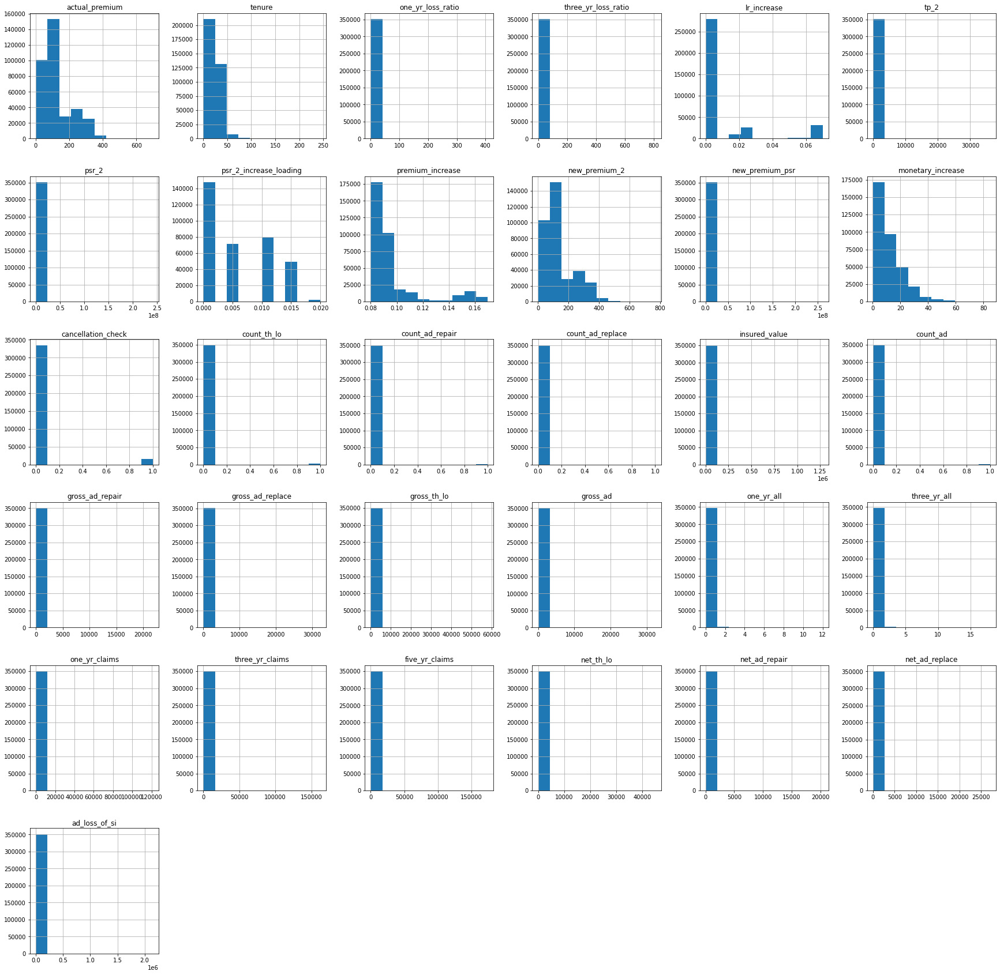

In [33]:
#features = cols = pandas_df.select_dtypes([np.number]).columns # create a list of all numerical features

pandas_df[features].hist(figsize=(30,30));

<AxesSubplot:>

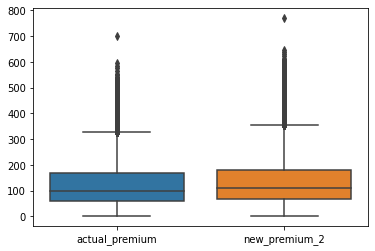

In [47]:
sns.boxplot(data=pandas_df[["actual_premium", "new_premium_2"]])

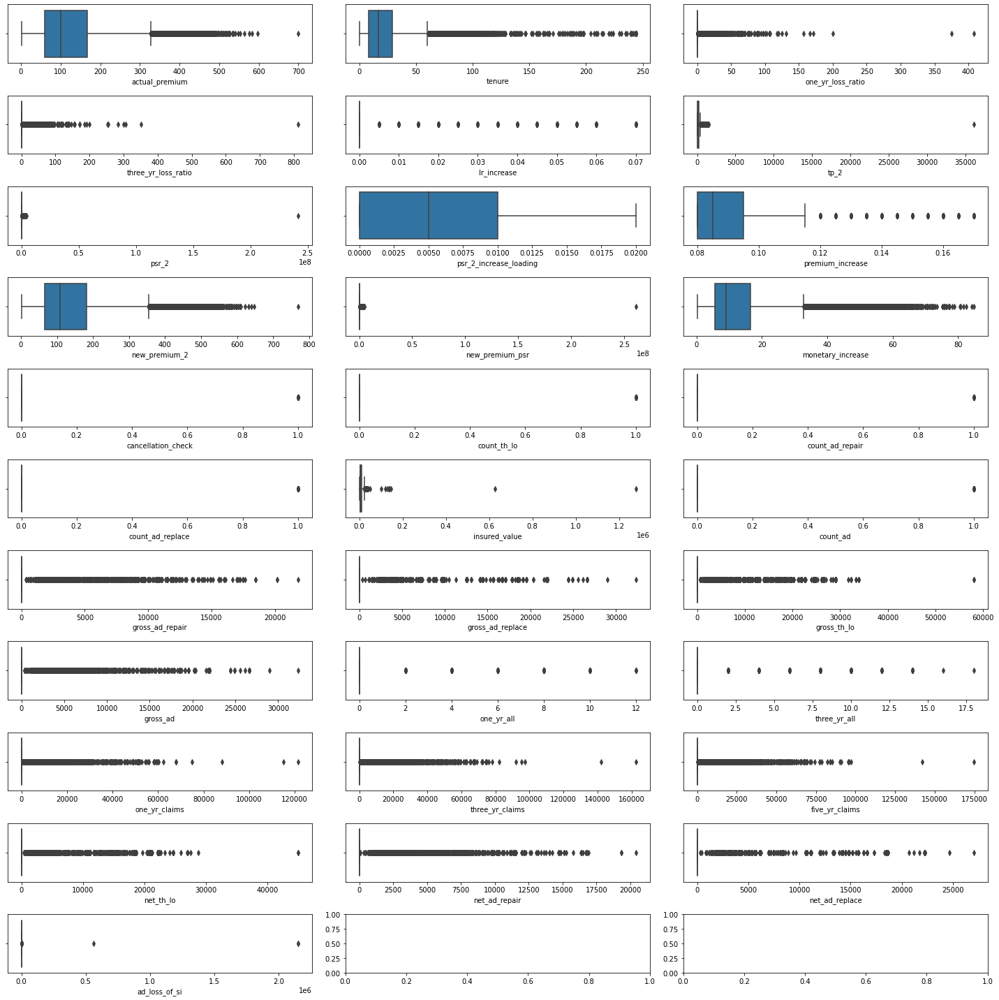

In [35]:
f, axes = plt.subplots(round(len(features)/3) + 1, 3,  figsize=(20, 20))  
y = 0;
for name in features:
    i, j = divmod(y, 3)
    sns.boxplot(x=pandas_df[name], ax=axes[i, j])
    y = y + 1

plt.tight_layout()
plt.show()

/home/nxums003/.virtualenv/nxums003/lib/python3.6/site-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)
/home/nxums003/.virtualenv/nxums003/lib/python3.6/site-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


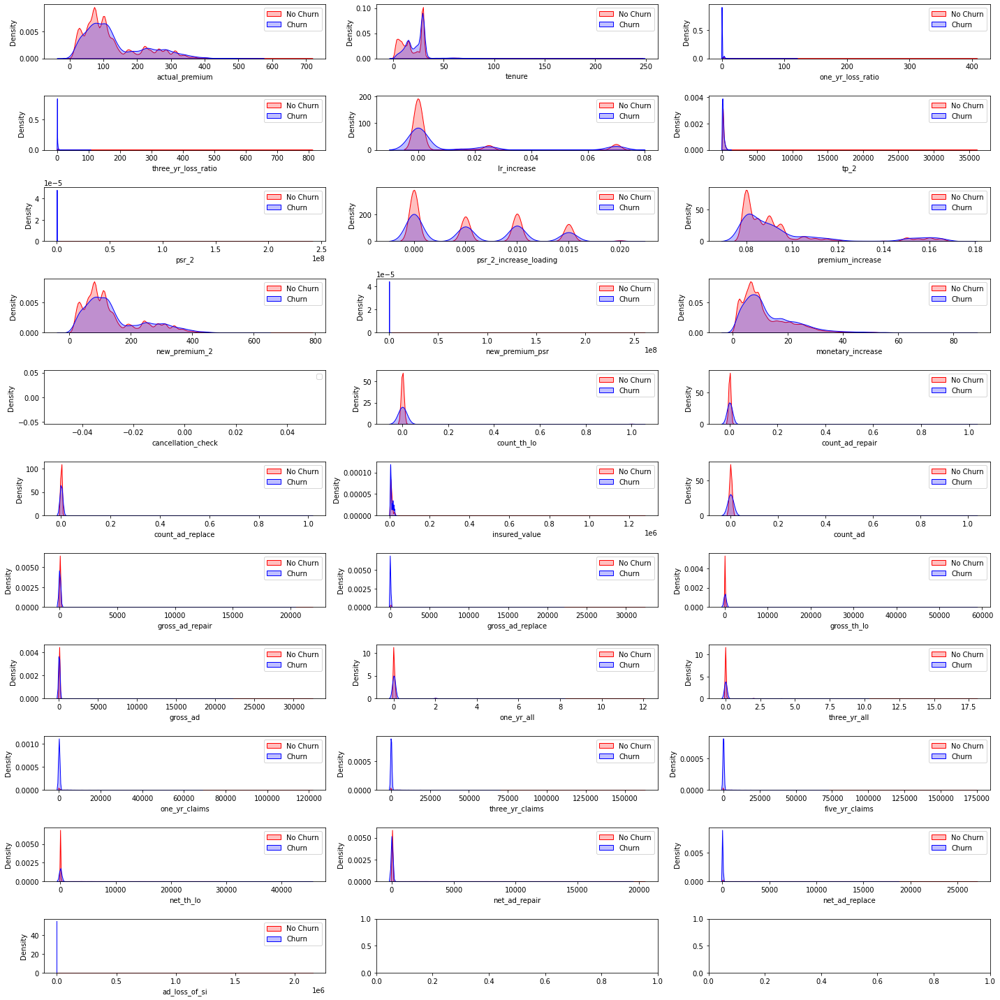

In [36]:
f, axes = plt.subplots(round(len(features)/3) + 1, 3,  figsize=(20, 20))  
y = 0;
for name in features:
    i, j = divmod(y, 3)
    #sns.boxplot(x=pandas_df[name], ax=axes[i, j])
    Mth = sns.kdeplot(x = pandas_df[name][(pandas_df["cancellation_check"] == 0) ],ax=axes[i, j], color="Red", shade = True)
    Mth = sns.kdeplot(x = pandas_df[name][(pandas_df["cancellation_check"] == 1) ], ax=axes[i, j], color="Blue", shade= True)
    Mth.legend(["No Churn","Churn"],loc='upper right')
    y = y + 1

plt.tight_layout()
plt.show()

In [35]:
# Mth = sns.kdeplot(x = pandas_df['tenure'][(pandas_df["cancellation_check"] == 0) ],
#                 color="Red", shade = True)
# Mth = sns.kdeplot(x = pandas_df['tenure'][(pandas_df["cancellation_check"] == 1) ],
#                 ax =Mth, color="Blue", shade= True)
# Mth.legend(["No Churn","Churn"],loc='upper right')
# Mth.set_ylabel('Density')
# Mth.set_xlabel('Monthly Charges')
# Mth.set_title('Monthly charges by churn')

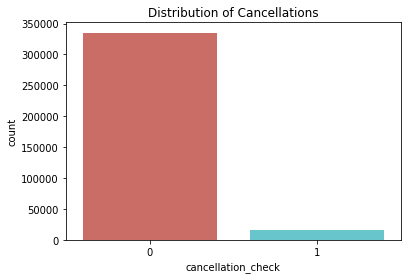

In [36]:
#Bar plot
sns.countplot(x = 'cancellation_check', data = pandas_df, palette="hls")
plt.title("Distribution of Cancellations");

In [ ]:
# features_obj = pandas_df.select_dtypes(exclude = [np.number]).columns # create a list of all numerical features
# features_obj

In [49]:
objects = [ 'vas_code', 'one_yr_lr_band','three_yr_lr_band', 'segment', 'lsm', 'policy_make_mapped', \
           'si_band', 'gendr_cd', 'tenure_group', 'most_used_prov', 
           'dmuc_24h_distnct_cell_site_qty', 'five_yr_all', 'peril_filter']

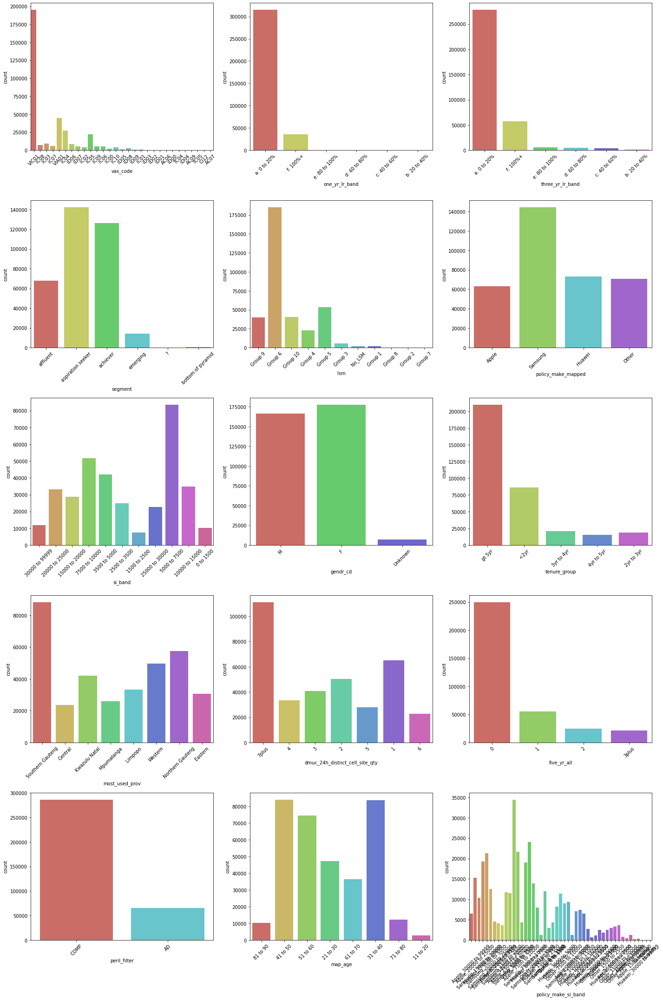

In [39]:
f, axes = plt.subplots(round(len(objects)/3), 3,  figsize=(20, 30))  
y = 0
for name in objects:
    i, j = divmod(y, 3)
    ax = sns.countplot(x = pandas_df[name], ax=axes[i, j], palette="hls")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
    y = y + 1
plt.tight_layout()
plt.show()

In [ ]:
# #Bar plot
# plt.figure(figsize=(12, 8))
# ax = sns.countplot(x = 'vas_code', data = pandas_df, palette="hls")
# ax.set_xticklabels(ax.get_xticklabels(), rotation=55)
# plt.title("Distribution of vas code ")

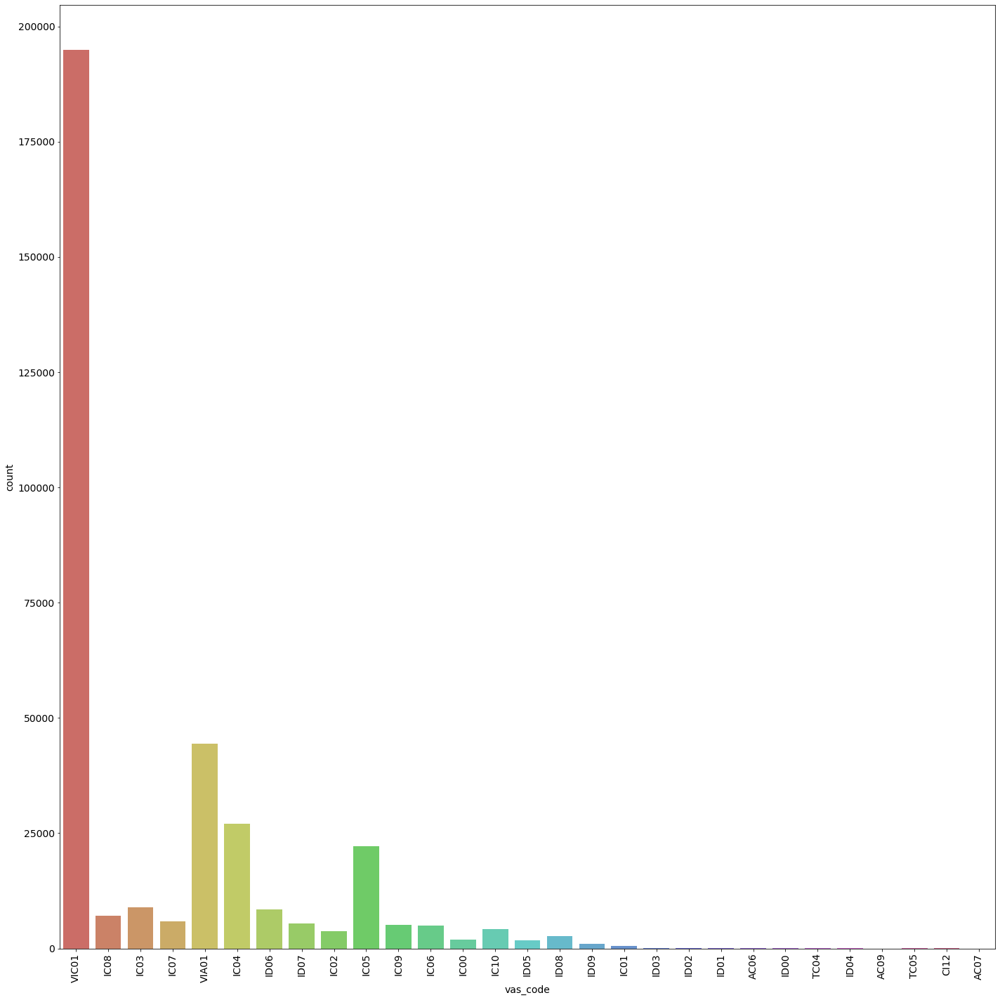

In [276]:
f, axes = plt.subplots(1,1,  figsize=(20, 20))  
y = 0;
vis_objects = ['vas_code']
for name in vis_objects:
    ax = sns.countplot(x = pandas_df[name], ax=axes, palette="hls")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    y = y + 1

plt.tight_layout()
plt.show()

In [38]:
colors = ['#00A5E0', '#DD403A']
df_churned = pandas_df[pandas_df['cancellation_check'] == 1]
df_retained = pandas_df[pandas_df['cancellation_check'] == 0]

In [39]:
def plot_continuous(feature):
    '''Plot a histogram and boxplot for the churned and retained distributions for the specified feature.'''
    df_func = pandas_df.copy()
    df_func['cancellation_check'] = df_func['cancellation_check'].astype('category')
 
    fig, (ax1, ax2) = plt.subplots(2,
                                   figsize=(9, 7),
                                   sharex=True,
                                   gridspec_kw={'height_ratios': (.7, .3)})
 
    for df, color, label in zip([df_retained, df_churned], colors, ['Retained', 'Churned']):
        sns.histplot(data=df,
                     x=feature,
                     bins=15,
                     color=color,
                     alpha=0.66,
                     edgecolor='firebrick',
                     label=label,
                     kde=False,
                     ax=ax1)
    ax1.legend()
 
    sns.boxplot(x=feature, y='cancellation_check', data=df_func, palette=colors, ax=ax2)
    ax2.set_ylabel('')
    ax2.set_yticklabels(['Retained', 'Churned'])
 
    plt.tight_layout();

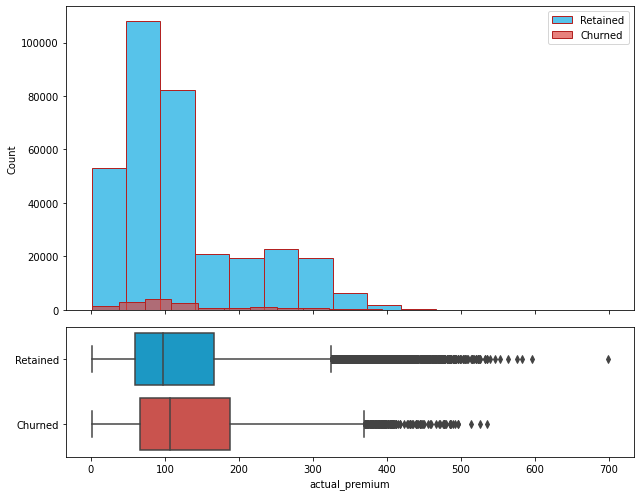

In [37]:
plot_continuous('actual_premium')

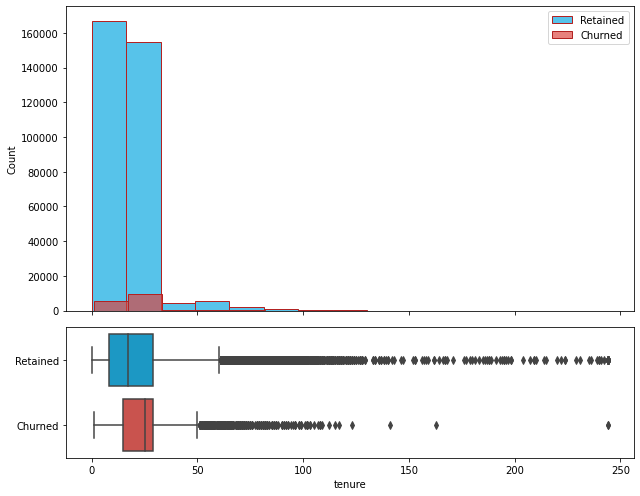

In [38]:
plot_continuous('tenure')

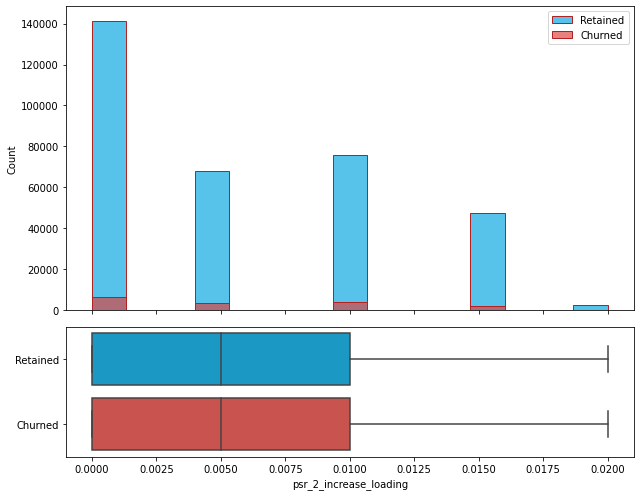

In [39]:
plot_continuous('psr_2_increase_loading')

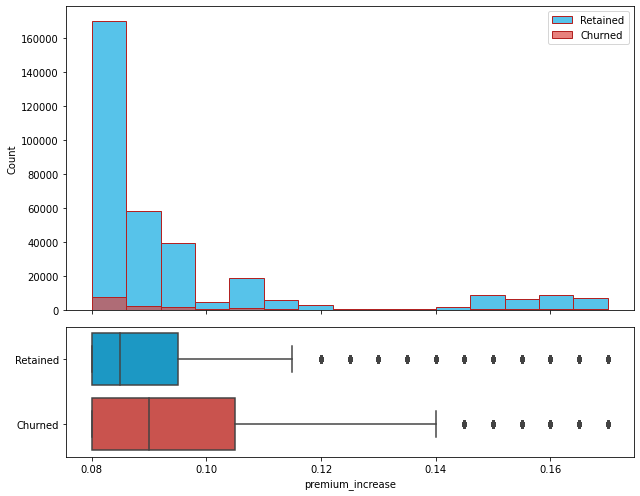

In [40]:
plot_continuous('premium_increase')

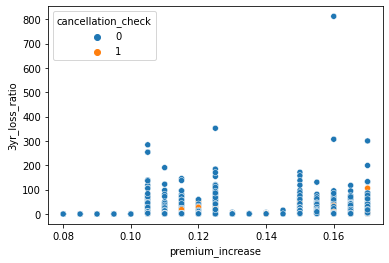

In [41]:
sns.scatterplot(x='premium_increase',y='3yr_loss_ratio',hue='cancellation_check', data=pandas_df);

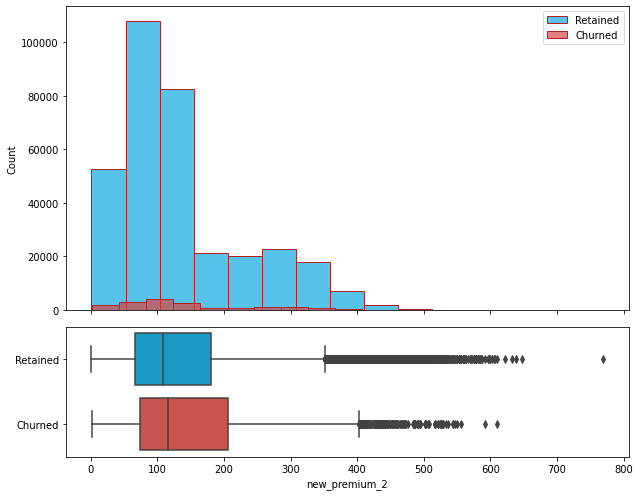

In [42]:
plot_continuous('new_premium_2')

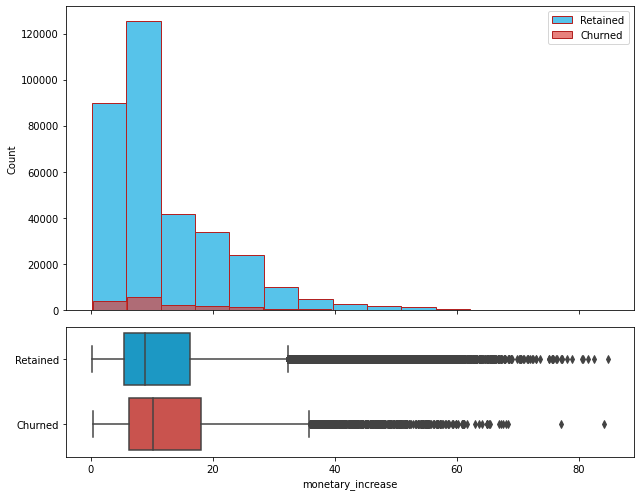

In [43]:
plot_continuous('monetary_increase')

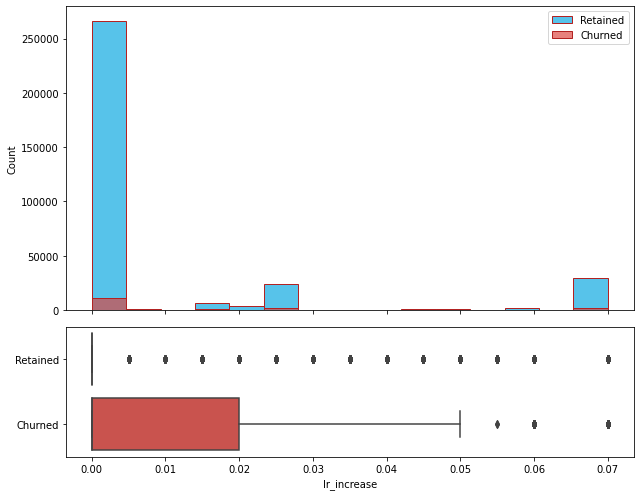

In [44]:
plot_continuous('lr_increase')

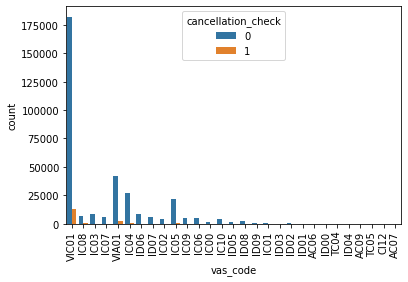

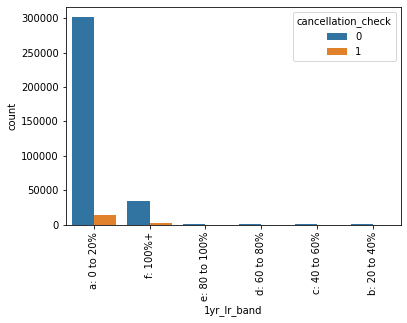

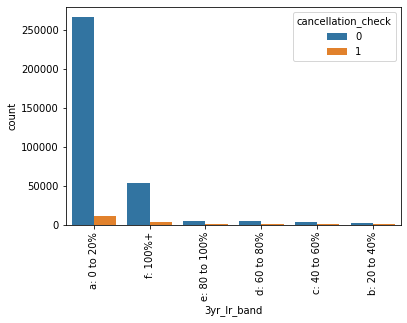

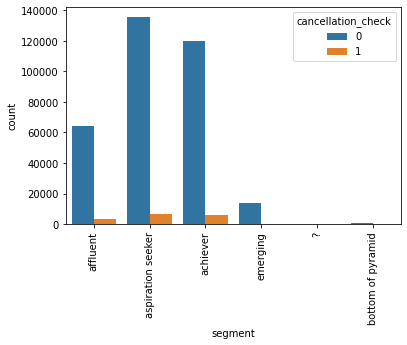

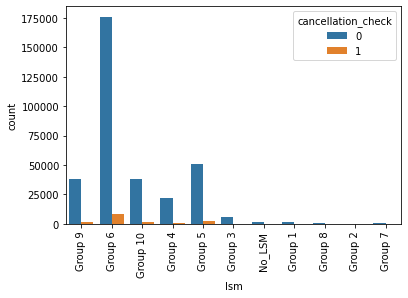

...

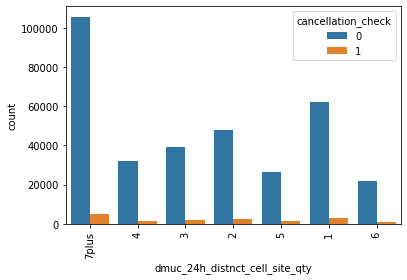

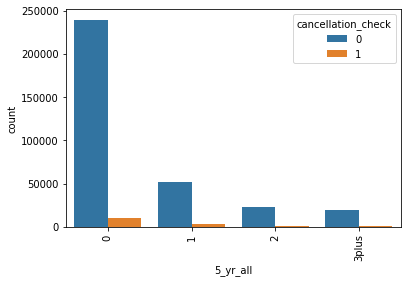

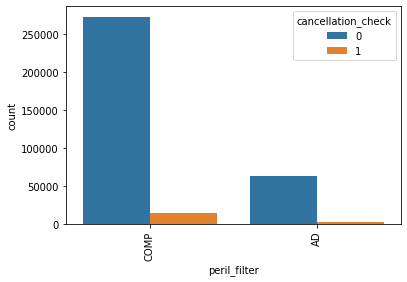

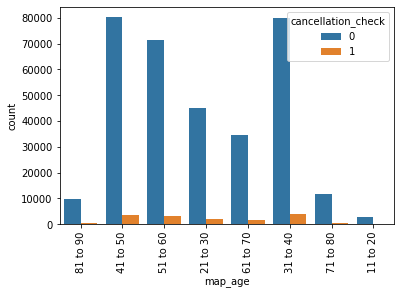

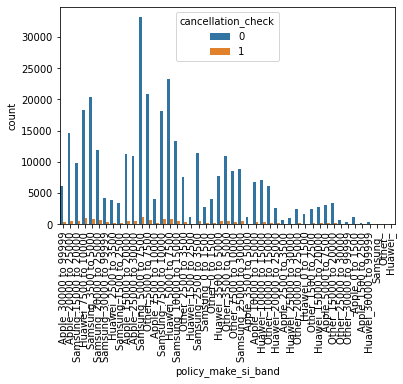

In [104]:
for i, predictor in enumerate(pandas_df[objects]):
    plt.figure(i)
    ax = sns.countplot(data=pandas_df, x=predictor, hue='cancellation_check')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    #cancellation rates

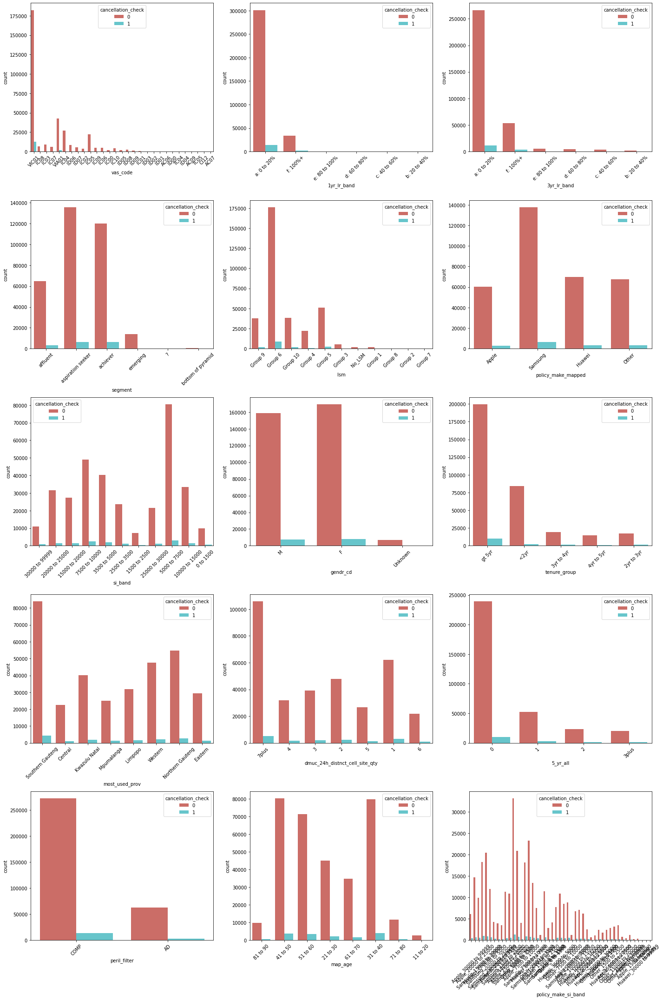

In [45]:
f, axes = plt.subplots(round(len(objects)/3), 3,  figsize=(20, 30))  
y = 0
for name in objects:
    i, j = divmod(y, 3)
    ax = sns.countplot(x = pandas_df[name],data = pandas_df, ax=axes[i, j],  hue='cancellation_check', palette="hls")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
    y = y + 1
plt.tight_layout()
plt.show()



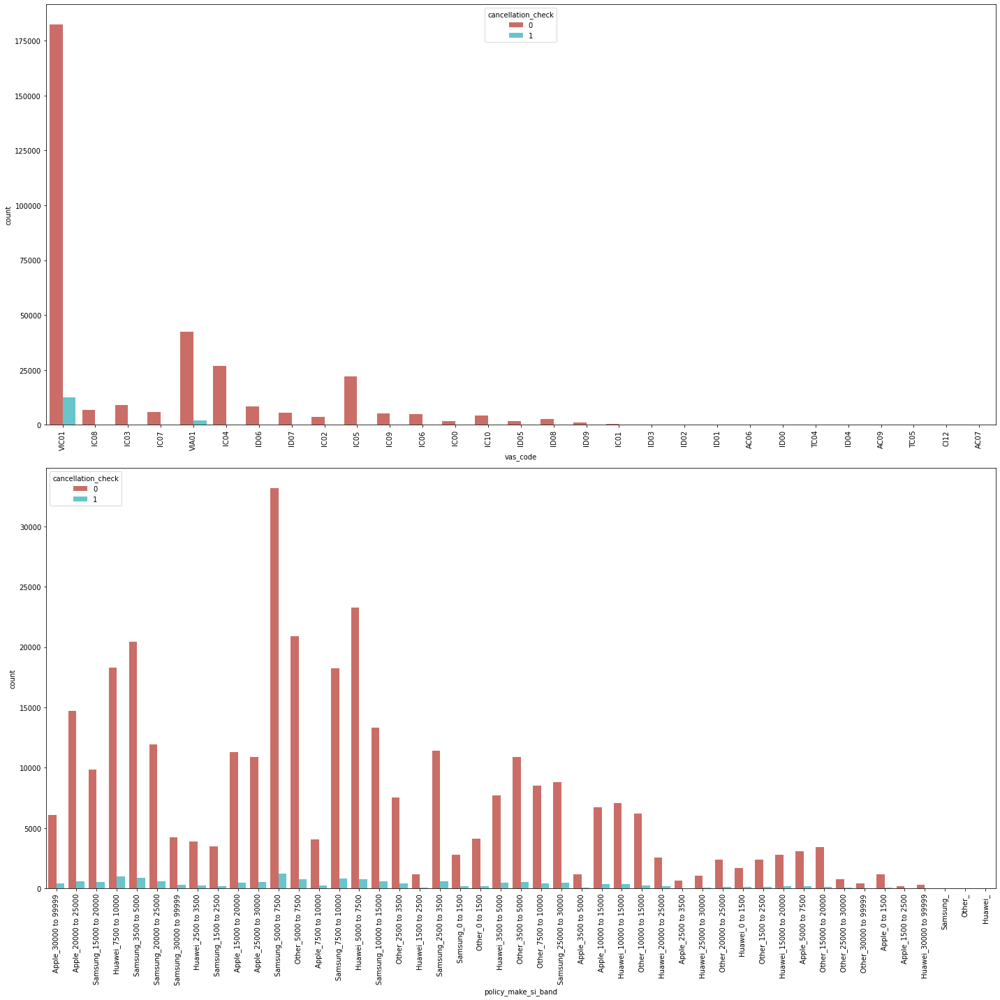

In [47]:
f, axes = plt.subplots(2,1,  figsize=(20, 20))  
y = 0;
vis_objects = ['vas_code','policy_make_si_band']
for name in vis_objects:
    ax = sns.countplot(x = pandas_df[name], data = pandas_df, ax=axes[y], palette="hls", hue="cancellation_check")
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    y = y + 1

plt.tight_layout()
plt.show()

In [37]:
pandas_df_woo = pandas_df

In [38]:
pandas_df = s

# Multivariate Analysis: Non-Graphical

In [39]:
round(pandas_df.corr(),2)

,actual_premium,tenure,one_yr_loss_ratio,three_yr_loss_ratio,lr_increase,tp_2,psr_2,psr_2_increase_loading,premium_increase,new_premium_2,...,three_yr_all,one_yr_claims,three_yr_claims,five_yr_claims,net_th_lo,net_ad_repair,net_ad_replace,ad_loss_of_si,insured_value,cancellation_check
actual_premium,1.00,0.13,0.04,0.03,0.11,0.70,0.00,0.11,0.13,1.00,...,0.03,0.07,0.07,0.07,0.06,0.04,0.02,0.00,0.75,0.03
tenure,0.13,1.00,-0.05,-0.08,0.05,-0.01,-0.01,-0.20,-0.00,0.13,...,0.01,0.00,0.01,0.01,-0.00,0.01,0.00,0.00,0.07,0.07
one_yr_loss_ratio,0.04,-0.05,1.00,0.70,0.57,0.07,-0.00,0.08,0.56,0.05,...,0.03,0.03,0.03,0.03,0.01,0.00,0.00,-0.00,0.02,0.01
three_yr_loss_ratio,0.03,-0.08,0.70,1.00,0.39,0.05,-0.00,0.06,0.39,0.04,...,0.03,0.03,0.03,0.03,0.01,0.00,0.00,0.00,0.02,0.01
lr_increase,0.11,0.05,0.57,0.39,1.00,0.12,-0.00,0.10,0.97,0.14,...,0.07,0.05,0.06,0.06,0.02,0.02,0.01,0.00,0.03,0.04
tp_2,0.70,-0.01,0.07,0.05,0.12,1.00,-0.01,0.54,0.25,0.70,...,0.03,0.07,0.07,0.07,0.07,0.03,0.02,-0.00,0.71,0.02
psr_2,0.00,-0.01,-0.00,-0.00,-0.00,-0.01,1.00,-0.01,-0.00,-0.00,...,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.00
psr_2_increase_loading,0.11,-0.20,0.08,0.06,0.10,0.54,-0.01,1.00,0.35,0.12,...,0.03,0.03,0.03,0.03,0.03,0.01,0.01,-0.00,0.11,0.00
premium_increase,0.13,-0.00,0.56,0.39,0.97,0.25,-0.00,0.35,1.00,0.16,...,0.07,0.06,0.06,0.06,0.02,0.02,0.01,0.00,0.06,0.03
new_premium_2,1.00,0.13,0.05,0.04,0.14,0.70,-0.00,0.12,0.16,1.00,...,0.03,0.07,0.08,0.08,0.06,0.04,0.02,0.00,0.75,0.03


# Multivariate Analysis: Graphical

In [ ]:
# gross_ad_replace
# net_ad_replace
# ad_loss_of_si
# count_ad_replace

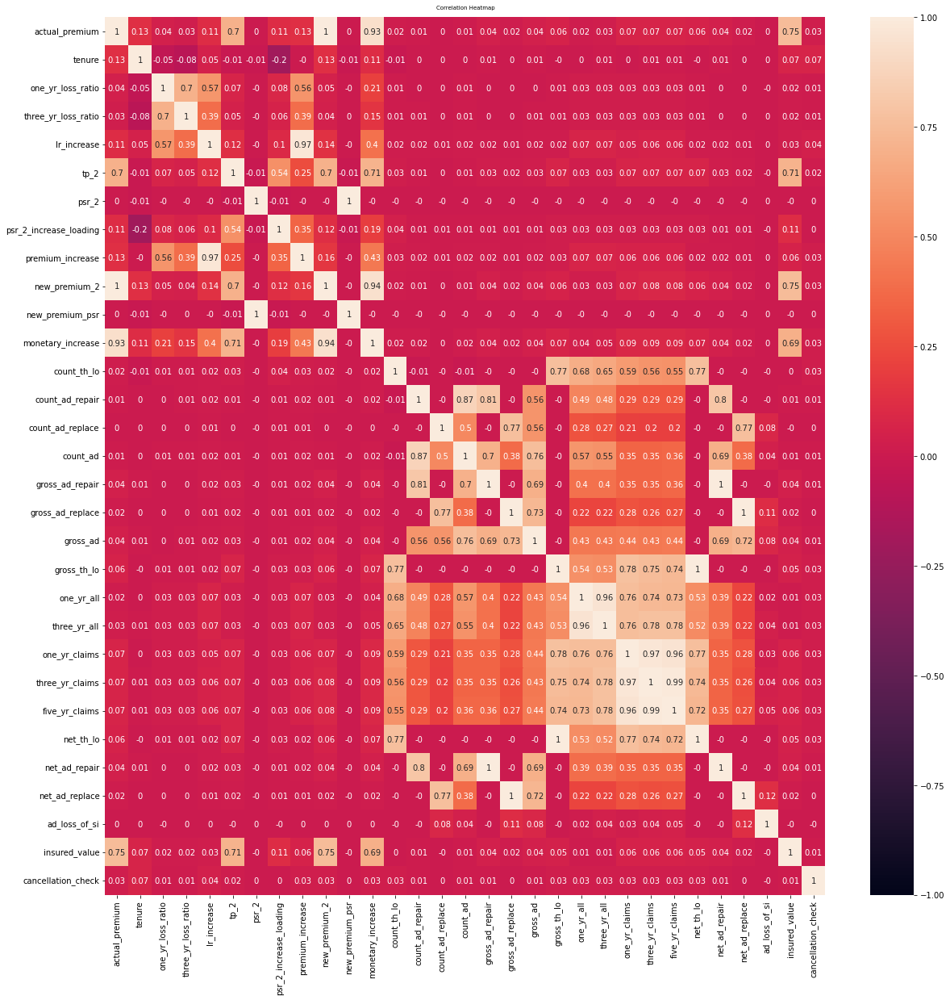

In [40]:
#Heatmap
plt.figure(figsize=(20, 20))
heatmap = sns.heatmap(round(pandas_df.corr(),2), vmin=-1, vmax=1, annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':7}, pad=10);

<AxesSubplot:>

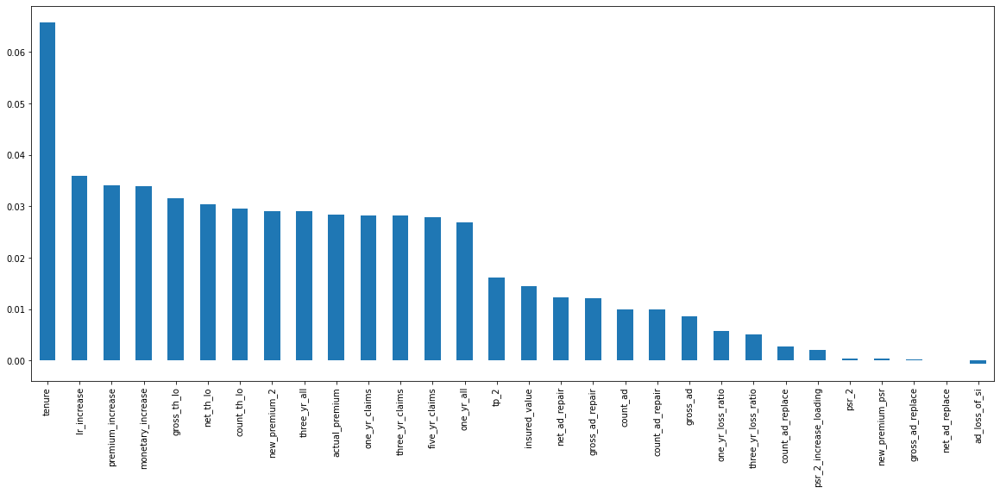

In [41]:
plt.figure(figsize=(20,8))
pandas_df.corr()['cancellation_check'].sort_values(ascending = False)[1:].plot(kind='bar')

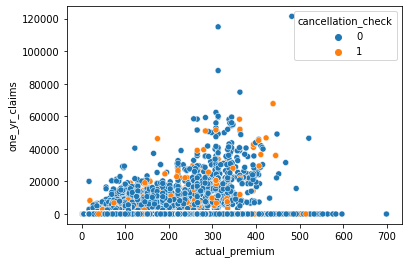

In [55]:
#Scatterplot
sns.scatterplot(x='actual_premium',y='one_yr_claims',hue='cancellation_check', data=pandas_df_woo);

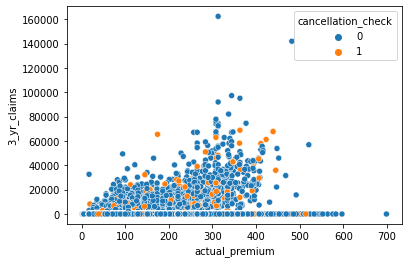

In [111]:
#Scatterplot
sns.scatterplot(x='actual_premium',y='3_yr_claims',hue='cancellation_check', data=pandas_df_woo);

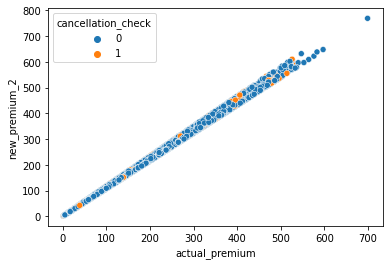

In [112]:
#Scatterplot
sns.scatterplot(x='actual_premium',y='new_premium_2',hue='cancellation_check', data=pandas_df_woo);

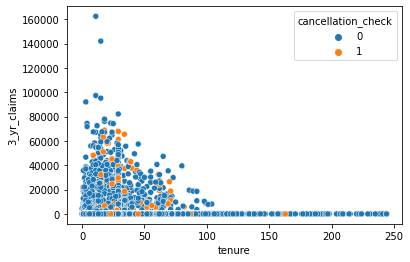

In [113]:
#Scatterplot
sns.scatterplot(x='tenure',y='3_yr_claims',hue='cancellation_check', data=pandas_df_woo);

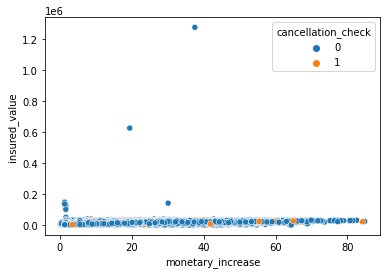

In [114]:
#Scatterplot
sns.scatterplot(x='monetary_increase',y='insured_value',hue='cancellation_check', data=pandas_df_woo);

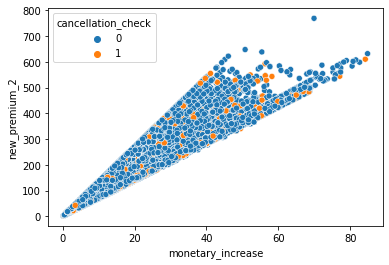

In [115]:
#Scatterplot
sns.scatterplot(x='monetary_increase',y='new_premium_2',hue='cancellation_check', data=pandas_df_woo);

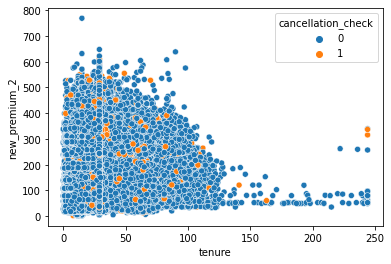

In [116]:
#Scatterplot
sns.scatterplot(x='tenure',y='new_premium_2',hue='cancellation_check', data=pandas_df_woo);

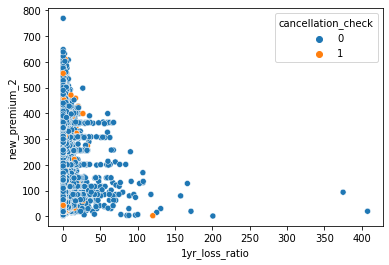

In [117]:
#Scatterplot
sns.scatterplot(x='1yr_loss_ratio',y='new_premium_2',hue='cancellation_check', data=pandas_df_woo);

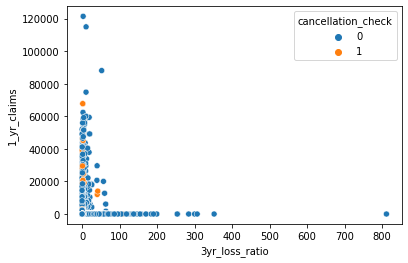

In [118]:
#Scatterplot
sns.scatterplot(x='3yr_loss_ratio',y='1_yr_claims',hue='cancellation_check', data=pandas_df_woo);

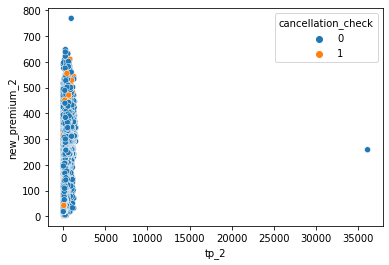

In [119]:
#Scatterplot
sns.scatterplot(x='tp_2',y='new_premium_2',hue='cancellation_check', data=pandas_df_woo);

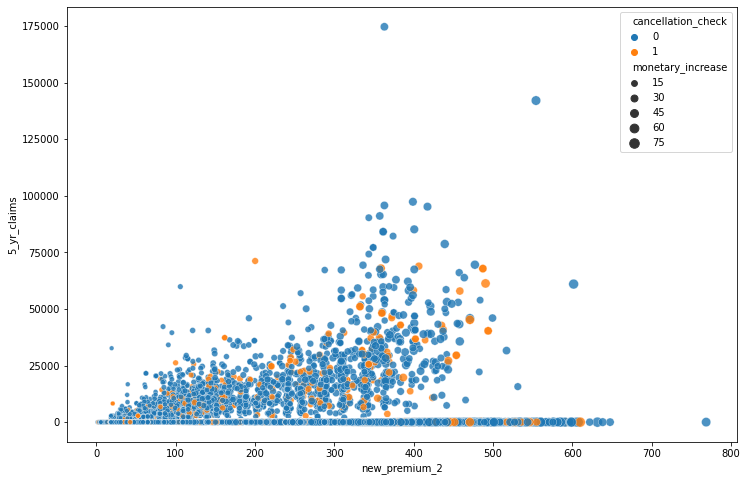

In [120]:
#Bubble Plots
plt.figure(figsize=(12,8))
sns.scatterplot(x="new_premium_2",
                y="5_yr_claims",
                size="monetary_increase",
                sizes=(20,100),
                alpha=0.8,
                hue="cancellation_check",
                data=pandas_df_woo);

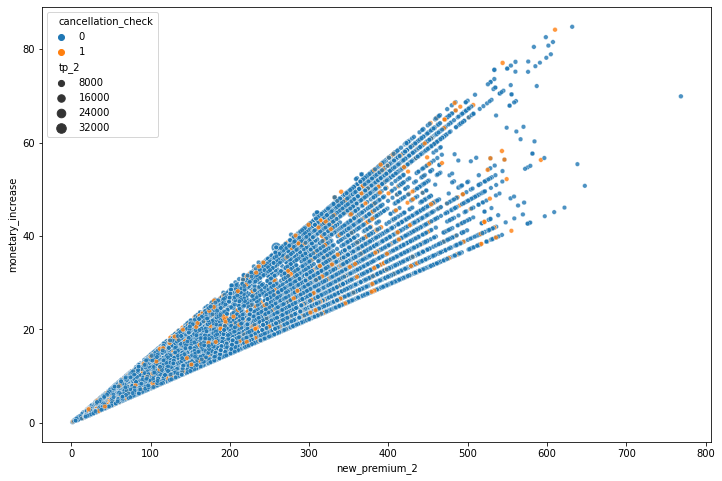

In [121]:
#Bubble Plots
plt.figure(figsize=(12,8))
sns.scatterplot(x="new_premium_2",
                y="monetary_increase",
                size="tp_2",
                sizes=(20,100),
                alpha=0.8,
                hue="cancellation_check",
                data=pandas_df_woo);

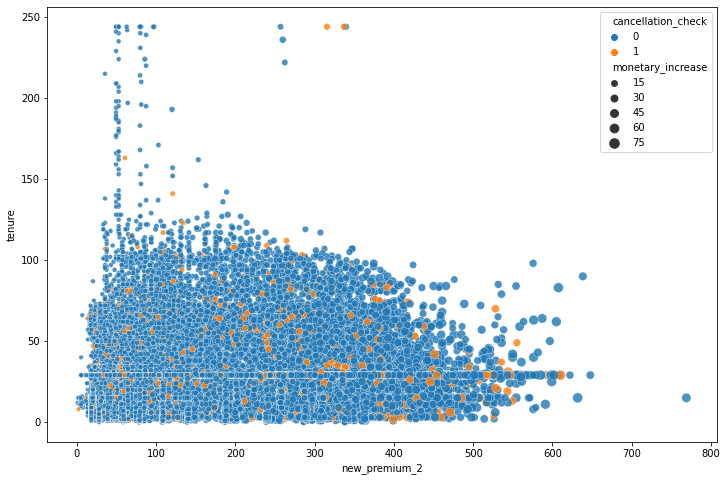

In [122]:
#Bubble Plots
plt.figure(figsize=(12,8))
sns.scatterplot(x="new_premium_2",
                y="tenure",
                size="monetary_increase",
                sizes=(20,100),
                alpha=0.8,
                hue="cancellation_check",
                data=pandas_df_woo);

In [54]:
#Pair Plot
sns.set_style("whitegrid");
plt.figure(figsize=(12, 8))
sns.pairplot(pandas_df_woo[features], hue="cancellation_check");
plt.show();

KeyboardInterrupt: 

<Figure size 864x576 with 0 Axes>

Error in callback <function flush_figures at 0x7ff6fcaf0510> (for post_execute):


KeyboardInterrupt: 

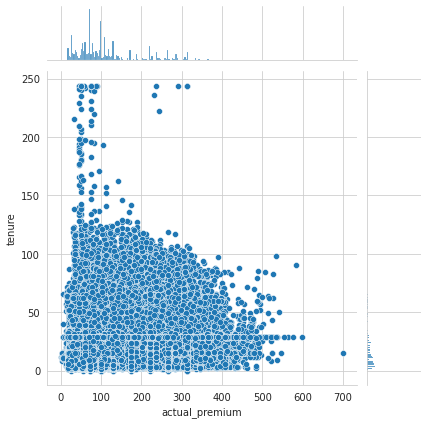

In [55]:
#Joint Plot
sns.jointplot(x = 'actual_premium', y = 'tenure', data = pandas_df_woo)

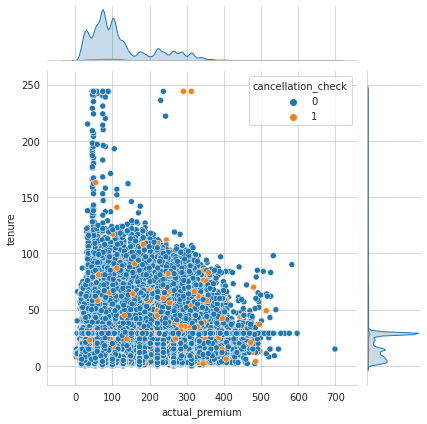

In [56]:
sns.jointplot(x = 'actual_premium', y = 'tenure', data = pandas_df_woo, hue='cancellation_check');

## Feature Selection

In [42]:
c = pandas_df.corr().abs()
c = c[c>.93]
s = c.unstack()
so = s.sort_values(kind="quicksort")

In [43]:
so.head(30)

new_premium_2      monetary_increase    0.939829
monetary_increase  new_premium_2        0.939829
one_yr_claims      five_yr_claims       0.955129
five_yr_claims     one_yr_claims        0.955129
three_yr_all       one_yr_all           0.958962
one_yr_all         three_yr_all         0.958962
lr_increase        premium_increase     0.967946
premium_increase   lr_increase          0.967946
one_yr_claims      three_yr_claims      0.969722
three_yr_claims    one_yr_claims        0.969722
                   five_yr_claims       0.989431
five_yr_claims     three_yr_claims      0.989431
gross_ad_replace   net_ad_replace       0.995822
net_ad_replace     gross_ad_replace     0.995822
gross_th_lo        net_th_lo            0.995895
net_th_lo          gross_th_lo          0.995895
net_ad_repair      gross_ad_repair      0.999025
gross_ad_repair    net_ad_repair        0.999025
actual_premium     new_premium_2        0.999320
new_premium_2      actual_premium       0.999320
new_premium_psr    p

In [44]:
# Create correlation matrix
corr_matrix = pandas_df.corr().abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find features with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] > 0.93)]



In [45]:
to_drop

['premium_increase',
 'new_premium_2',
 'new_premium_psr',
 'monetary_increase',
 'three_yr_all',
 'three_yr_claims',
 'five_yr_claims',
 'net_th_lo',
 'net_ad_repair',
 'net_ad_replace']

In [59]:
# # Drop features 
# pandas_df.drop(to_drop, axis=1, inplace=True)

In [60]:
# #Heatmap
# plt.figure(figsize=(20, 20))
# heatmap = sns.heatmap(round(pandas_df.corr(),2), vmin=-1, vmax=1, annot=True)
# heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':10}, pad=12);

In [46]:
from dython.nominal import associations 

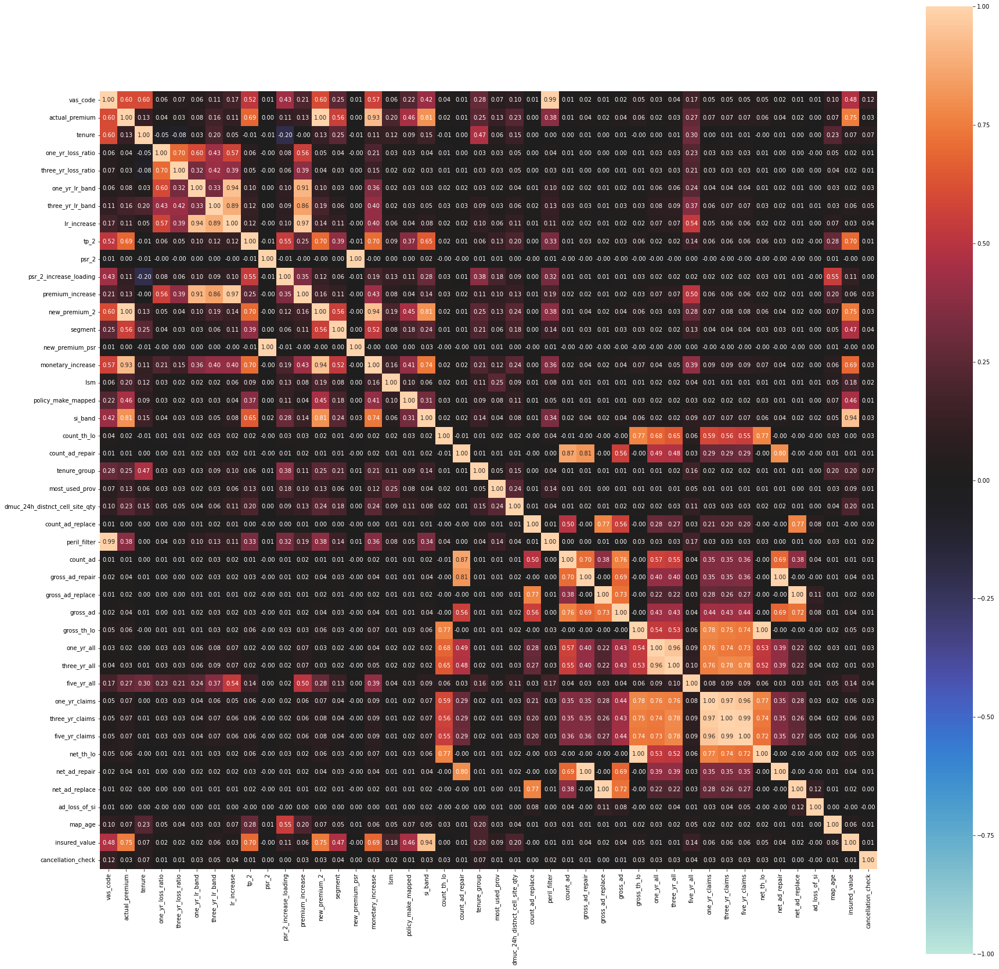

In [47]:
complete_correlation= associations(pandas_df, filename= 'complete_correlation.png', figsize=(30,30))

In [48]:
df_complete_corr=complete_correlation['corr']
df_complete_corr.dropna(axis=1, how='all').dropna(axis=0, how='all').style.background_gradient(cmap='coolwarm', axis=None).set_precision(2)

,vas_code,actual_premium,tenure,one_yr_loss_ratio,three_yr_loss_ratio,one_yr_lr_band,three_yr_lr_band,lr_increase,tp_2,psr_2,psr_2_increase_loading,premium_increase,new_premium_2,segment,new_premium_psr,monetary_increase,lsm,policy_make_mapped,si_band,count_th_lo,count_ad_repair,tenure_group,most_used_prov,dmuc_24h_distnct_cell_site_qty,count_ad_replace,peril_filter,count_ad,gross_ad_repair,gross_ad_replace,gross_ad,gross_th_lo,one_yr_all,three_yr_all,five_yr_all,one_yr_claims,three_yr_claims,five_yr_claims,net_th_lo,net_ad_repair,net_ad_replace,ad_loss_of_si,map_age,insured_value,cancellation_check
vas_code,1.00,0.60,0.60,0.06,0.07,0.06,0.11,0.17,0.52,0.01,0.43,0.21,0.60,0.25,0.01,0.57,0.06,0.22,0.42,0.04,0.01,0.28,0.07,0.10,0.01,0.99,0.01,0.02,0.01,0.02,0.05,0.03,0.04,0.17,0.05,0.05,0.05,0.05,0.02,0.01,0.01,0.10,0.48,0.12
actual_premium,0.60,1.00,0.13,0.04,0.03,0.08,0.16,0.11,0.69,0.00,0.11,0.13,1.00,0.56,0.00,0.93,0.20,0.46,0.81,0.02,0.01,0.25,0.13,0.23,0.00,0.38,0.01,0.04,0.02,0.04,0.06,0.02,0.03,0.27,0.07,0.07,0.07,0.06,0.04,0.02,0.00,0.07,0.75,0.03
tenure,0.60,0.13,1.00,-0.05,-0.08,0.03,0.20,0.05,-0.01,-0.01,-0.20,-0.00,0.13,0.25,-0.01,0.11,0.12,0.09,0.15,-0.01,0.00,0.47,0.06,0.15,0.00,0.00,0.00,0.01,0.00,0.01,-0.00,0.00,0.01,0.30,0.00,0.01,0.01,-0.00,0.01,0.00,0.00,0.23,0.07,0.07
one_yr_loss_ratio,0.06,0.04,-0.05,1.00,0.70,0.60,0.43,0.57,0.06,-0.00,0.08,0.56,0.05,0.04,-0.00,0.21,0.03,0.03,0.04,0.01,0.00,0.03,0.03,0.05,0.00,0.04,0.01,0.00,0.00,0.00,0.01,0.03,0.03,0.23,0.03,0.03,0.03,0.01,0.00,0.00,-0.00,0.05,0.02,0.01
three_yr_loss_ratio,0.07,0.03,-0.08,0.70,1.00,0.32,0.42,0.39,0.05,-0.00,0.06,0.39,0.04,0.03,0.00,0.15,0.02,0.02,0.03,0.01,0.01,0.03,0.03,0.05,0.00,0.03,0.01,0.00,0.00,0.01,0.01,0.03,0.03,0.21,0.03,0.03,0.03,0.01,0.00,0.00,0.00,0.04,0.02,0.01
one_yr_lr_band,0.06,0.08,0.03,0.60,0.32,1.00,0.33,0.94,0.10,0.00,0.10,0.91,0.10,0.03,0.00,0.36,0.02,0.03,0.03,0.02,0.02,0.03,0.02,0.04,0.01,0.10,0.02,0.02,0.01,0.02,0.01,0.06,0.06,0.24,0.04,0.04,0.04,0.01,0.02,0.01,0.00,0.03,0.02,0.03
three_yr_lr_band,0.11,0.16,0.20,0.43,0.42,0.33,1.00,0.89,0.12,0.00,0.09,0.86,0.19,0.06,0.00,0.40,0.02,0.03,0.05,0.03,0.03,0.09,0.03,0.06,0.02,0.13,0.03,0.03,0.01,0.03,0.03,0.08,0.09,0.37,0.06,0.07,0.07,0.03,0.02,0.01,0.01,0.03,0.06,0.05
lr_increase,0.17,0.11,0.05,0.57,0.39,0.94,0.89,1.00,0.12,-0.00,0.10,0.97,0.14,0.11,-0.00,0.40,0.06,0.04,0.08,0.02,0.02,0.10,0.06,0.11,0.01,0.11,0.02,0.02,0.01,0.02,0.02,0.07,0.07,0.54,0.05,0.06,0.06,0.02,0.02,0.01,0.00,0.07,0.03,0.04
tp_2,0.52,0.69,-0.01,0.06,0.05,0.10,0.12,0.12,1.00,-0.01,0.55,0.25,0.70,0.39,-0.01,0.70,0.09,0.37,0.65,0.02,0.01,0.06,0.13,0.20,0.00,0.33,0.01,0.03,0.02,0.03,0.06,0.02,0.02,0.14,0.06,0.06,0.06,0.06,0.03,0.02,-0.00,0.28,0.70,0.01
psr_2,0.01,0.00,-0.01,-0.00,-0.00,0.00,0.00,-0.00,-0.01,1.00,-0.01,-0.00,-0.00,0.00,1.00,-0.00,0.00,0.00,0.02,-0.00,-0.00,0.01,0.01,0.00,-0.00,0.01,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,-0.00,-0.00,-0.00,-0.00,-0.00,-0.00,0.00,0.01,-0.00,0.00


In [49]:
c = df_complete_corr
c = c[c>.93]
s = c.unstack()
so = s.sort_values(kind="quicksort")

In [50]:
so.head(30)

lr_increase        one_yr_lr_band       0.939800
one_yr_lr_band     lr_increase          0.939800
monetary_increase  new_premium_2        0.939829
new_premium_2      monetary_increase    0.939829
insured_value      si_band              0.941576
si_band            insured_value        0.941576
five_yr_claims     one_yr_claims        0.955129
one_yr_claims      five_yr_claims       0.955129
one_yr_all         three_yr_all         0.958962
three_yr_all       one_yr_all           0.958962
premium_increase   lr_increase          0.967946
lr_increase        premium_increase     0.967946
three_yr_claims    one_yr_claims        0.969722
one_yr_claims      three_yr_claims      0.969722
five_yr_claims     three_yr_claims      0.989431
three_yr_claims    five_yr_claims       0.989431
peril_filter       vas_code             0.989640
vas_code           peril_filter         0.989640
gross_ad_replace   net_ad_replace       0.995822
net_ad_replace     gross_ad_replace     0.995822
net_th_lo          g

In [51]:
# Create correlation matrix
corr_matrix = df_complete_corr.abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find features with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] > 0.93)]



In [52]:
to_drop

['lr_increase',
 'premium_increase',
 'new_premium_2',
 'new_premium_psr',
 'monetary_increase',
 'peril_filter',
 'three_yr_all',
 'three_yr_claims',
 'five_yr_claims',
 'net_th_lo',
 'net_ad_repair',
 'net_ad_replace',
 'insured_value']

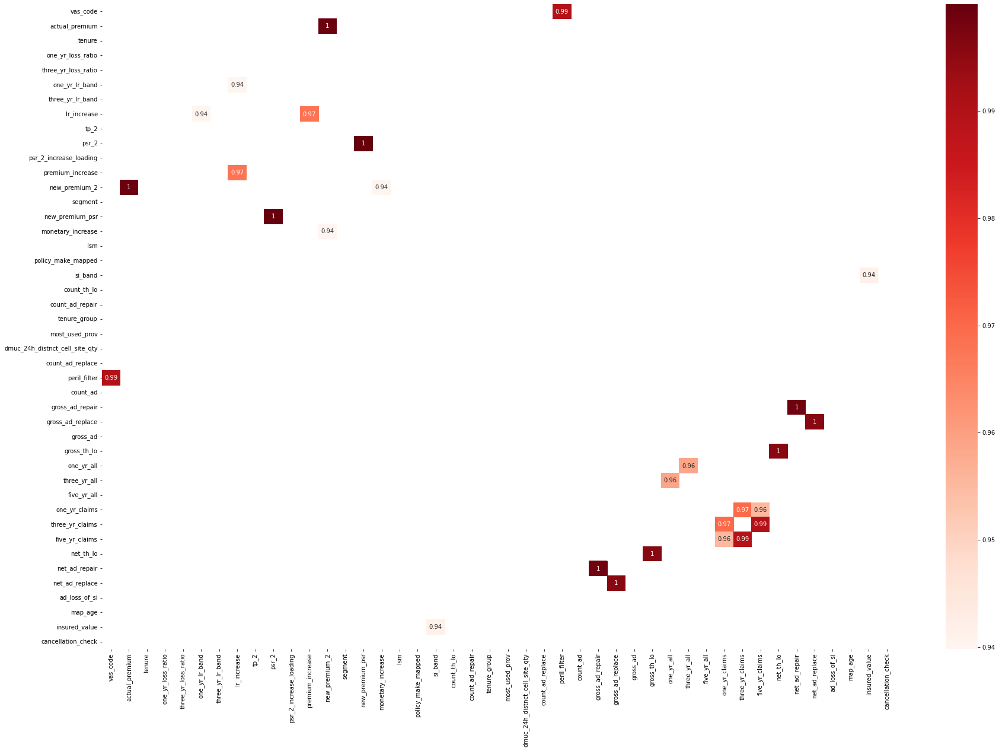

In [53]:
dfCorr = df_complete_corr
filteredDf = dfCorr[((dfCorr >= .93) | (dfCorr <= -.93)) & (dfCorr !=1.000)]
plt.figure(figsize=(30,20))
sns.heatmap(filteredDf, annot=True, cmap="Reds")
plt.show()

In [54]:
categorical_columns = pandas_df.select_dtypes('object').columns 
categorical_columns

Index(['vas_code', 'one_yr_lr_band', 'three_yr_lr_band', 'segment', 'lsm',
       'policy_make_mapped', 'si_band', 'tenure_group', 'most_used_prov',
       'dmuc_24h_distnct_cell_site_qty', 'peril_filter', 'five_yr_all',
       'map_age'],
      dtype='object')

In [55]:
chi2_array, p_array = [], []
for column in categorical_columns:
    crosstab = pd.crosstab(pandas_df[column], pandas_df['cancellation_check'])
    chi2, p, dof, expected = chi2_contingency(crosstab)
    chi2_array.append(chi2)
    p_array.append(p)
 
df_chi = pd.DataFrame({
    'Variable': categorical_columns,
    'Chi-square': chi2_array,
    'p-value': p_array
})
df_chi.sort_values(by='Chi-square', ascending=False)

,Variable,Chi-square,p-value
0,vas_code,4731.983201,0.000000e+00
7,tenure_group,1647.604610,0.000000e+00
2,three_yr_lr_band,722.606316,6.353390e-154
11,five_yr_all,512.725226,8.334101e-111
3,segment,478.202871,4.041334e-101
6,si_band,403.693111,1.540557e-80
1,one_yr_lr_band,269.684520,3.270962e-56
10,peril_filter,203.051204,4.508327e-46
8,most_used_prov,60.532923,1.181420e-10
12,map_age,45.591559,1.049658e-07


In [56]:
#Based on the suggested columns to drop, I am choosing which ones to drop instead since they give the same information
actual_drop = ['one_yr_lr_band',
 'premium_increase',
 'actual_premium',
 'monetary_increase',
 'new_premium_psr',
 'vas_code',
 'one_yr_all',
 'one_yr_claims',
 'three_yr_claims',
 'net_th_lo',
 'net_ad_repair',
 'net_ad_replace',
 'si_band']

In [58]:
#Getting the approxiamte sum insured based on the palicy_make and si_band.
#pandas_df.groupby(['policy_make_mapped', 'si_band'])['insured_value'].mean()

In [74]:
# pandas_df['insured_value'] = pandas_df.groupby(['policy_make_mapped', 'si_band']).transform(lambda x: x.fillna(x.mean()))

#### drop fearures

In [57]:
pandas_df

,vas_code,actual_premium,tenure,one_yr_loss_ratio,three_yr_loss_ratio,one_yr_lr_band,three_yr_lr_band,lr_increase,tp_2,psr_2,...,one_yr_claims,three_yr_claims,five_yr_claims,net_th_lo,net_ad_repair,net_ad_replace,ad_loss_of_si,map_age,insured_value,cancellation_check
0,VIC01,346,29,0.000000,0.00000,a: 0 to 20%,a: 0 to 20%,0.00,131.698715,2.627209,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,81 to 90,23293.973595,0
1,IC08,221,5,0.000000,0.00000,a: 0 to 20%,a: 0 to 20%,0.00,318.307609,0.694297,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,41 to 50,15879.702051,0
2,VIC01,364,29,0.000000,0.00000,a: 0 to 20%,a: 0 to 20%,0.00,147.218888,2.472509,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,51 to 60,12422.679742,0
3,VIC01,107,18,4.335826,2.89055,f: 100%+,f: 100%+,0.07,184.781457,0.579062,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,41 to 50,5823.499222,0
4,VIC01,74,11,0.000000,0.00000,a: 0 to 20%,a: 0 to 20%,0.00,233.775343,0.316543,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,41 to 50,15529.318318,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
350995,VIC01,39,23,0.000000,0.00000,a: 0 to 20%,a: 0 to 20%,0.00,73.171005,0.532998,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,31 to 40,1941.171584,1
350996,IC06,129,5,0.000000,0.00000,a: 0 to 20%,a: 0 to 20%,0.00,308.588526,0.418032,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21 to 30,8026.006420,0
350997,VIA01,89,29,0.000000,0.00000,a: 0 to 20%,a: 0 to 20%,0.00,133.104290,0.668649,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,41 to 50,15086.554484,0
350998,IC05,100,6,0.000000,0.00000,a: 0 to 20%,a: 0 to 20%,0.00,158.030915,0.632788,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,41 to 50,5793.972065,0


In [58]:
# Drop features 
pandas_df.drop(actual_drop, axis=1, inplace=True)
pandas_drop =pandas_df

In [59]:
pandas_drop.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 351000 entries, 0 to 350999
Data columns (total 31 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   tenure                          351000 non-null  int32  
 1   one_yr_loss_ratio               351000 non-null  float64
 2   three_yr_loss_ratio             351000 non-null  float64
 3   three_yr_lr_band                351000 non-null  object 
 4   lr_increase                     351000 non-null  float64
 5   tp_2                            348437 non-null  float64
 6   psr_2                           348437 non-null  float64
 7   psr_2_increase_loading          348437 non-null  float64
 8   new_premium_2                   351000 non-null  float64
 9   segment                         351000 non-null  object 
 10  lsm                             324768 non-null  object 
 11  policy_make_mapped              351000 non-null  object 
 12  count_th_lo     

In [60]:
pandas_drop.isnull().sum()

tenure                                0
one_yr_loss_ratio                     0
three_yr_loss_ratio                   0
three_yr_lr_band                      0
lr_increase                           0
tp_2                               2563
psr_2                              2563
psr_2_increase_loading             2563
new_premium_2                         0
segment                               0
lsm                               26232
policy_make_mapped                    0
count_th_lo                           0
count_ad_repair                       0
tenure_group                          0
most_used_prov                     3527
dmuc_24h_distnct_cell_site_qty     1500
count_ad_replace                      0
peril_filter                          0
count_ad                              0
gross_ad_repair                       0
gross_ad_replace                      0
gross_ad                              0
gross_th_lo                           0
three_yr_all                          0


In [61]:
pandas_drop = pandas_drop.fillna(-9999999999999999999)

### Feature Engeneering

In [62]:
# Finding all the categorical columns from the data
categorical_columns = pandas_drop.select_dtypes('object').columns 
categorical_columns

Index(['three_yr_lr_band', 'segment', 'lsm', 'policy_make_mapped',
       'tenure_group', 'most_used_prov', 'dmuc_24h_distnct_cell_site_qty',
       'peril_filter', 'five_yr_all', 'map_age'],
      dtype='object')

In [63]:
 # Finding all the numerical columns from the data
numerical_columns = pandas_drop.select_dtypes(include=['int64', 'int32','float64']).columns
numerical_columns

Index(['tenure', 'one_yr_loss_ratio', 'three_yr_loss_ratio', 'lr_increase',
       'tp_2', 'psr_2', 'psr_2_increase_loading', 'new_premium_2',
       'count_th_lo', 'count_ad_repair', 'count_ad_replace', 'count_ad',
       'gross_ad_repair', 'gross_ad_replace', 'gross_ad', 'gross_th_lo',
       'three_yr_all', 'five_yr_claims', 'ad_loss_of_si', 'insured_value',
       'cancellation_check'],
      dtype='object')

In [64]:
# Making a copy of the data to save the original data
original_df = pandas_drop

In [79]:
#pandas_drop = original_df

In [65]:
pandas_drop.isnull().sum()

tenure                            0
one_yr_loss_ratio                 0
three_yr_loss_ratio               0
three_yr_lr_band                  0
lr_increase                       0
tp_2                              0
psr_2                             0
psr_2_increase_loading            0
new_premium_2                     0
segment                           0
lsm                               0
policy_make_mapped                0
count_th_lo                       0
count_ad_repair                   0
tenure_group                      0
most_used_prov                    0
dmuc_24h_distnct_cell_site_qty    0
count_ad_replace                  0
peril_filter                      0
count_ad                          0
gross_ad_repair                   0
gross_ad_replace                  0
gross_ad                          0
gross_th_lo                       0
three_yr_all                      0
five_yr_all                       0
five_yr_claims                    0
ad_loss_of_si               

In [66]:
pandas_drop = pandas_drop.dropna()

In [67]:
# One hot encoding independent variable x
def encode_and_bind(original_dataframe, feature_to_encode):
    dummies = pd.get_dummies(original_dataframe[[feature_to_encode]])
    res = pd.concat([original_dataframe, dummies], axis=1)
    res = res.drop([feature_to_encode], axis=1)
    return(res)

In [68]:
for feature in categorical_columns:
    pandas_drop = encode_and_bind(pandas_drop, feature)

pandas_drop.head()

,tenure,one_yr_loss_ratio,three_yr_loss_ratio,lr_increase,tp_2,psr_2,psr_2_increase_loading,new_premium_2,count_th_lo,count_ad_repair,...,five_yr_all_2,five_yr_all_3plus,map_age_11 to 20,map_age_21 to 30,map_age_31 to 40,map_age_41 to 50,map_age_51 to 60,map_age_61 to 70,map_age_71 to 80,map_age_81 to 90
0,29,0.000000,0.00000,0.00,131.698715,2.627209,0.000,373.68,0,0,...,0,0,0,0,0,0,0,0,0,1
1,5,0.000000,0.00000,0.00,318.307609,0.694297,0.010,240.89,0,0,...,0,0,0,0,0,1,0,0,0,0
2,29,0.000000,0.00000,0.00,147.218888,2.472509,0.000,393.12,0,0,...,0,0,0,0,0,0,1,0,0,0
3,18,4.335826,2.89055,0.07,184.781457,0.579062,0.010,124.12,0,0,...,0,0,0,0,0,1,0,0,0,0
4,11,0.000000,0.00000,0.00,233.775343,0.316543,0.015,81.03,0,0,...,0,0,0,0,0,1,0,0,0,0


In [69]:
pandas_drop.shape

(351000, 85)

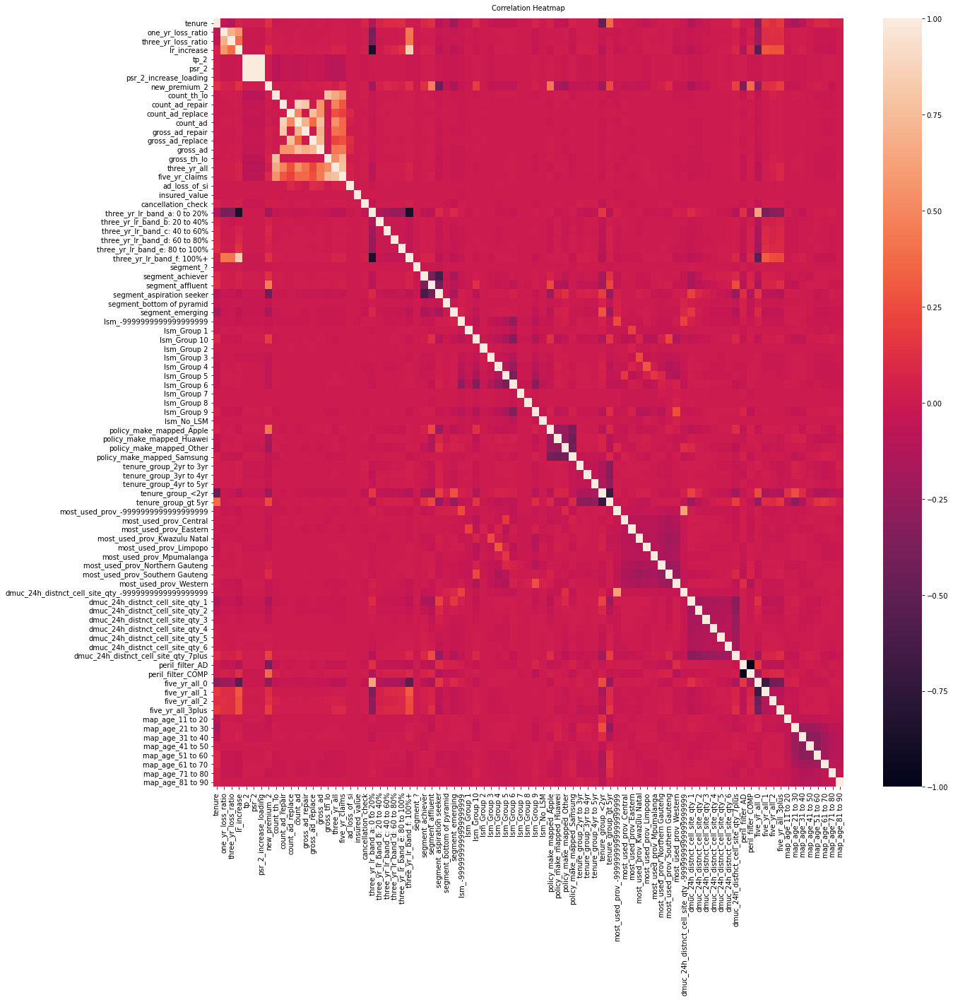

In [70]:
#Heatmap
plt.figure(figsize=(20, 20))
heatmap = sns.heatmap(round(pandas_drop.corr(),2), vmin=-1, vmax=1, annot=False)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':10}, pad=12);

<AxesSubplot:>

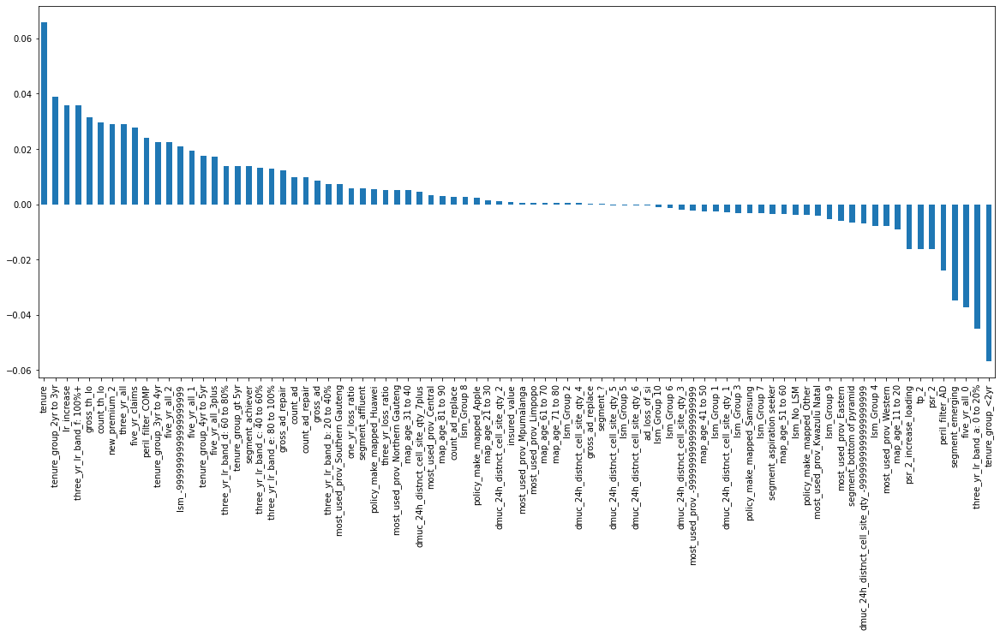

In [71]:
plt.figure(figsize=(20,8))
pandas_drop.corr()['cancellation_check'].sort_values(ascending = False)[1:].plot(kind='bar')

In [72]:
# Split the dataset into the response, y, and features, X
y = pandas_drop['cancellation_check']
X = pandas_drop.drop('cancellation_check', axis=1)

#### model a model with RAW data

In [73]:
#We can then call the train_test_split function:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify =  y,random_state=50)

#Stratify will make sure your train and validation data are split based on output label frequencies based on train data. 
#Like if the data was like 90 to class 'A' and 10 to class 'B'.
#After split both train and validation will have 90:10 ratio of classes

In [74]:
x_train.columns = X.columns.str.translate("".maketrans({"[":"{", "]":"}","<":"^"}))

In [75]:
from xgboost import XGBClassifier

classifier_1 = XGBClassifier(random_state=1234)
classifier_1.fit(x_train,y_train)

/home/nxums003/.virtualenv/nxums003/lib/python3.6/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[09:04:06] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=40,
              num_parallel_tree=1, predictor='auto', random_state=1234,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [76]:
from sklearn import metrics

# Predicting the test set
y_pred_1 = classifier_1.predict(x_test)

# Making the confusion matrix and calculating accuracy score
accuracy_1 = metrics.accuracy_score(y_test, y_pred_1)
print(accuracy_1)

fpr_1, tpr_1, thresholds_1 = metrics.roc_curve(y_test, y_pred_1)
auc_1 = metrics.auc(fpr_1, tpr_1)
print(auc_1)

0.9548005698005698
0.5038027521874775


In [77]:
xgbpred_1 = classifier_1.predict(x_test)
print(classification_report(y_test, xgbpred_1))

              precision    recall  f1-score   support

           0       0.96      1.00      0.98     67019
           1       0.60      0.01      0.02      3181

    accuracy                           0.95     70200
   macro avg       0.78      0.50      0.50     70200
weighted avg       0.94      0.95      0.93     70200



In [78]:
print ('Confusion Matrix:')
print(confusion_matrix(y_test, xgbpred_1))
print('\nAccuracy:', accuracy_score(y_test, xgbpred_1))
print("Overall Precision:",precision_score(y_test, xgbpred_1))
print("Overall Recall:",recall_score(y_test, xgbpred_1))
print("Overall f1-score:", f1_score(y_test, xgbpred_1))
print("AUC:", roc_auc_score(y_test,xgbpred_1))
plt.show()

Confusion Matrix:
[[67002    17]
 [ 3156    25]]

Accuracy: 0.9548005698005698
Overall Precision: 0.5952380952380952
Overall Recall: 0.00785916378497328
Overall f1-score: 0.015513496742165686
AUC: 0.5038027521874775


#### Over-Sampling | SMOTE

In [79]:
# Transform the dataset (only training data)
oversample = SMOTE(sampling_strategy='auto', random_state=1234)
x_sm, y_sm = oversample.fit_resample(x_train, y_train)

In [80]:
print(Counter(y_train))
print(Counter(y_sm))

Counter({0: 268078, 1: 12722})
Counter({0: 268078, 1: 268078})


In [81]:
#plotly
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

In [82]:
fig = make_subplots(rows=1, cols=2, specs=[[{"type": "pie"}, {"type": "pie"}]])

fig.add_trace(
    go.Pie(labels=list(Counter(y_train).keys()), values=list(Counter(y_train).values()), name='Original data'),
    row=1, col=1
)

fig.add_trace(
    go.Pie(labels=list(Counter(y_sm).keys()), values=list(Counter(y_sm).values()), name='SMOTE data'),
    row=1, col=2
)

fig.update_traces(textposition='inside', hole=.4, hoverinfo="value+percent+name")
fig.update_layout(
    title_text="Class distribution",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Original', x=0.16, y=0.5, font_size=12, showarrow=False),
                 dict(text='SMOTE', x=0.82, y=0.5, font_size=12, showarrow=False)])
fig.show()

In [83]:
over = BorderlineSMOTE(sampling_strategy=0.3)
under = RandomUnderSampler(sampling_strategy=0.6)

steps = [('o', over), ('u', under)]
pipeline = Pipeline(steps=steps)

In [84]:
# transform the dataset
x_sm_us, y_sm_us = pipeline.fit_resample(x_train, y_train)

print(Counter(y_train))
print(Counter(y_sm_us))

Counter({0: 268078, 1: 12722})
Counter({0: 134038, 1: 80423})


In [85]:
list(Counter(y_train).keys())

[0, 1]

In [86]:
fig = make_subplots(rows=1, cols=2, specs=[[{"type": "pie"}, {"type": "pie"}]])

fig.add_trace(
    go.Pie(labels=list(Counter(y_train).keys()), values=list(Counter(y_train).values()), name='Original Data'),
    row=1, col=1
)

fig.add_trace(
    go.Pie(labels=list(Counter(y_sm_us).keys()), values=list(Counter(y_sm_us).values()), name='SMOTE and US data'),
    row=1, col=2
)

fig.update_traces(textposition='inside', hole=.4, hoverinfo="percent+name+value")
fig.update_layout(
    title_text="Class distribution",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Original', x=0.16, y=0.5, font_size=12, showarrow=False),
                 dict(text='SMOTE and UnderSample', x=0.9, y=0.5, font_size=12, showarrow=False)])
fig.show()

 ## Random Under-Sampling

In [87]:
# define undersample strategy
undersample = RandomUnderSampler(sampling_strategy='majority')


In [88]:
# fit and apply the transform
X_under, y_under = undersample.fit_resample(x_train, y_train)


In [89]:
# summarize class distribution
print(Counter(y_under))

Counter({0: 12722, 1: 12722})


total class of 1 and 0: 1    12722
0    12722
Name: cancellation_check, dtype: int64


<AxesSubplot:title={'center':'count (target)'}>

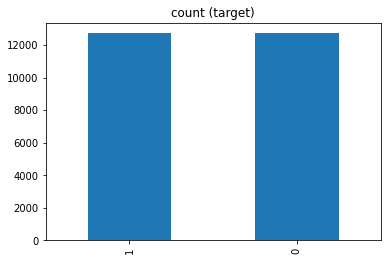

In [90]:
print("total class of 1 and 0:",y_under.value_counts())# plot the count after under-sampeling
y_under.value_counts().plot(kind='bar', title='count (target)')

## Random Over-Sampling

In [91]:
from collections import Counter
from imblearn.over_sampling import RandomOverSampler

In [92]:
# define oversampling strategy
oversample = RandomOverSampler(sampling_strategy='minority')
# define oversampling strategy
# oversample = RandomOverSampler(sampling_strategy=0.5)

In [93]:
# fit and apply the transform
X_over, y_over = oversample.fit_resample(x_train, y_train)

In [94]:
# summarize class distribution
print(Counter(y_over))

Counter({0: 268078, 1: 268078})


total class of 1 and 0: 1    268078
0    268078
Name: cancellation_check, dtype: int64


<AxesSubplot:title={'center':'count (target)'}>

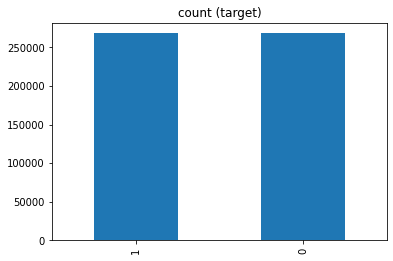

In [95]:
print("total class of 1 and 0:",y_over.value_counts())# plot the count after under-sampeling
y_over.value_counts().plot(kind='bar', title='count (target)')

## Random Over-Sampling + Under-Sampling

In [96]:
print(Counter(y_train))

Counter({0: 268078, 1: 12722})


In [97]:
# define oversampling strategy
over = RandomOverSampler(sampling_strategy=0.1)
# fit and apply the transform
X_f, y_f = over.fit_resample(x_train, y_train)


In [98]:
# summarize class distribution
print(Counter(y_f))

Counter({0: 268078, 1: 26807})


In [99]:
# define undersampling strategy
under = RandomUnderSampler(sampling_strategy=0.5)
# fit and apply the transform
X_os_us, y_os_us = under.fit_resample(X_f, y_f)
# summarize class distribution
print(Counter(y_os_us))

Counter({0: 53614, 1: 26807})


### try model a model with SMOTE data

In [100]:
from xgboost import XGBClassifier

classifier_2 = XGBClassifier(random_state=1234)
classifier_2.fit(x_sm, y_sm)

/home/nxums003/.virtualenv/nxums003/lib/python3.6/site-packages/xgboost/sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[09:06:16] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=40,
              num_parallel_tree=1, predictor='auto', random_state=1234,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [101]:
# Predicting the test set
y_pred_2 = classifier_2.predict(x_test)

# Making the confusion matrix and calculating accuracy score
accuracy_2 = metrics.accuracy_score(y_test, y_pred_2)
print(accuracy_2)

fpr_2, tpr_2, thresholds_2 = metrics.roc_curve(y_test, y_pred_2)
auc_2 = metrics.auc(fpr_2, tpr_2)
print(auc_2)

0.9545014245014245
0.5022985758555879


In [102]:
xgbpred_2 = classifier_2.predict(x_test)
print(classification_report(y_test, xgbpred_2 ))

              precision    recall  f1-score   support

           0       0.95      1.00      0.98     67019
           1       0.36      0.01      0.01      3181

    accuracy                           0.95     70200
   macro avg       0.66      0.50      0.49     70200
weighted avg       0.93      0.95      0.93     70200



In [103]:
print ('Confusion Matrix:')
print(confusion_matrix(y_test, xgbpred_2))
print('\nAccuracy:', accuracy_score(y_test, xgbpred_2))
print("Overall Precision:",precision_score(y_test, xgbpred_2))
print("Overall Recall:",recall_score(y_test, xgbpred_2))
print("Overall f1-score:", f1_score(y_test, xgbpred_2))
print("AUC:", roc_auc_score(y_test,xgbpred_2))
plt.show()

Confusion Matrix:
[[66990    29]
 [ 3165    16]]

Accuracy: 0.9545014245014245
Overall Precision: 0.35555555555555557
Overall Recall: 0.005029864822382898
Overall f1-score: 0.009919404835709857
AUC: 0.5022985758555879


### try model a model with SMOTE and undersample data

In [104]:
classifier_3 = XGBClassifier(random_state=1234)
classifier_3.fit(x_sm_us, y_sm_us)

/home/nxums003/.virtualenv/nxums003/lib/python3.6/site-packages/xgboost/sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[09:07:05] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=40,
              num_parallel_tree=1, predictor='auto', random_state=1234,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [105]:
# Predicting the test set
y_pred_3 = classifier_3.predict(x_test)

# Making the confusion matrix and calculating accuracy score
accuracy_3 = metrics.accuracy_score(y_test, y_pred_3)
print(accuracy_3)

fpr_3, tpr_3, thresholds_3 = metrics.roc_curve(y_test, y_pred_3)
auc_3 = metrics.auc(fpr_3, tpr_3)
print(auc_3)

0.9541737891737891
0.5066186638697789


In [106]:
xgbpred_3 = classifier_3.predict(x_test)
print(classification_report(y_test, xgbpred_3 ))

              precision    recall  f1-score   support

           0       0.96      1.00      0.98     67019
           1       0.36      0.01      0.03      3181

    accuracy                           0.95     70200
   macro avg       0.66      0.51      0.50     70200
weighted avg       0.93      0.95      0.93     70200



In [107]:
print ('Confusion Matrix:')
print(confusion_matrix(y_test, xgbpred_3))
print('\nAccuracy:', accuracy_score(y_test, xgbpred_3))
print("Overall Precision:",precision_score(y_test, xgbpred_3))
print("Overall Recall:",recall_score(y_test, xgbpred_3))
print("Overall f1-score:", f1_score(y_test, xgbpred_3))
print("AUC:", roc_auc_score(y_test,xgbpred_3))


Confusion Matrix:
[[66937    82]
 [ 3135    46]]

Accuracy: 0.9541737891737891
Overall Precision: 0.359375
Overall Recall: 0.014460861364350833
Overall f1-score: 0.02780296161982472
AUC: 0.5066186638697789


### try model a model with undersample data

In [108]:
X_under.columns = X.columns.str.translate("".maketrans({"[":"{", "]":"}","<":"^"}))

In [109]:
classifier_4 = XGBClassifier(random_state=1234)
classifier_4.fit(X_under, y_under)

/home/nxums003/.virtualenv/nxums003/lib/python3.6/site-packages/xgboost/sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[09:07:36] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=40,
              num_parallel_tree=1, predictor='auto', random_state=1234,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [110]:
# Predicting the test set
xgbpred_4 = classifier_4.predict(x_test)

# Making the confusion matrix and calculating accuracy score
accuracy_4 = metrics.accuracy_score(y_test, xgbpred_4)
print(accuracy_4)

fpr_4, tpr_4, thresholds_4 = metrics.roc_curve(y_test, xgbpred_4)
auc_4 = metrics.auc(fpr_4, tpr_4)
print(auc_4)

0.5741452991452991
0.6408682947779114


In [111]:
xgbpred_4 = classifier_4.predict(x_test)
print(classification_report(y_test, xgbpred_4 ))

              precision    recall  f1-score   support

           0       0.98      0.57      0.72     67019
           1       0.07      0.71      0.13      3181

    accuracy                           0.57     70200
   macro avg       0.52      0.64      0.42     70200
weighted avg       0.94      0.57      0.69     70200



In [112]:
print ('Confusion Matrix:')
print(confusion_matrix(y_test, xgbpred_4))
print('\nAccuracy:', accuracy_score(y_test, xgbpred_4))
print("Overall Precision:",precision_score(y_test, xgbpred_4))
print("Overall Recall:",recall_score(y_test, xgbpred_4))
print("Overall f1-score:", f1_score(y_test, xgbpred_4))
print("AUC:", roc_auc_score(y_test,xgbpred_4))
plt.show()

Confusion Matrix:
[[38033 28986]
 [  909  2272]]

Accuracy: 0.5741452991452991
Overall Precision: 0.07268539253950988
Overall Recall: 0.7142408047783716
Overall f1-score: 0.1319434362205639
AUC: 0.6408682947779114


### try model a model with oversample data

In [113]:
X_over.columns = X.columns.str.translate("".maketrans({"[":"{", "]":"}","<":"^"}))

In [114]:
classifier_5 = XGBClassifier(random_state=1234)
classifier_5.fit(X_over, y_over )

/home/nxums003/.virtualenv/nxums003/lib/python3.6/site-packages/xgboost/sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[09:08:00] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=40,
              num_parallel_tree=1, predictor='auto', random_state=1234,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [115]:
# Predicting the test set
xgbpred_5 = classifier_5.predict(x_test)

# Making the confusion matrix and calculating accuracy score
accuracy_5 = metrics.accuracy_score(y_test, xgbpred_5)
print(accuracy_5)

fpr_5, tpr_5, thresholds_5 = metrics.roc_curve(y_test, xgbpred_5)
auc_5 = metrics.auc(fpr_5, tpr_5)
print(auc_5)

0.6463247863247863
0.6389944906650902


In [116]:
xgbpred_5 = classifier_5.predict(x_test)
print(classification_report(y_test, xgbpred_5 ))

              precision    recall  f1-score   support

           0       0.97      0.65      0.78     67019
           1       0.08      0.63      0.14      3181

    accuracy                           0.65     70200
   macro avg       0.53      0.64      0.46     70200
weighted avg       0.93      0.65      0.75     70200



In [117]:
print ('Confusion Matrix:')
print(confusion_matrix(y_test, xgbpred_5))
print('\nAccuracy:', accuracy_score(y_test, xgbpred_5))
print("Overall Precision:",precision_score(y_test, xgbpred_5))
print("Overall Recall:",recall_score(y_test, xgbpred_5))
print("Overall f1-score:", f1_score(y_test, xgbpred_5))
print("AUC:", roc_auc_score(y_test,xgbpred_5))
plt.show()

Confusion Matrix:
[[43365 23654]
 [ 1174  2007]]

Accuracy: 0.6463247863247863
Overall Precision: 0.07821207279529246
Overall Recall: 0.6309336686576549
Overall f1-score: 0.1391720407738714
AUC: 0.6389944906650902


### try model a model with oversample + undersample data

In [118]:
X_os_us.columns = X.columns.str.translate("".maketrans({"[":"{", "]":"}","<":"^"}))

In [119]:
classifier_6 = XGBClassifier(random_state=1234)
classifier_6.fit(X_os_us, y_os_us)

/home/nxums003/.virtualenv/nxums003/lib/python3.6/site-packages/xgboost/sklearn.py:1224: UserWarning:

The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].



[09:08:37] WARNING: ../src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
              gamma=0, gpu_id=-1, importance_type=None,
              interaction_constraints='', learning_rate=0.300000012,
              max_delta_step=0, max_depth=6, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=100, n_jobs=40,
              num_parallel_tree=1, predictor='auto', random_state=1234,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [120]:
# Predicting the test set
xgbpred_6 = classifier_6.predict(x_test)

# Making the confusion matrix and calculating accuracy score
accuracy_6 = metrics.accuracy_score(y_test, xgbpred_6)
print(accuracy_6)

fpr_6, tpr_6, thresholds_6 = metrics.roc_curve(y_test, xgbpred_6)
auc_6 = metrics.auc(fpr_6, tpr_6)
print(auc_6)

0.8825071225071225
0.5843710144667575


In [121]:
xgbpred_6 = classifier_6.predict(x_test)
print(classification_report(y_test, xgbpred_6 ))

              precision    recall  f1-score   support

           0       0.96      0.91      0.94     67019
           1       0.12      0.26      0.17      3181

    accuracy                           0.88     70200
   macro avg       0.54      0.58      0.55     70200
weighted avg       0.92      0.88      0.90     70200



In [122]:
print ('Confusion Matrix:')
print(confusion_matrix(y_test, xgbpred_6))
print('\nAccuracy:', accuracy_score(y_test, xgbpred_6))
print("Overall Precision:",precision_score(y_test, xgbpred_6))
print("Overall Recall:",recall_score(y_test, xgbpred_6))
print("Overall f1-score:", f1_score(y_test, xgbpred_6))
print("AUC:", roc_auc_score(y_test,xgbpred_6))
plt.show()

Confusion Matrix:
[[61136  5883]
 [ 2365   816]]

Accuracy: 0.8825071225071225
Overall Precision: 0.12180922525750112
Overall Recall: 0.25652310594152783
Overall f1-score: 0.1651821862348178
AUC: 0.5843710144667575


In [123]:
print(accuracy_1,accuracy_2, accuracy_3, accuracy_4, accuracy_5, accuracy_6)

0.9548005698005698 0.9545014245014245 0.9541737891737891 0.5741452991452991 0.6463247863247863 0.8825071225071225


In [124]:
print(auc_1, auc_2 ,auc_3, auc_4, auc_5, auc_6)

0.5038027521874775 0.5022985758555879 0.5066186638697789 0.6408682947779114 0.6389944906650902 0.5843710144667575


### Generate new DataFrame with SMOTE and UnderSampling data

In [125]:
# Names of the independent variables
feature_names = list(pandas_drop.drop('cancellation_check', axis=1).columns)

In [129]:
# Concatenate train (with resampling) and test sets to build the new dataframe 
# sm_us_x = np.concatenate((x_sm_us, x_test))
# sm_us_y = np.concatenate((y_sm_us, y_test))

In [126]:
sm_us_df = pd.DataFrame(np.column_stack([y_sm_us,x_sm_us ]), columns=['cancellation_check'] + feature_names)
sm_us_df.head()

,cancellation_check,tenure,one_yr_loss_ratio,three_yr_loss_ratio,lr_increase,tp_2,psr_2,psr_2_increase_loading,new_premium_2,count_th_lo,...,five_yr_all_2,five_yr_all_3plus,map_age_11 to 20,map_age_21 to 30,map_age_31 to 40,map_age_41 to 50,map_age_51 to 60,map_age_61 to 70,map_age_71 to 80,map_age_81 to 90
0,0.0,4.0,0.0,0.0,0.0,179.196430,0.558047,0.010,109.00,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,0.0,9.0,0.0,0.0,0.0,177.544070,0.225296,0.020,44.00,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,0.0,12.0,0.0,0.0,0.0,67.672151,1.093507,0.000,79.92,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,0.0,26.0,0.0,0.0,0.0,9.332174,3.321841,0.000,33.48,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,7.0,0.0,0.0,0.0,65.286864,0.827119,0.005,58.59,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [ ]:
# sm_us_df = pd.DataFrame(np.column_stack([sm_us_y, sm_us_x]), columns=['cancellation_check'] + feature_names)
# sm_us_df.head()

### Feature Selection

In [127]:
from sklearn.ensemble import RandomForestClassifier

rf_clf = RandomForestClassifier(random_state=1234)
rf_clf.fit(x_sm_us, y_sm_us)

RandomForestClassifier(random_state=1234)

In [128]:
rf_clf.feature_importances_

array([7.59856275e-02, 8.66624258e-03, 2.31829506e-02, 2.30989871e-02,
       4.64045008e-02, 4.56748432e-02, 1.47814934e-02, 4.29905179e-02,
       1.21869547e-03, 2.14777685e-04, 8.50080609e-05, 2.51961837e-04,
       3.50349897e-04, 9.06213214e-05, 3.92818744e-04, 1.73864913e-03,
       1.27216297e-03, 2.09015506e-03, 1.09780605e-04, 4.10228612e-02,
       1.03551085e-02, 1.52111031e-03, 2.19175458e-03, 2.67510459e-03,
       3.14175124e-03, 1.67560639e-02, 8.98262741e-05, 1.76979191e-02,
       1.57279192e-02, 1.76679683e-02, 1.11302768e-04, 2.11269025e-03,
       1.10844599e-02, 8.58122036e-04, 1.62765907e-02, 3.34192898e-05,
       2.39166174e-03, 1.20194500e-02, 2.03478362e-02, 2.17769797e-02,
       1.24318494e-04, 1.32172666e-04, 1.70822379e-02, 8.15916728e-04,
       1.45182136e-02, 1.77196288e-02, 1.90872183e-02, 2.19600744e-02,
       5.94246123e-03, 6.89900094e-03, 5.85889983e-03, 1.47404682e-02,
       1.58155369e-02, 2.04345231e-03, 8.37065462e-03, 1.20642847e-02,
      

In [129]:
features_to_plot = 84

importances = rf_clf.feature_importances_
indices = np.argsort(importances)

best_vars = np.array(feature_names)[indices][-features_to_plot:]
values = importances[indices][-features_to_plot:]
best_vars

array(['lsm_Group 2', 'count_ad_replace', 'segment_?', 'gross_ad_replace',
       'ad_loss_of_si', 'segment_bottom of pyramid', 'lsm_Group 7',
       'lsm_Group 8', 'count_ad_repair', 'count_ad', 'map_age_11 to 20',
       'gross_ad_repair', 'gross_ad', 'lsm_No_LSM',
       'dmuc_24h_distnct_cell_site_qty_-9999999999999999999',
       'lsm_Group 1', 'count_th_lo', 'three_yr_all',
       'three_yr_lr_band_b: 20 to 40%', 'gross_th_lo',
       'most_used_prov_-9999999999999999999', 'five_yr_claims',
       'segment_emerging', 'three_yr_lr_band_c: 40 to 60%', 'lsm_Group 3',
       'three_yr_lr_band_d: 60 to 80%', 'three_yr_lr_band_e: 80 to 100%',
       'map_age_71 to 80', 'peril_filter_AD', 'peril_filter_COMP',
       'map_age_81 to 90', 'tenure_group_4yr to 5yr',
       'tenure_group_2yr to 3yr', 'map_age_21 to 30',
       'tenure_group_3yr to 4yr', 'most_used_prov_Central',
       'one_yr_loss_ratio', 'most_used_prov_Mpumalanga',
       'dmuc_24h_distnct_cell_site_qty_6', 'map_age_61 to

/home/nxums003/.virtualenv/nxums003/lib/python3.6/site-packages/ipykernel_launcher.py:4: UserWarning:

FixedFormatter should only be used together with FixedLocator



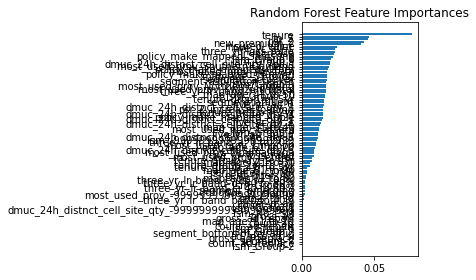

In [130]:
y_ticks = np.arange(0, features_to_plot)
fig, ax = plt.subplots()
ax.barh(y_ticks, values)
ax.set_yticklabels(best_vars)
ax.set_yticks(y_ticks)
ax.set_title("Random Forest Feature Importances")
fig.tight_layout()
plt.show()

In [131]:
y_pred = rf_clf.predict(x_test)

In [132]:
print(classification_report(y_test, y_pred ))

              precision    recall  f1-score   support

           0       0.96      1.00      0.98     67019
           1       0.66      0.05      0.09      3181

    accuracy                           0.96     70200
   macro avg       0.81      0.52      0.53     70200
weighted avg       0.94      0.96      0.94     70200



In [133]:
print ('Confusion Matrix:')
print(confusion_matrix(y_test, y_pred ))
print('\nAccuracy:', accuracy_score(y_test, y_pred ))
print("Overall Precision:",precision_score(y_test, y_pred ))
print("Overall Recall:",recall_score(y_test, y_pred ))
print("Overall f1-score:", f1_score(y_test, y_pred ))
print("AUC:", roc_auc_score(y_test,y_pred ))
plt.show()

Confusion Matrix:
[[66938    81]
 [ 3025   156]]

Accuracy: 0.9557549857549857
Overall Precision: 0.6582278481012658
Overall Recall: 0.04904118201823326
Overall f1-score: 0.09128145114101814
AUC: 0.523916284767603


In [139]:
best_vars = best_vars[-60:]
best_vars

array(['three_yr_lr_band_c: 40 to 60%', 'map_age_71 to 80',
       'three_yr_lr_band_d: 60 to 80%', 'map_age_81 to 90',
       'peril_filter_COMP', 'three_yr_lr_band_e: 80 to 100%',
       'peril_filter_AD', 'tenure_group_2yr to 3yr',
       'tenure_group_4yr to 5yr', 'map_age_21 to 30',
       'tenure_group_3yr to 4yr', 'most_used_prov_Mpumalanga',
       'most_used_prov_Central', 'one_yr_loss_ratio', 'map_age_61 to 70',
       'lsm_-9999999999999999999', 'three_yr_lr_band_a: 0 to 20%',
       'lsm_Group 4', 'most_used_prov_Limpopo', 'five_yr_all_3plus',
       'dmuc_24h_distnct_cell_site_qty_6', 'map_age_31 to 40',
       'five_yr_all_2', 'dmuc_24h_distnct_cell_site_qty_5',
       'most_used_prov_Eastern', 'policy_make_mapped_Apple',
       'lsm_Group 9', 'lsm_Group 10', 'psr_2_increase_loading',
       'tenure_group_gt 5yr', 'tenure_group_<2yr', 'five_yr_all_0',
       'map_age_41 to 50', 'dmuc_24h_distnct_cell_site_qty_4',
       'segment_affluent', 'dmuc_24h_distnct_cell_site_qty_

### Machine Learning | H2O

In [134]:
import h2o
from h2o.automl import H2OAutoML
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321 . connected.


/home/nxums003/.virtualenv/nxums003/lib/python3.6/site-packages/h2o/backend/connection.py:371: UserWarning:

Proxy is defined in the environment: http_proxy. This may interfere with your H2O Connection.

/home/nxums003/.virtualenv/nxums003/lib/python3.6/site-packages/h2o/backend/connection.py:371: UserWarning:

Proxy is defined in the environment: HTTP_PROXY. This may interfere with your H2O Connection.



H2O_cluster_uptime:,31 days 9 hours 20 mins
H2O_cluster_timezone:,Africa/Johannesburg
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.36.0.3
H2O_cluster_version_age:,"1 year, 10 months and 25 days !!!"
H2O_cluster_name:,H2O_from_python_nxums003_ydkshq
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,24.14 Gb
H2O_cluster_total_cores:,40
H2O_cluster_allowed_cores:,40
H2O_cluster_status:,"locked, healthy"


In [135]:
hf = h2o.H2OFrame(sm_us_df[['cancellation_check'] + list(best_vars)])
hf.head()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


cancellation_check,lsm_Group 2,count_ad_replace,segment_?,gross_ad_replace,ad_loss_of_si,segment_bottom of pyramid,lsm_Group 7,lsm_Group 8,count_ad_repair,count_ad,map_age_11 to 20,gross_ad_repair,gross_ad,lsm_No_LSM,dmuc_24h_distnct_cell_site_qty_-9999999999999999999,lsm_Group 1,count_th_lo,three_yr_all,three_yr_lr_band_b: 20 to 40%,gross_th_lo,most_used_prov_-9999999999999999999,five_yr_claims,segment_emerging,three_yr_lr_band_c: 40 to 60%,lsm_Group 3,three_yr_lr_band_d: 60 to 80%,three_yr_lr_band_e: 80 to 100%,map_age_71 to 80,peril_filter_AD,peril_filter_COMP,map_age_81 to 90,tenure_group_4yr to 5yr,tenure_group_2yr to 3yr,map_age_21 to 30,tenure_group_3yr to 4yr,most_used_prov_Central,one_yr_loss_ratio,most_used_prov_Mpumalanga,dmuc_24h_distnct_cell_site_qty_6,map_age_61 to 70,most_used_prov_Limpopo,three_yr_lr_band_a: 0 to 20%,lsm_-9999999999999999999,dmuc_24h_distnct_cell_site_qty_5,five_yr_all_3plus,lsm_Group 4,most_used_prov_Eastern,map_age_31 to 40,dmuc_24h_distnct_cell_site_qty_4,five_yr_all_2,dmuc_24h_distnct_cell_site_qty_2,policy_make_mapped_Apple,dmuc_24h_distnct_cell_site_qty_3,tenure_group_<2yr,psr_2_increase_loading,dmuc_24h_distnct_cell_site_qty_1,five_yr_all_0,segment_affluent,tenure_group_gt 5yr,lsm_Group 10,map_age_41 to 50,three_yr_lr_band_f: 100%+,most_used_prov_Kwazulu Natal,most_used_prov_Northern Gauteng,lsm_Group 9,segment_aspiration seeker,segment_achiever,map_age_51 to 60,policy_make_mapped_Huawei,most_used_prov_Western,policy_make_mapped_Other,most_used_prov_Southern Gauteng,dmuc_24h_distnct_cell_site_qty_7plus,lsm_Group 5,lsm_Group 6,policy_make_mapped_Samsung,lr_increase,three_yr_loss_ratio,five_yr_all_1,insured_value,new_premium_2,psr_2,tp_2,tenure
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,1,0,0,0,0,0,0,0.01,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,1,0,0,0,5793.97,109,0.558047,179.196,4
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,1,1,0,0,0,0,1,0,0,1,0,0,0,0.02,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,2937.42,44,0.225296,177.544,9
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0,0,1,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,15086.6,79.92,1.09351,67.6722,12
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,1,0,0,0,1426.84,33.48,3.32184,9.33217,26
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0.005,1,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,2938.02,58.59,0.827119,65.2869,7
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,3882.34,104.76,1.77743,54.5731,29
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0.01,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0.015,0.749381,1,2717.64,83.98,0.710905,106.906,29
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,1,3882.34,93.96,3.50381,24.8301,27
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0.005,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,2820.44,33.635,0.839081,36.9452,29
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0.005,0,0,0,1,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,1,1,0.025,1.32702,0,11647,288.6,0.934196,278.314,29


In [136]:
x_y_test = pd.DataFrame(np.column_stack([y_test,x_test ]), columns=['cancellation_check'] + feature_names)
x_y_test.head()

,cancellation_check,tenure,one_yr_loss_ratio,three_yr_loss_ratio,lr_increase,tp_2,psr_2,psr_2_increase_loading,new_premium_2,count_th_lo,...,five_yr_all_2,five_yr_all_3plus,map_age_11 to 20,map_age_21 to 30,map_age_31 to 40,map_age_41 to 50,map_age_51 to 60,map_age_61 to 70,map_age_71 to 80,map_age_81 to 90
0,0.0,12.0,0.000000,0.000000,0.00,65.974131,1.045864,0.000,74.520,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,0.0,29.0,0.000000,0.000000,0.00,72.594120,0.854064,0.005,67.270,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,0.0,20.0,0.000000,0.000000,0.00,400.802485,0.835823,0.005,363.475,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,1.0,17.0,4.622382,3.262858,0.07,306.235144,1.018825,0.000,358.800,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,0.0,21.0,3.632311,2.075606,0.07,67.129431,0.834209,0.005,64.680,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [137]:
h20_x_test = h2o.H2OFrame(x_y_test)
h20_x_test['cancellation_check'] = h20_x_test['cancellation_check'].asfactor()
h20_x_test.head()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


cancellation_check,tenure,one_yr_loss_ratio,three_yr_loss_ratio,lr_increase,tp_2,psr_2,psr_2_increase_loading,new_premium_2,count_th_lo,count_ad_repair,count_ad_replace,count_ad,gross_ad_repair,gross_ad_replace,gross_ad,gross_th_lo,three_yr_all,five_yr_claims,ad_loss_of_si,insured_value,three_yr_lr_band_a: 0 to 20%,three_yr_lr_band_b: 20 to 40%,three_yr_lr_band_c: 40 to 60%,three_yr_lr_band_d: 60 to 80%,three_yr_lr_band_e: 80 to 100%,three_yr_lr_band_f: 100%+,segment_?,segment_achiever,segment_affluent,segment_aspiration seeker,segment_bottom of pyramid,segment_emerging,lsm_-9999999999999999999,lsm_Group 1,lsm_Group 10,lsm_Group 2,lsm_Group 3,lsm_Group 4,lsm_Group 5,lsm_Group 6,lsm_Group 7,lsm_Group 8,lsm_Group 9,lsm_No_LSM,policy_make_mapped_Apple,policy_make_mapped_Huawei,policy_make_mapped_Other,policy_make_mapped_Samsung,tenure_group_2yr to 3yr,tenure_group_3yr to 4yr,tenure_group_4yr to 5yr,tenure_group_<2yr,tenure_group_gt 5yr,most_used_prov_-9999999999999999999,most_used_prov_Central,most_used_prov_Eastern,most_used_prov_Kwazulu Natal,most_used_prov_Limpopo,most_used_prov_Mpumalanga,most_used_prov_Northern Gauteng,most_used_prov_Southern Gauteng,most_used_prov_Western,dmuc_24h_distnct_cell_site_qty_-9999999999999999999,dmuc_24h_distnct_cell_site_qty_1,dmuc_24h_distnct_cell_site_qty_2,dmuc_24h_distnct_cell_site_qty_3,dmuc_24h_distnct_cell_site_qty_4,dmuc_24h_distnct_cell_site_qty_5,dmuc_24h_distnct_cell_site_qty_6,dmuc_24h_distnct_cell_site_qty_7plus,peril_filter_AD,peril_filter_COMP,five_yr_all_0,five_yr_all_1,five_yr_all_2,five_yr_all_3plus,map_age_11 to 20,map_age_21 to 30,map_age_31 to 40,map_age_41 to 50,map_age_51 to 60,map_age_61 to 70,map_age_71 to 80,map_age_81 to 90
0,12,0,0,0,65.9741,1.04586,0,74.52,0,0,0,0,0,0,0,0,0,0,0,13313.7,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0
0,29,0,0,0,72.5941,0.854064,0.005,67.27,0,0,0,0,0,0,0,0,0,0,0,7543.28,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0
0,20,0,0,0,400.802,0.835823,0.005,363.475,0,0,0,0,0,0,0,0,0,0,0,20827.6,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,1,0,0,0
1,17,4.62238,3.26286,0.07,306.235,1.01882,0,358.8,0,0,0,0,0,0,0,0,0,0,0,19411.6,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0
0,21,3.63231,2.07561,0.07,67.1294,0.834209,0.005,64.68,0,0,0,0,0,0,0,0,0,0,0,7543.28,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0
0,3,0,0,0,93.6172,0.779772,0.005,79.205,0,0,0,0,0,0,0,0,0,0,0,4175.48,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0
0,29,0,0,0,199.18,1.12963,0,243,0,0,0,0,0,0,0,0,0,0,0,11647,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0
0,29,0,0,0,451.054,0.629636,0.01,309.56,0,0,0,0,0,0,0,0,0,0,0,19411.6,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0
0,14,0,0,0,16.9881,1.64821,0,30.24,0,0,0,0,0,0,0,0,0,0,0,3771.64,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0
0,4,0,0,0,11.7274,2.21703,0,28.08,0,0,0,0,0,0,0,0,0,0,0,3940.52,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0


In [138]:
hf['cancellation_check'] = hf['cancellation_check'].asfactor()
predictors = hf.drop('cancellation_check').columns
response = 'cancellation_check'

In [139]:
# Split into train and test
train, valid = hf.split_frame(ratios=[.8], seed=1234)

In [140]:
# Add a Stopping Creterias: max number of models and max time
# We are going to exclude DeepLearning algorithms because they are too slow
aml = H2OAutoML(
    max_models=20,
    max_runtime_secs=300,
    seed=1234,
    exclude_algos = ["DeepLearning", "StackedEnsemble"]
)

In [141]:
# Train the model
aml.train(x=predictors,
        y=response,
        training_frame=train,
        validation_frame=valid
)

AutoML progress: |
09:18:25.647: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.

███████████████████████████████████████████████████████████████| (done) 100%
Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_1_AutoML_14_20240111_91825


Model Summary: 


,,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
0,,125.0,125.0,688888.0,15.0,15.0,14.88,1.0,833.0,430.784




ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.04067805311807988
RMSE: 0.20168800935623288
LogLoss: 0.14487523878271172
Mean Per-Class Error: 0.05510638133996284
AUC: 0.9864166614732441
AUCPR: 0.9834097603992881
Gini: 0.9728333229464883

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2603501332035795: 


,,0,1,Error,Rate
0,0,105256.0,1988.0,0.0185,(1988.0/107244.0)
1,1,5904.0,58497.0,0.0917,(5904.0/64401.0)
2,Total,111160.0,60485.0,0.046,(7892.0/171645.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.260350,0.936806,191.0
1,max f2,0.161239,0.934817,247.0
2,max f0point5,0.384570,0.967024,146.0
3,max accuracy,0.266589,0.954126,188.0
4,max precision,0.999568,1.000000,0.0
5,max recall,0.013711,1.000000,382.0
6,max specificity,0.999568,1.000000,0.0
7,max absolute_mcc,0.289580,0.902492,179.0
8,max min_per_class_accuracy,0.190987,0.940500,228.0
9,max mean_per_class_accuracy,0.231625,0.945907,204.0



Gains/Lift Table: Avg response rate: 37.52 %, avg score: 37.53 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010003,0.999659,2.665254,2.665254,1.000000,0.999686,1.000000,0.999686,0.026661,0.026661,166.525365,166.525365,0.026661
1,2,0.020001,0.999633,2.665254,2.665254,1.000000,0.999646,1.000000,0.999666,0.026646,0.053307,166.525365,166.525365,0.053307
2,3,0.030004,0.999600,2.665254,2.665254,1.000000,0.999617,1.000000,0.999650,0.026661,0.079968,166.525365,166.525365,0.079968
3,4,0.040024,0.999548,2.665254,2.665254,1.000000,0.999576,1.000000,0.999631,0.026708,0.106675,166.525365,166.525365,0.106675
4,5,0.050004,0.999494,2.665254,2.665254,1.000000,0.999521,1.000000,0.999609,0.026599,0.133274,166.525365,166.525365,0.133274
5,6,0.100003,0.999164,2.665254,2.665254,1.000000,0.999341,1.000000,0.999475,0.133259,0.266533,166.525365,166.525365,0.266533
6,7,0.150001,0.998596,2.665254,2.665254,1.000000,0.998909,1.000000,0.999286,0.133259,0.399792,166.525365,166.525365,0.399792
7,8,0.200012,0.997273,2.665254,2.665254,1.000000,0.998056,1.000000,0.998979,0.133290,0.533082,166.525365,166.525365,0.533082
8,9,0.300003,0.953887,2.665254,2.665254,1.000000,0.989326,1.000000,0.995762,0.266502,0.799584,166.525365,166.525365,0.799584
9,10,0.400000,0.179903,1.469119,2.366229,0.551212,0.369144,0.887806,0.839112,0.146908,0.946492,46.911936,136.622879,0.874665




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.05083285027074498
RMSE: 0.22546141636817812
LogLoss: 0.1856835422416581
Mean Per-Class Error: 0.075171544422381
AUC: 0.9552633968798239
AUCPR: 0.9550532136099125
Gini: 0.9105267937596477

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.439106443769246: 


,,0,1,Error,Rate
0,0,26694.0,100.0,0.0037,(100.0/26794.0)
1,1,2349.0,13673.0,0.1466,(2349.0/16022.0)
2,Total,29043.0,13773.0,0.0572,(2449.0/42816.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.439106,0.917805,128.0
1,max f2,0.249562,0.882483,189.0
2,max f0point5,0.585927,0.964216,103.0
3,max accuracy,0.439106,0.942802,128.0
4,max precision,0.999544,1.000000,0.0
5,max recall,0.005305,1.000000,395.0
6,max specificity,0.999544,1.000000,0.0
7,max absolute_mcc,0.529073,0.880519,112.0
8,max min_per_class_accuracy,0.178895,0.891399,226.0
9,max mean_per_class_accuracy,0.439106,0.924828,128.0



Gains/Lift Table: Avg response rate: 37.42 %, avg score: 37.59 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010020,0.999659,2.672326,2.672326,1.000000,0.999685,1.000000,0.999685,0.026776,0.026776,167.232555,167.232555,0.026776
1,2,0.020016,0.999634,2.672326,2.672326,1.000000,0.999646,1.000000,0.999666,0.026713,0.053489,167.232555,167.232555,0.053489
2,3,0.030012,0.999602,2.672326,2.672326,1.000000,0.999620,1.000000,0.999650,0.026713,0.080202,167.232555,167.232555,0.080202
3,4,0.040008,0.999550,2.672326,2.672326,1.000000,0.999578,1.000000,0.999632,0.026713,0.106915,167.232555,167.232555,0.106915
4,5,0.050005,0.999494,2.672326,2.672326,1.000000,0.999522,1.000000,0.999610,0.026713,0.133629,167.232555,167.232555,0.133629
5,6,0.100033,0.999165,2.672326,2.672326,1.000000,0.999343,1.000000,0.999477,0.133691,0.267320,167.232555,167.232555,0.267320
6,7,0.150014,0.998609,2.672326,2.672326,1.000000,0.998912,1.000000,0.999289,0.133566,0.400886,167.232555,167.232555,0.400886
7,8,0.200042,0.997323,2.672326,2.672326,1.000000,0.998080,1.000000,0.998987,0.133691,0.534577,167.232555,167.232555,0.534577
8,9,0.300005,0.959282,2.672326,2.672326,1.000000,0.989980,1.000000,0.995986,0.267133,0.801710,167.232555,167.232555,0.801710
9,10,0.400014,0.178698,0.893688,2.227640,0.334423,0.363275,0.833596,0.837799,0.089377,0.891087,-10.631243,122.764010,0.784720




ModelMetricsBinomial: gbm
** Reported on cross-validation data. **

MSE: 0.053495678293478614
RMSE: 0.2312913277524227
LogLoss: 0.19436620963004042
Mean Per-Class Error: 0.07966787593067416
AUC: 0.9519838345711279
AUCPR: 0.9520789697206133
Gini: 0.9039676691422558

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.46689101491674695: 


,,0,1,Error,Rate
0,0,106887.0,357.0,0.0033,(357.0/107244.0)
1,1,10047.0,54354.0,0.156,(10047.0/64401.0)
2,Total,116934.0,54711.0,0.0606,(10404.0/171645.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.466891,0.912654,128.0
1,max f2,0.243307,0.875648,197.0
2,max f0point5,0.618872,0.961834,103.0
3,max accuracy,0.498761,0.939491,123.0
4,max precision,0.999587,1.000000,0.0
5,max recall,0.002735,1.000000,398.0
6,max specificity,0.999587,1.000000,0.0
7,max absolute_mcc,0.533137,0.873978,117.0
8,max min_per_class_accuracy,0.179015,0.886663,232.0
9,max mean_per_class_accuracy,0.422634,0.920564,137.0



Gains/Lift Table: Avg response rate: 37.52 %, avg score: 37.42 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010009,0.999666,2.665254,2.665254,1.000000,0.999700,1.000000,0.999700,0.026677,0.026677,166.525365,166.525365,0.026677
1,2,0.020001,0.999614,2.665254,2.665254,1.000000,0.999639,1.000000,0.999670,0.026630,0.053307,166.525365,166.525365,0.053307
2,3,0.030004,0.999568,2.665254,2.665254,1.000000,0.999590,1.000000,0.999643,0.026661,0.079968,166.525365,166.525365,0.079968
3,4,0.040001,0.999520,2.665254,2.665254,1.000000,0.999545,1.000000,0.999619,0.026646,0.106613,166.525365,166.525365,0.106613
4,5,0.050016,0.999469,2.665254,2.665254,1.000000,0.999495,1.000000,0.999594,0.026692,0.133305,166.525365,166.525365,0.133305
5,6,0.100003,0.999126,2.665254,2.665254,1.000000,0.999316,1.000000,0.999455,0.133228,0.266533,166.525365,166.525365,0.266533
6,7,0.150001,0.998486,2.665254,2.665254,1.000000,0.998841,1.000000,0.999250,0.133259,0.399792,166.525365,166.525365,0.399792
7,8,0.200000,0.997046,2.665254,2.665254,1.000000,0.997883,1.000000,0.998909,0.133259,0.533051,166.525365,166.525365,0.533051
8,9,0.300003,0.942435,2.665254,2.665254,1.000000,0.987654,1.000000,0.995157,0.266533,0.799584,166.525365,166.525365,0.799584
9,10,0.400000,0.181485,0.857620,2.213358,0.321778,0.350260,0.830449,0.833938,0.085760,0.885343,-14.237964,121.335849,0.776797




Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,accuracy,0.939602,0.000229,0.939410,0.939876,0.939352,0.939789,0.939585
1,auc,0.951893,0.000397,0.952146,0.952024,0.951428,0.952342,0.951528
2,err,0.060398,0.000229,0.060590,0.060124,0.060648,0.060211,0.060415
3,err_count,2073.400000,7.861298,2080.000000,2064.000000,2082.000000,2067.000000,2074.000000
4,f0point5,0.959802,0.001164,0.960707,0.961035,0.958117,0.959836,0.959318
5,f1,0.912966,0.000319,0.912502,0.913234,0.912807,0.913272,0.913018
6,f2,0.870490,0.001063,0.868903,0.869962,0.871589,0.871016,0.870981
7,lift_top_group,2.665254,0.000093,2.665295,2.665295,2.665295,2.665295,2.665088
8,logloss,0.194438,0.000508,0.194482,0.194084,0.194991,0.193784,0.194852
9,max_per_class_error,0.155696,0.001594,0.157919,0.156677,0.153882,0.155047,0.154957



Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
0,,2024-01-11 09:21:30,1 min 6.709 sec,0.0,0.484174,0.661665,0.500000,0.375199,1.000000,0.624801,0.483918,0.661158,0.500000,0.374206,1.000000,0.625794
1,,2024-01-11 09:21:31,1 min 7.451 sec,5.0,0.365127,0.446374,0.951951,0.949748,2.665254,0.070745,0.364903,0.446235,0.946173,0.945947,2.672326,0.068643
2,,2024-01-11 09:21:31,1 min 8.237 sec,10.0,0.307554,0.350699,0.956487,0.954217,2.665254,0.067739,0.308234,0.352223,0.949612,0.948948,2.672326,0.066284
3,,2024-01-11 09:21:32,1 min 8.979 sec,15.0,0.272124,0.288988,0.960540,0.957945,2.665254,0.065397,0.273420,0.291746,0.951756,0.951063,2.672326,0.064672
4,,2024-01-11 09:21:33,1 min 9.728 sec,20.0,0.253727,0.252978,0.963497,0.960668,2.665254,0.064354,0.255781,0.257273,0.953167,0.952521,2.672326,0.063528
5,,2024-01-11 09:21:34,1 min 10.439 sec,25.0,0.242026,0.228079,0.966220,0.963232,2.665254,0.062466,0.245151,0.234511,0.953750,0.953234,2.672326,0.062453
6,,2024-01-11 09:21:34,1 min 11.140 sec,30.0,0.235099,0.211722,0.968456,0.965366,2.665254,0.061021,0.239317,0.220217,0.954402,0.953801,2.672326,0.061449
7,,2024-01-11 09:21:35,1 min 11.813 sec,35.0,0.230296,0.200070,0.970552,0.967318,2.665254,0.060357,0.235705,0.210824,0.954899,0.954253,2.672326,0.060865
8,,2024-01-11 09:21:36,1 min 12.489 sec,40.0,0.226692,0.191406,0.972318,0.969009,2.665254,0.059256,0.233145,0.204196,0.955083,0.954492,2.672326,0.060375
9,,2024-01-11 09:21:36,1 min 13.112 sec,45.0,0.224071,0.185637,0.973866,0.970511,2.665254,0.058289,0.231643,0.200337,0.955498,0.954925,2.672326,0.060001



See the whole table with table.as_data_frame()

Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,tenure,13598.335938,1.000000,0.095847
1,five_yr_all_3plus,6739.897461,0.495641,0.047506
2,policy_make_mapped_Apple,5693.814453,0.418714,0.040133
3,five_yr_all_1,5489.215820,0.403668,0.038690
4,five_yr_all_0,4741.747070,0.348701,0.033422
5,insured_value,4180.203613,0.307406,0.029464
6,five_yr_all_2,3980.084717,0.292689,0.028053
7,dmuc_24h_distnct_cell_site_qty_4,3541.820557,0.260460,0.024964
8,three_yr_lr_band_f: 100%+,3390.882324,0.249360,0.023900
9,new_premium_2,3256.942139,0.239510,0.022956



See the whole table with table.as_data_frame()


In [142]:
# View the AutoML Leaderboard
lb = aml.leaderboard
lb.head(rows=10)  # Print the first 5 rows

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
GBM_1_AutoML_14_20240111_91825,0.951984,0.194366,0.952079,0.0796679,0.231291,0.0534957
XGBoost_1_AutoML_14_20240111_91825,0.950036,0.201234,0.950656,0.0807785,0.234966,0.0552091
XGBoost_2_AutoML_14_20240111_91825,0.946472,0.219402,0.947583,0.0856664,0.245045,0.0600471
GBM_3_AutoML_14_20240111_91825,0.944362,0.272784,0.944822,0.0886216,0.267573,0.0715951
GBM_2_AutoML_14_20240111_91825,0.944296,0.261405,0.944638,0.0888065,0.262223,0.0687608
DRF_1_AutoML_14_20240111_91825,0.942191,0.334009,0.945569,0.0854445,0.25379,0.0644091
GLM_1_AutoML_14_20240111_91825,0.93757,0.208816,0.940582,0.0868094,0.240426,0.0578048


In [143]:
lb = lb.as_data_frame()
lb['model_type'] = lb['model_id'].apply(lambda x: x.split('_')[0])
fig = px.bar(
    lb, 
    x='model_id',
    y='auc',
    color='model_type'
)
# fig.update_yaxes(range=[0.999, 1])
fig.show()

In [144]:
best_model = aml.get_best_model()
print(best_model)

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_1_AutoML_14_20240111_91825


Model Summary: 


,,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
0,,125.0,125.0,688888.0,15.0,15.0,14.88,1.0,833.0,430.784




ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.04067805311807988
RMSE: 0.20168800935623288
LogLoss: 0.14487523878271172
Mean Per-Class Error: 0.05510638133996284
AUC: 0.9864166614732441
AUCPR: 0.9834097603992881
Gini: 0.9728333229464883

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.2603501332035795: 


,,0,1,Error,Rate
0,0,105256.0,1988.0,0.0185,(1988.0/107244.0)
1,1,5904.0,58497.0,0.0917,(5904.0/64401.0)
2,Total,111160.0,60485.0,0.046,(7892.0/171645.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.260350,0.936806,191.0
1,max f2,0.161239,0.934817,247.0
2,max f0point5,0.384570,0.967024,146.0
3,max accuracy,0.266589,0.954126,188.0
4,max precision,0.999568,1.000000,0.0
5,max recall,0.013711,1.000000,382.0
6,max specificity,0.999568,1.000000,0.0
7,max absolute_mcc,0.289580,0.902492,179.0
8,max min_per_class_accuracy,0.190987,0.940500,228.0
9,max mean_per_class_accuracy,0.231625,0.945907,204.0



Gains/Lift Table: Avg response rate: 37.52 %, avg score: 37.53 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010003,0.999659,2.665254,2.665254,1.000000,0.999686,1.000000,0.999686,0.026661,0.026661,166.525365,166.525365,0.026661
1,2,0.020001,0.999633,2.665254,2.665254,1.000000,0.999646,1.000000,0.999666,0.026646,0.053307,166.525365,166.525365,0.053307
2,3,0.030004,0.999600,2.665254,2.665254,1.000000,0.999617,1.000000,0.999650,0.026661,0.079968,166.525365,166.525365,0.079968
3,4,0.040024,0.999548,2.665254,2.665254,1.000000,0.999576,1.000000,0.999631,0.026708,0.106675,166.525365,166.525365,0.106675
4,5,0.050004,0.999494,2.665254,2.665254,1.000000,0.999521,1.000000,0.999609,0.026599,0.133274,166.525365,166.525365,0.133274
5,6,0.100003,0.999164,2.665254,2.665254,1.000000,0.999341,1.000000,0.999475,0.133259,0.266533,166.525365,166.525365,0.266533
6,7,0.150001,0.998596,2.665254,2.665254,1.000000,0.998909,1.000000,0.999286,0.133259,0.399792,166.525365,166.525365,0.399792
7,8,0.200012,0.997273,2.665254,2.665254,1.000000,0.998056,1.000000,0.998979,0.133290,0.533082,166.525365,166.525365,0.533082
8,9,0.300003,0.953887,2.665254,2.665254,1.000000,0.989326,1.000000,0.995762,0.266502,0.799584,166.525365,166.525365,0.799584
9,10,0.400000,0.179903,1.469119,2.366229,0.551212,0.369144,0.887806,0.839112,0.146908,0.946492,46.911936,136.622879,0.874665




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.05083285027074498
RMSE: 0.22546141636817812
LogLoss: 0.1856835422416581
Mean Per-Class Error: 0.075171544422381
AUC: 0.9552633968798239
AUCPR: 0.9550532136099125
Gini: 0.9105267937596477

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.439106443769246: 


,,0,1,Error,Rate
0,0,26694.0,100.0,0.0037,(100.0/26794.0)
1,1,2349.0,13673.0,0.1466,(2349.0/16022.0)
2,Total,29043.0,13773.0,0.0572,(2449.0/42816.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.439106,0.917805,128.0
1,max f2,0.249562,0.882483,189.0
2,max f0point5,0.585927,0.964216,103.0
3,max accuracy,0.439106,0.942802,128.0
4,max precision,0.999544,1.000000,0.0
5,max recall,0.005305,1.000000,395.0
6,max specificity,0.999544,1.000000,0.0
7,max absolute_mcc,0.529073,0.880519,112.0
8,max min_per_class_accuracy,0.178895,0.891399,226.0
9,max mean_per_class_accuracy,0.439106,0.924828,128.0



Gains/Lift Table: Avg response rate: 37.42 %, avg score: 37.59 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010020,0.999659,2.672326,2.672326,1.000000,0.999685,1.000000,0.999685,0.026776,0.026776,167.232555,167.232555,0.026776
1,2,0.020016,0.999634,2.672326,2.672326,1.000000,0.999646,1.000000,0.999666,0.026713,0.053489,167.232555,167.232555,0.053489
2,3,0.030012,0.999602,2.672326,2.672326,1.000000,0.999620,1.000000,0.999650,0.026713,0.080202,167.232555,167.232555,0.080202
3,4,0.040008,0.999550,2.672326,2.672326,1.000000,0.999578,1.000000,0.999632,0.026713,0.106915,167.232555,167.232555,0.106915
4,5,0.050005,0.999494,2.672326,2.672326,1.000000,0.999522,1.000000,0.999610,0.026713,0.133629,167.232555,167.232555,0.133629
5,6,0.100033,0.999165,2.672326,2.672326,1.000000,0.999343,1.000000,0.999477,0.133691,0.267320,167.232555,167.232555,0.267320
6,7,0.150014,0.998609,2.672326,2.672326,1.000000,0.998912,1.000000,0.999289,0.133566,0.400886,167.232555,167.232555,0.400886
7,8,0.200042,0.997323,2.672326,2.672326,1.000000,0.998080,1.000000,0.998987,0.133691,0.534577,167.232555,167.232555,0.534577
8,9,0.300005,0.959282,2.672326,2.672326,1.000000,0.989980,1.000000,0.995986,0.267133,0.801710,167.232555,167.232555,0.801710
9,10,0.400014,0.178698,0.893688,2.227640,0.334423,0.363275,0.833596,0.837799,0.089377,0.891087,-10.631243,122.764010,0.784720




ModelMetricsBinomial: gbm
** Reported on cross-validation data. **

MSE: 0.053495678293478614
RMSE: 0.2312913277524227
LogLoss: 0.19436620963004042
Mean Per-Class Error: 0.07966787593067416
AUC: 0.9519838345711279
AUCPR: 0.9520789697206133
Gini: 0.9039676691422558

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.46689101491674695: 


,,0,1,Error,Rate
0,0,106887.0,357.0,0.0033,(357.0/107244.0)
1,1,10047.0,54354.0,0.156,(10047.0/64401.0)
2,Total,116934.0,54711.0,0.0606,(10404.0/171645.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.466891,0.912654,128.0
1,max f2,0.243307,0.875648,197.0
2,max f0point5,0.618872,0.961834,103.0
3,max accuracy,0.498761,0.939491,123.0
4,max precision,0.999587,1.000000,0.0
5,max recall,0.002735,1.000000,398.0
6,max specificity,0.999587,1.000000,0.0
7,max absolute_mcc,0.533137,0.873978,117.0
8,max min_per_class_accuracy,0.179015,0.886663,232.0
9,max mean_per_class_accuracy,0.422634,0.920564,137.0



Gains/Lift Table: Avg response rate: 37.52 %, avg score: 37.42 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010009,0.999666,2.665254,2.665254,1.000000,0.999700,1.000000,0.999700,0.026677,0.026677,166.525365,166.525365,0.026677
1,2,0.020001,0.999614,2.665254,2.665254,1.000000,0.999639,1.000000,0.999670,0.026630,0.053307,166.525365,166.525365,0.053307
2,3,0.030004,0.999568,2.665254,2.665254,1.000000,0.999590,1.000000,0.999643,0.026661,0.079968,166.525365,166.525365,0.079968
3,4,0.040001,0.999520,2.665254,2.665254,1.000000,0.999545,1.000000,0.999619,0.026646,0.106613,166.525365,166.525365,0.106613
4,5,0.050016,0.999469,2.665254,2.665254,1.000000,0.999495,1.000000,0.999594,0.026692,0.133305,166.525365,166.525365,0.133305
5,6,0.100003,0.999126,2.665254,2.665254,1.000000,0.999316,1.000000,0.999455,0.133228,0.266533,166.525365,166.525365,0.266533
6,7,0.150001,0.998486,2.665254,2.665254,1.000000,0.998841,1.000000,0.999250,0.133259,0.399792,166.525365,166.525365,0.399792
7,8,0.200000,0.997046,2.665254,2.665254,1.000000,0.997883,1.000000,0.998909,0.133259,0.533051,166.525365,166.525365,0.533051
8,9,0.300003,0.942435,2.665254,2.665254,1.000000,0.987654,1.000000,0.995157,0.266533,0.799584,166.525365,166.525365,0.799584
9,10,0.400000,0.181485,0.857620,2.213358,0.321778,0.350260,0.830449,0.833938,0.085760,0.885343,-14.237964,121.335849,0.776797




Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,accuracy,0.939602,0.000229,0.939410,0.939876,0.939352,0.939789,0.939585
1,auc,0.951893,0.000397,0.952146,0.952024,0.951428,0.952342,0.951528
2,err,0.060398,0.000229,0.060590,0.060124,0.060648,0.060211,0.060415
3,err_count,2073.400000,7.861298,2080.000000,2064.000000,2082.000000,2067.000000,2074.000000
4,f0point5,0.959802,0.001164,0.960707,0.961035,0.958117,0.959836,0.959318
5,f1,0.912966,0.000319,0.912502,0.913234,0.912807,0.913272,0.913018
6,f2,0.870490,0.001063,0.868903,0.869962,0.871589,0.871016,0.870981
7,lift_top_group,2.665254,0.000093,2.665295,2.665295,2.665295,2.665295,2.665088
8,logloss,0.194438,0.000508,0.194482,0.194084,0.194991,0.193784,0.194852
9,max_per_class_error,0.155696,0.001594,0.157919,0.156677,0.153882,0.155047,0.154957



Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
0,,2024-01-11 09:21:30,1 min 6.709 sec,0.0,0.484174,0.661665,0.500000,0.375199,1.000000,0.624801,0.483918,0.661158,0.500000,0.374206,1.000000,0.625794
1,,2024-01-11 09:21:31,1 min 7.451 sec,5.0,0.365127,0.446374,0.951951,0.949748,2.665254,0.070745,0.364903,0.446235,0.946173,0.945947,2.672326,0.068643
2,,2024-01-11 09:21:31,1 min 8.237 sec,10.0,0.307554,0.350699,0.956487,0.954217,2.665254,0.067739,0.308234,0.352223,0.949612,0.948948,2.672326,0.066284
3,,2024-01-11 09:21:32,1 min 8.979 sec,15.0,0.272124,0.288988,0.960540,0.957945,2.665254,0.065397,0.273420,0.291746,0.951756,0.951063,2.672326,0.064672
4,,2024-01-11 09:21:33,1 min 9.728 sec,20.0,0.253727,0.252978,0.963497,0.960668,2.665254,0.064354,0.255781,0.257273,0.953167,0.952521,2.672326,0.063528
5,,2024-01-11 09:21:34,1 min 10.439 sec,25.0,0.242026,0.228079,0.966220,0.963232,2.665254,0.062466,0.245151,0.234511,0.953750,0.953234,2.672326,0.062453
6,,2024-01-11 09:21:34,1 min 11.140 sec,30.0,0.235099,0.211722,0.968456,0.965366,2.665254,0.061021,0.239317,0.220217,0.954402,0.953801,2.672326,0.061449
7,,2024-01-11 09:21:35,1 min 11.813 sec,35.0,0.230296,0.200070,0.970552,0.967318,2.665254,0.060357,0.235705,0.210824,0.954899,0.954253,2.672326,0.060865
8,,2024-01-11 09:21:36,1 min 12.489 sec,40.0,0.226692,0.191406,0.972318,0.969009,2.665254,0.059256,0.233145,0.204196,0.955083,0.954492,2.672326,0.060375
9,,2024-01-11 09:21:36,1 min 13.112 sec,45.0,0.224071,0.185637,0.973866,0.970511,2.665254,0.058289,0.231643,0.200337,0.955498,0.954925,2.672326,0.060001



See the whole table with table.as_data_frame()

Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,tenure,13598.335938,1.000000,0.095847
1,five_yr_all_3plus,6739.897461,0.495641,0.047506
2,policy_make_mapped_Apple,5693.814453,0.418714,0.040133
3,five_yr_all_1,5489.215820,0.403668,0.038690
4,five_yr_all_0,4741.747070,0.348701,0.033422
5,insured_value,4180.203613,0.307406,0.029464
6,five_yr_all_2,3980.084717,0.292689,0.028053
7,dmuc_24h_distnct_cell_site_qty_4,3541.820557,0.260460,0.024964
8,three_yr_lr_band_f: 100%+,3390.882324,0.249360,0.023900
9,new_premium_2,3256.942139,0.239510,0.022956



See the whole table with table.as_data_frame()



In [145]:
best_model.model_performance(h20_x_test)


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.046422524658180524
RMSE: 0.2154588699918862
LogLoss: 0.18899659315455528
Mean Per-Class Error: 0.41487891085365497
AUC: 0.6930730520197299
AUCPR: 0.0989620165392669
Gini: 0.3861461040394598

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.16989757702663913: 


,,0,1,Error,Rate
0,0,58919.0,8100.0,0.1209,(8100.0/67019.0)
1,1,2255.0,926.0,0.7089,(2255.0/3181.0)
2,Total,61174.0,9026.0,0.1475,(10355.0/70200.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.169898,0.151716,179.0
1,max f2,0.083989,0.253175,276.0
2,max f0point5,0.263088,0.133645,114.0
3,max accuracy,0.662169,0.954744,13.0
4,max precision,0.662169,0.562500,13.0
5,max recall,0.002322,1.000000,398.0
6,max specificity,0.907893,0.999985,0.0
7,max absolute_mcc,0.053212,0.112564,320.0
8,max min_per_class_accuracy,0.090379,0.625589,267.0
9,max mean_per_class_accuracy,0.060130,0.633344,310.0



Gains/Lift Table: Avg response rate:  4.53 %, avg score:  8.82 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.01,0.375668,4.432568,4.432568,0.200855,0.460517,0.200855,0.460517,0.044326,0.044326,343.256837,343.256837,0.035955
1,2,0.02,0.313625,2.672116,3.552342,0.121083,0.339218,0.160969,0.399867,0.026721,0.071047,167.211569,255.234203,0.053470
2,3,0.03,0.279277,2.263439,3.122708,0.102564,0.295506,0.141500,0.365080,0.022634,0.093681,126.343917,212.270774,0.066704
3,4,0.04,0.257443,2.703552,3.017919,0.122507,0.267559,0.136752,0.340700,0.027036,0.120717,170.355234,201.791889,0.084548
4,5,0.05,0.239972,1.854763,2.785288,0.084046,0.248483,0.126211,0.322257,0.018548,0.139264,85.476265,178.528765,0.093501
5,6,0.10,0.187539,1.930211,2.357749,0.087464,0.210273,0.106838,0.266265,0.096511,0.235775,93.021063,135.774914,0.142219
6,7,0.15,0.158107,1.760453,2.158650,0.079772,0.171839,0.097816,0.234790,0.088023,0.323798,76.045269,115.865032,0.182047
7,8,0.20,0.137426,1.420937,1.974222,0.064387,0.147283,0.089459,0.212913,0.071047,0.394844,42.093681,97.422194,0.204093
8,9,0.30,0.108350,1.392644,1.780363,0.063105,0.121874,0.080674,0.182567,0.139264,0.534109,39.264382,78.036257,0.245221
9,10,0.40,0.086827,1.122289,1.615844,0.050855,0.097067,0.073219,0.161192,0.112229,0.646338,12.228859,61.584407,0.258030


In [146]:
# Get a specific model by model ID
m = h2o.get_model("XGBoost_1_AutoML_2_20231211_00816")
m2 = h2o.get_model("GBM_1_AutoML_2_20231211_00816")


In [147]:
m.model_performance(h20_x_test)


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.058090215275710635
RMSE: 0.2410191180709751
LogLoss: 0.21795477788006323
Mean Per-Class Error: 0.4006123362643331
AUC: 0.6768099034202479
AUCPR: 0.08270691752699566
Gini: 0.3536198068404959

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.13651628661573978: 


,,0,1,Error,Rate
0,0,51835.0,15184.0,0.2266,(15184.0/67019.0)
1,1,1828.0,1353.0,0.5747,(1828.0/3181.0)
2,Total,53663.0,16537.0,0.2423,(17012.0/70200.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.136516,0.137235,252.0
1,max f2,0.077644,0.249681,301.0
2,max f0point5,0.473444,0.113589,99.0
3,max accuracy,0.985856,0.954658,0.0
4,max precision,0.946022,0.240000,3.0
5,max recall,0.000651,1.000000,399.0
6,max specificity,0.985856,0.999970,0.0
7,max absolute_mcc,0.088479,0.107106,291.0
8,max min_per_class_accuracy,0.078589,0.623075,300.0
9,max mean_per_class_accuracy,0.047663,0.628434,334.0



Gains/Lift Table: Avg response rate:  4.53 %, avg score: 10.19 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.01,0.664476,3.300849,3.300849,0.149573,0.770632,0.149573,0.770632,0.033008,0.033008,230.084879,230.084879,0.024101
1,2,0.02,0.551161,2.546369,2.923609,0.115385,0.602168,0.132479,0.686400,0.025464,0.058472,154.636907,192.360893,0.040298
2,3,0.03,0.481135,2.263439,2.703552,0.102564,0.514362,0.122507,0.629054,0.022634,0.081107,126.343917,170.355234,0.053532
3,4,0.04,0.426828,1.854763,2.491355,0.084046,0.452695,0.112892,0.584964,0.018548,0.099654,85.476265,149.135492,0.062486
4,5,0.05,0.386424,2.011946,2.395473,0.091168,0.406129,0.108547,0.549197,0.020119,0.119774,101.194593,139.547312,0.073085
5,6,0.10,0.265141,1.754165,2.074819,0.079487,0.318068,0.094017,0.433633,0.087708,0.207482,75.416536,107.481924,0.112583
6,7,0.15,0.199201,1.659855,1.936498,0.075214,0.229416,0.087749,0.365561,0.082993,0.290475,65.985539,93.649796,0.147142
7,8,0.20,0.157375,1.483810,1.823326,0.067236,0.177266,0.082621,0.318487,0.074191,0.364665,48.381012,82.332600,0.172481
8,9,0.30,0.105769,1.543540,1.730064,0.069943,0.129288,0.078395,0.255421,0.154354,0.519019,54.353977,73.006392,0.229415
9,10,0.40,0.074170,1.194593,1.596196,0.054131,0.088920,0.072329,0.213796,0.119459,0.638478,19.459290,59.619616,0.249798


In [148]:
m2.model_performance(h20_x_test)


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.05615935934962356
RMSE: 0.23697966020235484
LogLoss: 0.21491805946073209
Mean Per-Class Error: 0.4183614424862996
AUC: 0.6820296434068989
AUCPR: 0.07987220119239223
Gini: 0.36405928681379773

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.193914408648151: 


,,0,1,Error,Rate
0,0,56851.0,10168.0,0.1517,(10168.0/67019.0)
1,1,2179.0,1002.0,0.685,(2179.0/3181.0)
2,Total,59030.0,11170.0,0.1759,(12347.0/70200.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.193914,0.139642,205.0
1,max f2,0.072252,0.250595,313.0
2,max f0point5,0.295541,0.110182,147.0
3,max accuracy,0.979936,0.954644,0.0
4,max precision,0.801799,0.113333,19.0
5,max recall,0.004084,1.000000,398.0
6,max specificity,0.979936,0.999955,0.0
7,max absolute_mcc,0.062990,0.112098,323.0
8,max min_per_class_accuracy,0.100558,0.624018,282.0
9,max mean_per_class_accuracy,0.070380,0.634247,315.0



Gains/Lift Table: Avg response rate:  4.53 %, avg score: 11.10 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.01,0.609257,2.263439,2.263439,0.102564,0.725247,0.102564,0.725247,0.022634,0.022634,126.343917,126.343917,0.013234
1,2,0.02,0.492474,2.514932,2.389186,0.113960,0.545446,0.108262,0.635347,0.025149,0.047784,151.493241,138.918579,0.029102
2,3,0.03,0.426149,2.389186,2.389186,0.108262,0.456523,0.108262,0.575739,0.023892,0.071676,138.918579,138.918579,0.043654
3,4,0.04,0.380728,1.917636,2.271298,0.086895,0.402741,0.102920,0.532489,0.019176,0.090852,91.763596,127.129833,0.053266
4,5,0.05,0.345574,2.452059,2.307450,0.111111,0.362403,0.104558,0.498472,0.024521,0.115373,145.205910,130.745049,0.068475
5,6,0.10,0.248520,1.892487,2.099969,0.085755,0.290462,0.095157,0.394467,0.094624,0.209997,89.248664,109.996856,0.115218
6,7,0.15,0.199789,1.791889,1.997275,0.081197,0.221874,0.090503,0.336936,0.089594,0.299591,79.188934,99.727549,0.156692
7,8,0.20,0.167423,1.427224,1.854763,0.064672,0.182609,0.084046,0.298354,0.071361,0.370953,42.722414,85.476265,0.179067
8,9,0.30,0.124353,1.373782,1.694436,0.062251,0.144014,0.076781,0.246907,0.137378,0.508331,37.378183,69.443571,0.218219
9,10,0.40,0.096666,1.298334,1.595410,0.058832,0.109721,0.072293,0.212611,0.129833,0.638164,29.833386,59.541025,0.249468


In [149]:
print('The model performance in Accuracy: {}'.format(aml.leader.accuracy(valid=True)))
print('The model performance in AUC: {}'.format(aml.leader.auc(valid=True)))

The model performance in Accuracy: [[0.439106443769246, 0.9428017563527653]]
The model performance in AUC: 0.9552633968798239


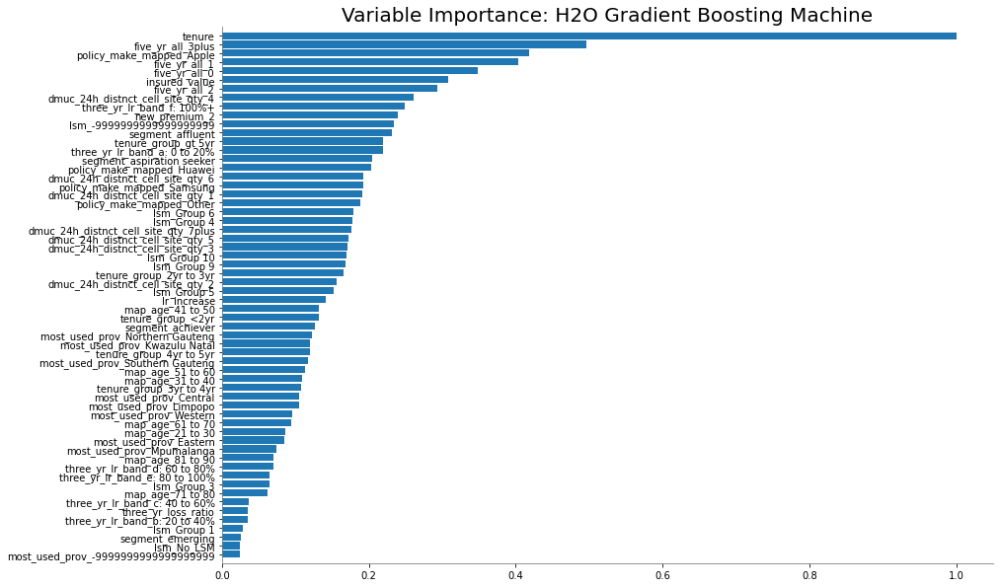

<Figure size 432x288 with 0 Axes>

In [150]:
best_model.varimp_plot(num_of_features=60)

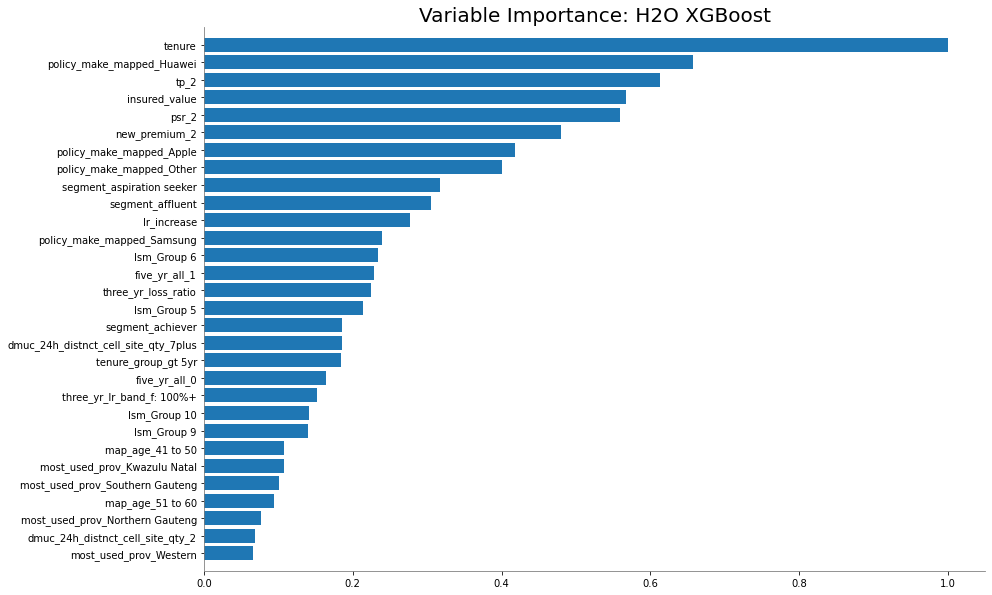

<Figure size 432x288 with 0 Axes>

In [151]:
m.varimp_plot(num_of_features=60)

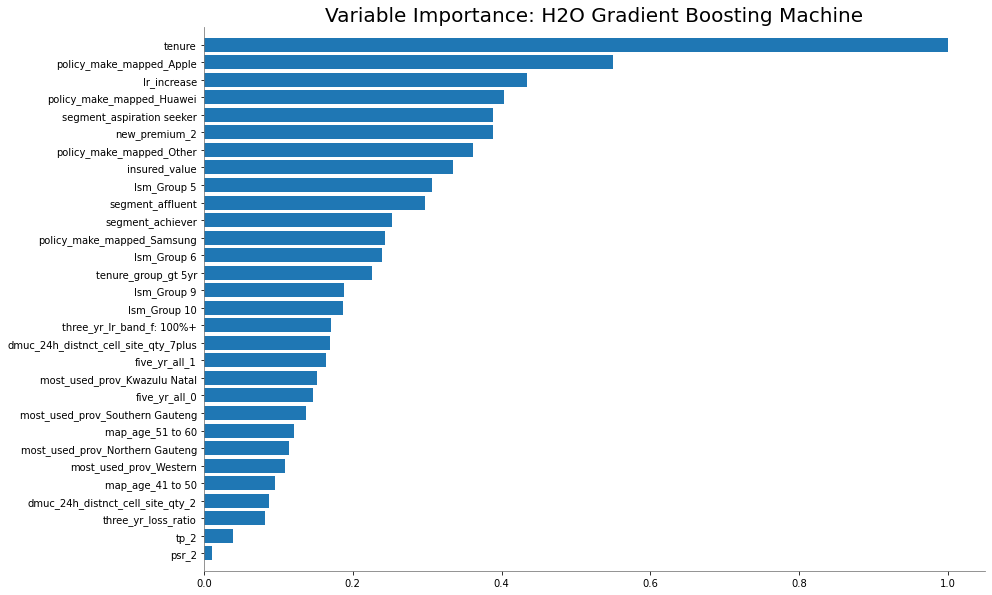

<Figure size 432x288 with 0 Axes>

In [152]:
m2.varimp_plot(num_of_features=60)

#### Generate new DataFrame with SMOTE and UnderSampling data

In [153]:
us_df = pd.DataFrame(np.column_stack([y_under,  X_under]), columns=['cancellation_check'] + feature_names)
us_df.head()

,cancellation_check,tenure,one_yr_loss_ratio,three_yr_loss_ratio,lr_increase,tp_2,psr_2,psr_2_increase_loading,new_premium_2,count_th_lo,...,five_yr_all_2,five_yr_all_3plus,map_age_11 to 20,map_age_21 to 30,map_age_31 to 40,map_age_41 to 50,map_age_51 to 60,map_age_61 to 70,map_age_71 to 80,map_age_81 to 90
0,0.0,31.0,0.0,0.0,0.0,48.977180,0.816707,0.005,43.40,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,0.0,7.0,0.0,0.0,0.0,325.412759,0.679137,0.010,240.89,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,0.0,29.0,0.0,0.0,0.0,16.967727,2.357416,0.000,43.20,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.0,12.0,0.0,0.0,0.0,28.412934,0.844686,0.005,26.04,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,0.0,15.0,0.0,0.0,0.0,80.969534,0.988026,0.005,93.31,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [154]:
hf_under = h2o.H2OFrame(us_df[['cancellation_check'] + list(best_vars)])
hf_under.head()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


cancellation_check,lsm_Group 2,count_ad_replace,segment_?,gross_ad_replace,ad_loss_of_si,segment_bottom of pyramid,lsm_Group 7,lsm_Group 8,count_ad_repair,count_ad,map_age_11 to 20,gross_ad_repair,gross_ad,lsm_No_LSM,dmuc_24h_distnct_cell_site_qty_-9999999999999999999,lsm_Group 1,count_th_lo,three_yr_all,three_yr_lr_band_b: 20 to 40%,gross_th_lo,most_used_prov_-9999999999999999999,five_yr_claims,segment_emerging,three_yr_lr_band_c: 40 to 60%,lsm_Group 3,three_yr_lr_band_d: 60 to 80%,three_yr_lr_band_e: 80 to 100%,map_age_71 to 80,peril_filter_AD,peril_filter_COMP,map_age_81 to 90,tenure_group_4yr to 5yr,tenure_group_2yr to 3yr,map_age_21 to 30,tenure_group_3yr to 4yr,most_used_prov_Central,one_yr_loss_ratio,most_used_prov_Mpumalanga,dmuc_24h_distnct_cell_site_qty_6,map_age_61 to 70,most_used_prov_Limpopo,three_yr_lr_band_a: 0 to 20%,lsm_-9999999999999999999,dmuc_24h_distnct_cell_site_qty_5,five_yr_all_3plus,lsm_Group 4,most_used_prov_Eastern,map_age_31 to 40,dmuc_24h_distnct_cell_site_qty_4,five_yr_all_2,dmuc_24h_distnct_cell_site_qty_2,policy_make_mapped_Apple,dmuc_24h_distnct_cell_site_qty_3,tenure_group_<2yr,psr_2_increase_loading,dmuc_24h_distnct_cell_site_qty_1,five_yr_all_0,segment_affluent,tenure_group_gt 5yr,lsm_Group 10,map_age_41 to 50,three_yr_lr_band_f: 100%+,most_used_prov_Kwazulu Natal,most_used_prov_Northern Gauteng,lsm_Group 9,segment_aspiration seeker,segment_achiever,map_age_51 to 60,policy_make_mapped_Huawei,most_used_prov_Western,policy_make_mapped_Other,most_used_prov_Southern Gauteng,dmuc_24h_distnct_cell_site_qty_7plus,lsm_Group 5,lsm_Group 6,policy_make_mapped_Samsung,lr_increase,three_yr_loss_ratio,five_yr_all_1,insured_value,new_premium_2,psr_2,tp_2,tenure
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,1,0,0,0,0,0,0,1,0,0.005,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1941.17,43.4,0.816707,48.9772,31
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0.01,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,14828.4,240.89,0.679137,325.413,7
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1941.17,43.2,2.35742,16.9677,29
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0.005,0,1,0,1,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,3771.64,26.04,0.844686,28.4129,12
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,1,0,0.005,0,1,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,3153.5,93.31,0.988026,80.9695,15
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,5.6455,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0.01,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,0,1,0,1,0.07,4.5164,1,3629.44,59.16,0.530733,96.0936,15
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,1,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1941.17,50.76,1.19589,39.3014,80
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,3.69064,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0.005,0,0,0,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0,0,1,1,0.07,2.8274,0,5823.5,108.57,0.750252,125.291,29
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0.005,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,7764.66,150.815,0.970939,143.16,11
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,1,0,1,0,0,1,0,0,0,0,0,0.025,3.34402,0,3658.34,33.15,1.48734,20.1702,24


In [155]:
hf_under['cancellation_check'] = hf_under['cancellation_check'].asfactor()
predictors = hf_under.drop('cancellation_check').columns
response = 'cancellation_check'

In [156]:
# Split into train and test
train_us, valid_us = hf_under.split_frame(ratios=[.8], seed=1234)

In [157]:
# Add a Stopping Creterias: max number of models and max time
# We are going to exclude DeepLearning algorithms because they are too slow
aml = H2OAutoML(
    max_models=20,
    max_runtime_secs=300,
    seed=1234,
    exclude_algos = ["DeepLearning", "StackedEnsemble"]
)

In [158]:
# Train the model
aml.train(x=predictors,
        y=response,
        training_frame=train_us,
        validation_frame=valid_us
)

AutoML progress: |
09:23:37.6: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.

███████████████████████████████████████████████████████████████| (done) 100%
Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_grid_1_AutoML_15_20240111_92337_model_2


Model Summary: 


,,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
0,,45.0,45.0,36486.0,7.0,7.0,7.0,20.0,91.0,59.68889




ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.19683218898143398
RMSE: 0.44365773855691276
LogLoss: 0.5752996202582452
Mean Per-Class Error: 0.3195706377254375
AUC: 0.7777980693187886
AUCPR: 0.767953693092904
Gini: 0.5555961386375772

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.46771912944509364: 


,,0,1,Error,Rate
0,0,4876.0,5344.0,0.5229,(5344.0/10220.0)
1,1,1190.0,9047.0,0.1162,(1190.0/10237.0)
2,Total,6066.0,14391.0,0.3194,(6534.0/20457.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.467719,0.734692,223.0
1,max f2,0.220756,0.854313,325.0
2,max f0point5,0.564282,0.702846,156.0
3,max accuracy,0.531584,0.700543,181.0
4,max precision,0.910512,1.000000,0.0
5,max recall,0.075549,1.000000,387.0
6,max specificity,0.910512,1.000000,0.0
7,max absolute_mcc,0.516068,0.404103,193.0
8,max min_per_class_accuracy,0.543428,0.698838,172.0
9,max mean_per_class_accuracy,0.531584,0.700507,181.0



Gains/Lift Table: Avg response rate: 50.04 %, avg score: 50.05 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010021,0.811697,1.920355,1.920355,0.960976,0.843491,0.960976,0.843491,0.019244,0.019244,92.035538,92.035538,0.018461
1,2,0.020042,0.782710,1.910607,1.915481,0.956098,0.795897,0.958537,0.819694,0.019146,0.038390,91.060739,91.548138,0.036727
2,3,0.030014,0.761680,1.792628,1.874664,0.897059,0.771568,0.938111,0.803704,0.017876,0.056266,79.262795,87.466363,0.052548
3,4,0.040035,0.745809,1.793631,1.854381,0.897561,0.753830,0.927961,0.791220,0.017974,0.074241,79.363142,85.438084,0.068468
4,5,0.050007,0.732782,1.792628,1.842066,0.897059,0.738852,0.921799,0.780778,0.017876,0.092117,79.262795,84.206648,0.084289
5,6,0.100015,0.689309,1.693607,1.767837,0.847507,0.709076,0.884653,0.744927,0.084693,0.176810,69.360726,76.783687,0.153718
6,7,0.150022,0.660088,1.611564,1.715746,0.806452,0.673829,0.858586,0.721228,0.080590,0.257400,61.156400,71.574591,0.214934
7,8,0.200029,0.637375,1.461151,1.652097,0.731183,0.648401,0.826735,0.703021,0.073068,0.330468,46.115136,65.209727,0.261094
8,9,0.299995,0.601080,1.351444,1.551912,0.676284,0.618253,0.776601,0.674774,0.135098,0.465566,35.144417,55.191223,0.331417
9,10,0.400010,0.570831,1.216975,1.468168,0.608993,0.585589,0.734694,0.652475,0.121715,0.587281,21.697499,46.816769,0.374855




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.21916769610940412
RMSE: 0.4681534963122716
LogLoss: 0.6241991760534583
Mean Per-Class Error: 0.39006581455157807
AUC: 0.6873109158548413
AUCPR: 0.6663326287838907
Gini: 0.37462183170968255

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.31575570349426785: 


,,0,1,Error,Rate
0,0,681.0,1821.0,0.7278,(1821.0/2502.0)
1,1,130.0,2355.0,0.0523,(130.0/2485.0)
2,Total,811.0,4176.0,0.3912,(1951.0/4987.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.315756,0.707101,293.0
1,max f2,0.174114,0.846164,348.0
2,max f0point5,0.515789,0.627504,193.0
3,max accuracy,0.515789,0.629236,193.0
4,max precision,0.930318,1.000000,0.0
5,max recall,0.063851,1.000000,394.0
6,max specificity,0.930318,1.000000,0.0
7,max absolute_mcc,0.347732,0.297982,281.0
8,max min_per_class_accuracy,0.544276,0.624700,170.0
9,max mean_per_class_accuracy,0.515789,0.629625,193.0



Gains/Lift Table: Avg response rate: 49.83 %, avg score: 50.26 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010026,0.805196,1.725883,1.725883,0.860000,0.838902,0.860000,0.838902,0.017304,0.017304,72.588330,72.588330,0.014506
1,2,0.020052,0.776038,1.485062,1.605473,0.740000,0.789467,0.800000,0.814184,0.014889,0.032193,48.506237,60.547284,0.024200
2,3,0.030078,0.751736,1.766020,1.658989,0.880000,0.764515,0.826667,0.797628,0.017706,0.049899,76.602012,65.898860,0.039508
3,4,0.040104,0.738137,1.485062,1.615507,0.740000,0.745452,0.805000,0.784584,0.014889,0.064789,48.506237,61.550704,0.049201
4,5,0.050130,0.725969,1.605473,1.613500,0.800000,0.730968,0.804000,0.773861,0.016097,0.080885,60.547284,61.350020,0.061301
5,6,0.100060,0.682482,1.515205,1.564451,0.755020,0.702534,0.779559,0.738269,0.075654,0.156539,51.520529,56.445124,0.112574
6,7,0.149990,0.653918,1.337894,1.489033,0.666667,0.666403,0.741979,0.714346,0.066801,0.223340,33.789403,48.903313,0.146202
7,8,0.200120,0.631941,1.204105,1.417658,0.600000,0.642697,0.706413,0.696397,0.060362,0.283702,20.410463,41.765825,0.166596
8,9,0.299980,0.598341,1.180732,1.338788,0.588353,0.614489,0.667112,0.669131,0.117907,0.401610,18.073178,33.878835,0.202569
9,10,0.400040,0.570677,1.109996,1.281562,0.553106,0.584190,0.638596,0.647885,0.111066,0.512676,10.999625,28.156165,0.224507




ModelMetricsBinomial: gbm
** Reported on cross-validation data. **

MSE: 0.21503639526158594
RMSE: 0.4637201691339141
LogLoss: 0.6156720383492776
Mean Per-Class Error: 0.3729924373559937
AUC: 0.7001599374663909
AUCPR: 0.6648662942056959
Gini: 0.40031987493278187

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.35771343840080294: 


,,0,1,Error,Rate
0,0,3218.0,7002.0,0.6851,(7002.0/10220.0)
1,1,623.0,9614.0,0.0609,(623.0/10237.0)
2,Total,3841.0,16616.0,0.3727,(7625.0/20457.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.357713,0.716047,278.0
1,max f2,0.181742,0.848119,342.0
2,max f0point5,0.509491,0.641958,198.0
3,max accuracy,0.506522,0.644572,200.0
4,max precision,0.929765,1.000000,0.0
5,max recall,0.045784,1.000000,399.0
6,max specificity,0.929765,1.000000,0.0
7,max absolute_mcc,0.357713,0.325227,278.0
8,max min_per_class_accuracy,0.543048,0.633562,173.0
9,max mean_per_class_accuracy,0.506522,0.644477,200.0



Gains/Lift Table: Avg response rate: 50.04 %, avg score: 50.07 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010021,0.808715,1.618167,1.618167,0.809756,0.840370,0.809756,0.840370,0.016216,0.016216,61.816748,61.816748,0.012400
1,2,0.020042,0.779768,1.559679,1.588923,0.780488,0.793151,0.795122,0.816761,0.015630,0.031845,55.967950,58.892349,0.023626
2,3,0.030014,0.760740,1.537938,1.571984,0.769608,0.769466,0.786645,0.801047,0.015337,0.047182,53.793764,57.198357,0.034364
3,4,0.040035,0.744884,1.481696,1.549384,0.741463,0.752447,0.775336,0.788882,0.014848,0.062030,48.169552,54.938399,0.044026
4,5,0.050007,0.731956,1.430184,1.525614,0.715686,0.738222,0.763441,0.778780,0.014262,0.076292,43.018405,52.561392,0.052613
5,6,0.100015,0.688885,1.425990,1.475802,0.713587,0.708407,0.738514,0.743593,0.071310,0.147602,42.598996,47.580194,0.095253
6,7,0.150022,0.659848,1.338086,1.429897,0.669599,0.673465,0.715543,0.720217,0.066914,0.214516,33.808647,42.989678,0.129095
7,8,0.200029,0.637352,1.318552,1.402061,0.659824,0.648543,0.701613,0.702299,0.065937,0.280453,31.855236,40.206068,0.160982
8,9,0.299995,0.602290,1.231251,1.345143,0.616137,0.619041,0.673130,0.674555,0.123083,0.403536,23.125066,34.514256,0.207254
9,10,0.400010,0.571468,1.183767,1.304794,0.592375,0.586147,0.652939,0.652451,0.118394,0.521930,18.376701,30.479374,0.244044




Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,accuracy,0.627072,0.002638,0.623167,0.626833,0.628208,0.626742,0.630408
1,auc,0.700276,0.009660,0.685663,0.702709,0.702426,0.698261,0.712323
2,err,0.372928,0.002638,0.376833,0.373167,0.371792,0.373258,0.369592
3,err_count,1525.800000,10.940749,1542.000000,1527.000000,1521.000000,1527.000000,1512.000000
4,f0point5,0.626580,0.001721,0.624031,0.626451,0.627336,0.626336,0.628746
5,f1,0.717156,0.002355,0.714656,0.717901,0.715541,0.716960,0.720724
6,f2,0.838354,0.004410,0.836075,0.840616,0.832608,0.838245,0.844223
7,lift_top_group,1.608427,0.142186,1.705650,1.364520,1.657321,1.706066,1.608577
8,logloss,0.615694,0.005164,0.623840,0.615580,0.613788,0.615622,0.609638
9,max_per_class_error,0.691194,0.007382,0.697162,0.695695,0.678571,0.691781,0.692759



Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
0,,2024-01-11 09:27:51,11.498 sec,0.0,0.500000,0.693147,0.500000,0.500416,1.000000,0.499584,0.500002,0.693150,0.500000,0.498296,1.000000,0.501704
1,,2024-01-11 09:27:51,11.600 sec,5.0,0.478209,0.649664,0.717576,0.693563,1.803379,0.358313,0.482878,0.658732,0.668847,0.646627,1.806157,0.391819
2,,2024-01-11 09:27:51,11.715 sec,10.0,0.467740,0.627966,0.734111,0.714533,1.891111,0.354109,0.475803,0.643555,0.679169,0.655819,1.725883,0.398636
3,,2024-01-11 09:27:51,11.821 sec,15.0,0.460387,0.612123,0.746937,0.729924,1.939851,0.352838,0.471904,0.634469,0.683685,0.659791,1.645610,0.389412
4,,2024-01-11 09:27:52,11.927 sec,20.0,0.455647,0.601502,0.753568,0.737539,1.900859,0.344039,0.469994,0.629517,0.684970,0.661446,1.685746,0.390415
5,,2024-01-11 09:27:52,12.033 sec,25.0,0.452531,0.594455,0.758602,0.744254,1.900859,0.334507,0.469094,0.627097,0.686066,0.662878,1.806157,0.388209
6,,2024-01-11 09:27:52,12.139 sec,30.0,0.449429,0.587667,0.765677,0.752646,1.910607,0.335044,0.468485,0.625347,0.686709,0.664948,1.645610,0.393423
7,,2024-01-11 09:27:52,12.253 sec,35.0,0.446969,0.582389,0.770949,0.759446,1.920355,0.321259,0.468450,0.625038,0.686346,0.664196,1.725883,0.390816
8,,2024-01-11 09:27:52,12.350 sec,40.0,0.444947,0.578114,0.775567,0.765203,1.930103,0.324094,0.468334,0.624677,0.686479,0.665376,1.725883,0.390014
9,,2024-01-11 09:27:52,12.449 sec,45.0,0.443658,0.575300,0.777798,0.767954,1.920355,0.319402,0.468153,0.624199,0.687311,0.666333,1.725883,0.391217



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,tenure,1541.772583,1.000000,0.282946
1,new_premium_2,902.266418,0.585214,0.165584
2,insured_value,838.953064,0.544148,0.153965
3,tenure_group_<2yr,248.630219,0.161263,0.045629
4,three_yr_loss_ratio,230.683014,0.149622,0.042335
5,tenure_group_gt 5yr,119.983513,0.077822,0.022019
6,one_yr_loss_ratio,73.408913,0.047613,0.013472
7,lr_increase,72.804909,0.047222,0.013361
8,lsm_-9999999999999999999,64.384804,0.041760,0.011816
9,tp_2,57.678558,0.037411,0.010585



See the whole table with table.as_data_frame()


In [159]:
# View the AutoML Leaderboard
lb_2 = aml.leaderboard
lb_2.head(rows=10)  # Print the first 10 rows

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
GBM_grid_1_AutoML_15_20240111_92337_model_2,0.70016,0.615672,0.664866,0.372992,0.46372,0.215036
GBM_3_AutoML_15_20240111_92337,0.700076,0.615978,0.664971,0.376468,0.463955,0.215254
GBM_5_AutoML_15_20240111_92337,0.699063,0.616729,0.664651,0.374215,0.464218,0.215498
GBM_2_AutoML_15_20240111_92337,0.697511,0.617331,0.665642,0.373672,0.464628,0.215879
GBM_1_AutoML_15_20240111_92337,0.69663,0.618389,0.662351,0.378526,0.465068,0.216288
GBM_4_AutoML_15_20240111_92337,0.695158,0.618211,0.660953,0.375929,0.465126,0.216342
GBM_grid_1_AutoML_15_20240111_92337_model_1,0.693787,0.619438,0.660248,0.377494,0.465754,0.216927
GBM_grid_1_AutoML_15_20240111_92337_model_3,0.69315,0.621998,0.659241,0.380825,0.466533,0.217653
XGBoost_3_AutoML_15_20240111_92337,0.692472,0.621613,0.657584,0.38303,0.466558,0.217676
XGBoost_grid_1_AutoML_15_20240111_92337_model_3,0.690429,0.626943,0.653558,0.380432,0.46882,0.219793


In [160]:
lb_2 = lb_2.as_data_frame()
lb_2['model_type'] = lb_2['model_id'].apply(lambda x: x.split('_')[0])
fig = px.bar(
    lb_2, 
    x='model_id',
    y='auc',
    color='model_type'
)
# fig.update_yaxes(range=[0.999, 1])
fig.show()

In [161]:
best_model = aml.get_best_model()
print(best_model)

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_grid_1_AutoML_15_20240111_92337_model_2


Model Summary: 


,,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
0,,45.0,45.0,36486.0,7.0,7.0,7.0,20.0,91.0,59.68889




ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.19683218898143398
RMSE: 0.44365773855691276
LogLoss: 0.5752996202582452
Mean Per-Class Error: 0.3195706377254375
AUC: 0.7777980693187886
AUCPR: 0.767953693092904
Gini: 0.5555961386375772

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.46771912944509364: 


,,0,1,Error,Rate
0,0,4876.0,5344.0,0.5229,(5344.0/10220.0)
1,1,1190.0,9047.0,0.1162,(1190.0/10237.0)
2,Total,6066.0,14391.0,0.3194,(6534.0/20457.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.467719,0.734692,223.0
1,max f2,0.220756,0.854313,325.0
2,max f0point5,0.564282,0.702846,156.0
3,max accuracy,0.531584,0.700543,181.0
4,max precision,0.910512,1.000000,0.0
5,max recall,0.075549,1.000000,387.0
6,max specificity,0.910512,1.000000,0.0
7,max absolute_mcc,0.516068,0.404103,193.0
8,max min_per_class_accuracy,0.543428,0.698838,172.0
9,max mean_per_class_accuracy,0.531584,0.700507,181.0



Gains/Lift Table: Avg response rate: 50.04 %, avg score: 50.05 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010021,0.811697,1.920355,1.920355,0.960976,0.843491,0.960976,0.843491,0.019244,0.019244,92.035538,92.035538,0.018461
1,2,0.020042,0.782710,1.910607,1.915481,0.956098,0.795897,0.958537,0.819694,0.019146,0.038390,91.060739,91.548138,0.036727
2,3,0.030014,0.761680,1.792628,1.874664,0.897059,0.771568,0.938111,0.803704,0.017876,0.056266,79.262795,87.466363,0.052548
3,4,0.040035,0.745809,1.793631,1.854381,0.897561,0.753830,0.927961,0.791220,0.017974,0.074241,79.363142,85.438084,0.068468
4,5,0.050007,0.732782,1.792628,1.842066,0.897059,0.738852,0.921799,0.780778,0.017876,0.092117,79.262795,84.206648,0.084289
5,6,0.100015,0.689309,1.693607,1.767837,0.847507,0.709076,0.884653,0.744927,0.084693,0.176810,69.360726,76.783687,0.153718
6,7,0.150022,0.660088,1.611564,1.715746,0.806452,0.673829,0.858586,0.721228,0.080590,0.257400,61.156400,71.574591,0.214934
7,8,0.200029,0.637375,1.461151,1.652097,0.731183,0.648401,0.826735,0.703021,0.073068,0.330468,46.115136,65.209727,0.261094
8,9,0.299995,0.601080,1.351444,1.551912,0.676284,0.618253,0.776601,0.674774,0.135098,0.465566,35.144417,55.191223,0.331417
9,10,0.400010,0.570831,1.216975,1.468168,0.608993,0.585589,0.734694,0.652475,0.121715,0.587281,21.697499,46.816769,0.374855




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.21916769610940412
RMSE: 0.4681534963122716
LogLoss: 0.6241991760534583
Mean Per-Class Error: 0.39006581455157807
AUC: 0.6873109158548413
AUCPR: 0.6663326287838907
Gini: 0.37462183170968255

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.31575570349426785: 


,,0,1,Error,Rate
0,0,681.0,1821.0,0.7278,(1821.0/2502.0)
1,1,130.0,2355.0,0.0523,(130.0/2485.0)
2,Total,811.0,4176.0,0.3912,(1951.0/4987.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.315756,0.707101,293.0
1,max f2,0.174114,0.846164,348.0
2,max f0point5,0.515789,0.627504,193.0
3,max accuracy,0.515789,0.629236,193.0
4,max precision,0.930318,1.000000,0.0
5,max recall,0.063851,1.000000,394.0
6,max specificity,0.930318,1.000000,0.0
7,max absolute_mcc,0.347732,0.297982,281.0
8,max min_per_class_accuracy,0.544276,0.624700,170.0
9,max mean_per_class_accuracy,0.515789,0.629625,193.0



Gains/Lift Table: Avg response rate: 49.83 %, avg score: 50.26 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010026,0.805196,1.725883,1.725883,0.860000,0.838902,0.860000,0.838902,0.017304,0.017304,72.588330,72.588330,0.014506
1,2,0.020052,0.776038,1.485062,1.605473,0.740000,0.789467,0.800000,0.814184,0.014889,0.032193,48.506237,60.547284,0.024200
2,3,0.030078,0.751736,1.766020,1.658989,0.880000,0.764515,0.826667,0.797628,0.017706,0.049899,76.602012,65.898860,0.039508
3,4,0.040104,0.738137,1.485062,1.615507,0.740000,0.745452,0.805000,0.784584,0.014889,0.064789,48.506237,61.550704,0.049201
4,5,0.050130,0.725969,1.605473,1.613500,0.800000,0.730968,0.804000,0.773861,0.016097,0.080885,60.547284,61.350020,0.061301
5,6,0.100060,0.682482,1.515205,1.564451,0.755020,0.702534,0.779559,0.738269,0.075654,0.156539,51.520529,56.445124,0.112574
6,7,0.149990,0.653918,1.337894,1.489033,0.666667,0.666403,0.741979,0.714346,0.066801,0.223340,33.789403,48.903313,0.146202
7,8,0.200120,0.631941,1.204105,1.417658,0.600000,0.642697,0.706413,0.696397,0.060362,0.283702,20.410463,41.765825,0.166596
8,9,0.299980,0.598341,1.180732,1.338788,0.588353,0.614489,0.667112,0.669131,0.117907,0.401610,18.073178,33.878835,0.202569
9,10,0.400040,0.570677,1.109996,1.281562,0.553106,0.584190,0.638596,0.647885,0.111066,0.512676,10.999625,28.156165,0.224507




ModelMetricsBinomial: gbm
** Reported on cross-validation data. **

MSE: 0.21503639526158594
RMSE: 0.4637201691339141
LogLoss: 0.6156720383492776
Mean Per-Class Error: 0.3729924373559937
AUC: 0.7001599374663909
AUCPR: 0.6648662942056959
Gini: 0.40031987493278187

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.35771343840080294: 


,,0,1,Error,Rate
0,0,3218.0,7002.0,0.6851,(7002.0/10220.0)
1,1,623.0,9614.0,0.0609,(623.0/10237.0)
2,Total,3841.0,16616.0,0.3727,(7625.0/20457.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.357713,0.716047,278.0
1,max f2,0.181742,0.848119,342.0
2,max f0point5,0.509491,0.641958,198.0
3,max accuracy,0.506522,0.644572,200.0
4,max precision,0.929765,1.000000,0.0
5,max recall,0.045784,1.000000,399.0
6,max specificity,0.929765,1.000000,0.0
7,max absolute_mcc,0.357713,0.325227,278.0
8,max min_per_class_accuracy,0.543048,0.633562,173.0
9,max mean_per_class_accuracy,0.506522,0.644477,200.0



Gains/Lift Table: Avg response rate: 50.04 %, avg score: 50.07 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010021,0.808715,1.618167,1.618167,0.809756,0.840370,0.809756,0.840370,0.016216,0.016216,61.816748,61.816748,0.012400
1,2,0.020042,0.779768,1.559679,1.588923,0.780488,0.793151,0.795122,0.816761,0.015630,0.031845,55.967950,58.892349,0.023626
2,3,0.030014,0.760740,1.537938,1.571984,0.769608,0.769466,0.786645,0.801047,0.015337,0.047182,53.793764,57.198357,0.034364
3,4,0.040035,0.744884,1.481696,1.549384,0.741463,0.752447,0.775336,0.788882,0.014848,0.062030,48.169552,54.938399,0.044026
4,5,0.050007,0.731956,1.430184,1.525614,0.715686,0.738222,0.763441,0.778780,0.014262,0.076292,43.018405,52.561392,0.052613
5,6,0.100015,0.688885,1.425990,1.475802,0.713587,0.708407,0.738514,0.743593,0.071310,0.147602,42.598996,47.580194,0.095253
6,7,0.150022,0.659848,1.338086,1.429897,0.669599,0.673465,0.715543,0.720217,0.066914,0.214516,33.808647,42.989678,0.129095
7,8,0.200029,0.637352,1.318552,1.402061,0.659824,0.648543,0.701613,0.702299,0.065937,0.280453,31.855236,40.206068,0.160982
8,9,0.299995,0.602290,1.231251,1.345143,0.616137,0.619041,0.673130,0.674555,0.123083,0.403536,23.125066,34.514256,0.207254
9,10,0.400010,0.571468,1.183767,1.304794,0.592375,0.586147,0.652939,0.652451,0.118394,0.521930,18.376701,30.479374,0.244044




Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,accuracy,0.627072,0.002638,0.623167,0.626833,0.628208,0.626742,0.630408
1,auc,0.700276,0.009660,0.685663,0.702709,0.702426,0.698261,0.712323
2,err,0.372928,0.002638,0.376833,0.373167,0.371792,0.373258,0.369592
3,err_count,1525.800000,10.940749,1542.000000,1527.000000,1521.000000,1527.000000,1512.000000
4,f0point5,0.626580,0.001721,0.624031,0.626451,0.627336,0.626336,0.628746
5,f1,0.717156,0.002355,0.714656,0.717901,0.715541,0.716960,0.720724
6,f2,0.838354,0.004410,0.836075,0.840616,0.832608,0.838245,0.844223
7,lift_top_group,1.608427,0.142186,1.705650,1.364520,1.657321,1.706066,1.608577
8,logloss,0.615694,0.005164,0.623840,0.615580,0.613788,0.615622,0.609638
9,max_per_class_error,0.691194,0.007382,0.697162,0.695695,0.678571,0.691781,0.692759



Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
0,,2024-01-11 09:27:51,11.498 sec,0.0,0.500000,0.693147,0.500000,0.500416,1.000000,0.499584,0.500002,0.693150,0.500000,0.498296,1.000000,0.501704
1,,2024-01-11 09:27:51,11.600 sec,5.0,0.478209,0.649664,0.717576,0.693563,1.803379,0.358313,0.482878,0.658732,0.668847,0.646627,1.806157,0.391819
2,,2024-01-11 09:27:51,11.715 sec,10.0,0.467740,0.627966,0.734111,0.714533,1.891111,0.354109,0.475803,0.643555,0.679169,0.655819,1.725883,0.398636
3,,2024-01-11 09:27:51,11.821 sec,15.0,0.460387,0.612123,0.746937,0.729924,1.939851,0.352838,0.471904,0.634469,0.683685,0.659791,1.645610,0.389412
4,,2024-01-11 09:27:52,11.927 sec,20.0,0.455647,0.601502,0.753568,0.737539,1.900859,0.344039,0.469994,0.629517,0.684970,0.661446,1.685746,0.390415
5,,2024-01-11 09:27:52,12.033 sec,25.0,0.452531,0.594455,0.758602,0.744254,1.900859,0.334507,0.469094,0.627097,0.686066,0.662878,1.806157,0.388209
6,,2024-01-11 09:27:52,12.139 sec,30.0,0.449429,0.587667,0.765677,0.752646,1.910607,0.335044,0.468485,0.625347,0.686709,0.664948,1.645610,0.393423
7,,2024-01-11 09:27:52,12.253 sec,35.0,0.446969,0.582389,0.770949,0.759446,1.920355,0.321259,0.468450,0.625038,0.686346,0.664196,1.725883,0.390816
8,,2024-01-11 09:27:52,12.350 sec,40.0,0.444947,0.578114,0.775567,0.765203,1.930103,0.324094,0.468334,0.624677,0.686479,0.665376,1.725883,0.390014
9,,2024-01-11 09:27:52,12.449 sec,45.0,0.443658,0.575300,0.777798,0.767954,1.920355,0.319402,0.468153,0.624199,0.687311,0.666333,1.725883,0.391217



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,tenure,1541.772583,1.000000,0.282946
1,new_premium_2,902.266418,0.585214,0.165584
2,insured_value,838.953064,0.544148,0.153965
3,tenure_group_<2yr,248.630219,0.161263,0.045629
4,three_yr_loss_ratio,230.683014,0.149622,0.042335
5,tenure_group_gt 5yr,119.983513,0.077822,0.022019
6,one_yr_loss_ratio,73.408913,0.047613,0.013472
7,lr_increase,72.804909,0.047222,0.013361
8,lsm_-9999999999999999999,64.384804,0.041760,0.011816
9,tp_2,57.678558,0.037411,0.010585



See the whole table with table.as_data_frame()



In [162]:
best_model.model_performance(h20_x_test)


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.22663267011873528
RMSE: 0.47605952371393145
LogLoss: 0.6298913437935155
Mean Per-Class Error: 0.40602565472912316
AUC: 0.7067017020641634
AUCPR: 0.09892698365380348
Gini: 0.41340340412832677

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.6350405166986639: 


,,0,1,Error,Rate
0,0,59284.0,7735.0,0.1154,(7735.0/67019.0)
1,1,2216.0,965.0,0.6966,(2216.0/3181.0)
2,Total,61500.0,8700.0,0.1418,(9951.0/70200.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.635041,0.162444,85.0
1,max f2,0.559327,0.263461,137.0
2,max f0point5,0.694347,0.135050,53.0
3,max accuracy,0.915376,0.954701,1.0
4,max precision,0.915376,0.600000,1.0
5,max recall,0.076221,1.000000,386.0
6,max specificity,0.933308,0.999985,0.0
7,max absolute_mcc,0.559327,0.122629,137.0
8,max min_per_class_accuracy,0.545581,0.638164,147.0
9,max mean_per_class_accuracy,0.514668,0.643702,170.0



Gains/Lift Table: Avg response rate:  4.53 %, avg score: 44.24 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.01,0.768494,4.212512,4.212512,0.190883,0.803991,0.190883,0.803991,0.042125,0.042125,321.251179,321.251179,0.033650
1,2,0.02,0.734911,2.797862,3.505187,0.126781,0.750123,0.158832,0.777057,0.027979,0.070104,179.786231,250.518705,0.052482
2,3,0.03,0.715316,2.420622,3.143666,0.109687,0.724283,0.142450,0.759466,0.024206,0.094310,142.062245,214.366551,0.067362
3,4,0.04,0.700692,2.546369,2.994341,0.115385,0.707837,0.135684,0.746559,0.025464,0.119774,154.636907,199.434140,0.083560
4,5,0.05,0.688049,2.577806,2.911034,0.116809,0.694211,0.131909,0.736089,0.025778,0.145552,157.780572,191.103427,0.100087
5,6,0.10,0.647647,2.131405,2.521220,0.096581,0.665773,0.114245,0.700931,0.106570,0.252122,113.140522,152.121974,0.159342
6,7,0.15,0.621275,1.817039,2.286493,0.082336,0.633939,0.103609,0.678600,0.090852,0.342974,81.703867,128.649272,0.202133
7,8,0.20,0.600531,1.584407,2.110971,0.071795,0.610520,0.095655,0.661580,0.079220,0.422194,58.440742,111.097139,0.232741
8,9,0.30,0.566453,1.310909,1.844284,0.059402,0.582863,0.083571,0.635341,0.131091,0.553285,31.090852,84.428377,0.265307
9,10,0.40,0.537047,1.134863,1.666929,0.051425,0.551611,0.075534,0.614409,0.113486,0.666771,13.486325,66.692864,0.279434


##### Oversample data

In [163]:
os_df = pd.DataFrame(np.column_stack([y_over,  X_over]), columns=['cancellation_check'] + feature_names)
os_df.head()

,cancellation_check,tenure,one_yr_loss_ratio,three_yr_loss_ratio,lr_increase,tp_2,psr_2,psr_2_increase_loading,new_premium_2,count_th_lo,...,five_yr_all_2,five_yr_all_3plus,map_age_11 to 20,map_age_21 to 30,map_age_31 to 40,map_age_41 to 50,map_age_51 to 60,map_age_61 to 70,map_age_71 to 80,map_age_81 to 90
0,0.0,15.0,0.0,0.000000,0.000,355.781235,0.666140,0.01,258.33,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,5.0,0.0,0.000000,0.000,69.661146,3.172500,0.00,238.68,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,0.0,29.0,0.0,0.000000,0.000,16.390016,2.562536,0.00,45.36,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,29.0,0.0,1.267441,0.025,82.780548,1.135532,0.00,103.87,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,0.0,8.0,0.0,0.000000,0.000,21.137795,1.230024,0.00,28.08,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


In [164]:
hf_over = h2o.H2OFrame(os_df[['cancellation_check'] + list(best_vars)])
hf_over.head()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


cancellation_check,lsm_Group 2,count_ad_replace,segment_?,gross_ad_replace,ad_loss_of_si,segment_bottom of pyramid,lsm_Group 7,lsm_Group 8,count_ad_repair,count_ad,map_age_11 to 20,gross_ad_repair,gross_ad,lsm_No_LSM,dmuc_24h_distnct_cell_site_qty_-9999999999999999999,lsm_Group 1,count_th_lo,three_yr_all,three_yr_lr_band_b: 20 to 40%,gross_th_lo,most_used_prov_-9999999999999999999,five_yr_claims,segment_emerging,three_yr_lr_band_c: 40 to 60%,lsm_Group 3,three_yr_lr_band_d: 60 to 80%,three_yr_lr_band_e: 80 to 100%,map_age_71 to 80,peril_filter_AD,peril_filter_COMP,map_age_81 to 90,tenure_group_4yr to 5yr,tenure_group_2yr to 3yr,map_age_21 to 30,tenure_group_3yr to 4yr,most_used_prov_Central,one_yr_loss_ratio,most_used_prov_Mpumalanga,dmuc_24h_distnct_cell_site_qty_6,map_age_61 to 70,most_used_prov_Limpopo,three_yr_lr_band_a: 0 to 20%,lsm_-9999999999999999999,dmuc_24h_distnct_cell_site_qty_5,five_yr_all_3plus,lsm_Group 4,most_used_prov_Eastern,map_age_31 to 40,dmuc_24h_distnct_cell_site_qty_4,five_yr_all_2,dmuc_24h_distnct_cell_site_qty_2,policy_make_mapped_Apple,dmuc_24h_distnct_cell_site_qty_3,tenure_group_<2yr,psr_2_increase_loading,dmuc_24h_distnct_cell_site_qty_1,five_yr_all_0,segment_affluent,tenure_group_gt 5yr,lsm_Group 10,map_age_41 to 50,three_yr_lr_band_f: 100%+,most_used_prov_Kwazulu Natal,most_used_prov_Northern Gauteng,lsm_Group 9,segment_aspiration seeker,segment_achiever,map_age_51 to 60,policy_make_mapped_Huawei,most_used_prov_Western,policy_make_mapped_Other,most_used_prov_Southern Gauteng,dmuc_24h_distnct_cell_site_qty_7plus,lsm_Group 5,lsm_Group 6,policy_make_mapped_Samsung,lr_increase,three_yr_loss_ratio,five_yr_all_1,insured_value,new_premium_2,psr_2,tp_2,tenure
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0.01,1,1,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,0,0,13139.9,258.33,0.66614,355.781,15
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,1,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,15879.7,238.68,3.1725,69.6611,5
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,1,0,0,0,0,1575.78,45.36,2.56254,16.39,29
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,1,1,0,1,0,1,0,0.025,1.26744,1,3765.7,103.87,1.13553,82.7805,29
0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,3940.52,28.08,1.23002,21.1378,8
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,1,0,1,0,0,0,0,0,15879.7,238.68,1.49706,147.623,5
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,1,1,0,0,0,3882.34,95.04,1.10926,79.3319,29
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,1,0,0,2.31911,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0.015,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0.06,0.927642,1,2717.64,72.765,0.292411,215.45,30
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,2938.02,58.32,1.08924,54.1661,11
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,5823.5,115.56,1.16547,91.8087,15


In [165]:
hf_over['cancellation_check'] = hf_over['cancellation_check'].asfactor()
predictors = hf_over.drop('cancellation_check').columns
response = 'cancellation_check'

In [166]:
# Split into train and test
train, valid = hf_over.split_frame(ratios=[.8], seed=1234)

In [167]:
# Add a Stopping Creterias: max number of models and max time
# We are going to exclude DeepLearning algorithms because they are too slow
aml = H2OAutoML(
    max_models=20,
    max_runtime_secs=300,
    seed=1234,
    exclude_algos = ["DeepLearning", "StackedEnsemble"]
)

In [168]:
# Train the model
aml.train(x=predictors,
        y=response,
        training_frame=train,
        validation_frame=valid
)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%
Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_1_AutoML_16_20240111_93435


Model Summary: 


,,number_of_trees
0,,102.0




ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.05539536440885992
RMSE: 0.23536219834302177
LogLoss: 0.2233047182613271
Mean Per-Class Error: 0.03632234594368555
AUC: 0.993422600407969
AUCPR: 0.9926166482180089
Gini: 0.9868452008159381

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5630486633176002: 


,,0,1,Error,Rate
0,0,163807.0,7962.0,0.0464,(7962.0/171769.0)
1,1,4517.0,167286.0,0.0263,(4517.0/171803.0)
2,Total,168324.0,175248.0,0.0363,(12479.0/343572.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.563049,0.964043,181.0
1,max f2,0.478968,0.976933,207.0
2,max f0point5,0.639827,0.966306,156.0
3,max accuracy,0.579658,0.963760,176.0
4,max precision,0.993013,1.000000,0.0
5,max recall,0.084205,1.000000,352.0
6,max specificity,0.993013,1.000000,0.0
7,max absolute_mcc,0.579658,0.927552,176.0
8,max min_per_class_accuracy,0.589837,0.961869,173.0
9,max mean_per_class_accuracy,0.579658,0.963760,176.0



Gains/Lift Table: Avg response rate: 50.00 %, avg score: 50.01 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010007,0.969409,1.999802,1.999802,1.000000,0.977745,1.000000,0.977745,0.020011,0.020011,99.980210,99.980210,0.020011
1,2,0.020042,0.958622,1.999222,1.999512,0.999710,0.963697,0.999855,0.970710,0.020064,0.040075,99.922211,99.951168,0.040069
2,3,0.030002,0.951138,1.999802,1.999608,1.000000,0.954767,0.999903,0.965418,0.019918,0.059993,99.980210,99.960809,0.059987
3,4,0.040000,0.943677,1.998056,1.999220,0.999127,0.947172,0.999709,0.960857,0.019976,0.079969,99.805555,99.922004,0.079946
4,5,0.050007,0.937772,1.999220,1.999220,0.999709,0.940577,0.999709,0.956799,0.020005,0.099975,99.922042,99.922012,0.099946
5,6,0.100029,0.911818,1.998173,1.998696,0.999185,0.924566,0.999447,0.940680,0.099952,0.199927,99.817303,99.869650,0.199816
6,7,0.150030,0.888178,1.996310,1.997901,0.998254,0.900427,0.999049,0.927265,0.099818,0.299744,99.630981,99.790107,0.299459
7,8,0.200002,0.863590,1.991882,1.996397,0.996039,0.875811,0.998297,0.914409,0.099538,0.399283,99.188163,99.639707,0.398602
8,9,0.300007,0.810573,1.985426,1.992740,0.992811,0.837827,0.996469,0.888881,0.198553,0.597836,98.542592,99.273991,0.595717
9,10,0.400027,0.735416,1.948183,1.981599,0.974188,0.775683,0.990898,0.860578,0.194857,0.792693,94.818341,98.159933,0.785410




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.06906422456486368
RMSE: 0.26280073166729134
LogLoss: 0.25784632562514775
Mean Per-Class Error: 0.05825678847258478
AUC: 0.9834967340003834
AUCPR: 0.9797695941559342
Gini: 0.9669934680007668

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5618478843799004: 


,,0,1,Error,Rate
0,0,49176.0,4232.0,0.0792,(4232.0/53408.0)
1,1,1994.0,51501.0,0.0373,(1994.0/53495.0)
2,Total,51170.0,55733.0,0.0582,(6226.0/106903.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.561848,0.943000,180.0
1,max f2,0.483699,0.964731,205.0
2,max f0point5,0.646762,0.943212,152.0
3,max accuracy,0.571661,0.941957,177.0
4,max precision,0.991038,1.000000,0.0
5,max recall,0.084744,1.000000,353.0
6,max specificity,0.991038,1.000000,0.0
7,max absolute_mcc,0.571661,0.884380,177.0
8,max min_per_class_accuracy,0.603748,0.939728,167.0
9,max mean_per_class_accuracy,0.571661,0.941943,177.0



Gains/Lift Table: Avg response rate: 50.04 %, avg score: 50.98 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010046,0.968370,1.996513,1.996513,0.999069,0.976954,0.999069,0.976954,0.020058,0.020058,99.651300,99.651300,0.020039
1,2,0.020009,0.957468,1.992744,1.994637,0.997183,0.962458,0.998130,0.969736,0.019852,0.039910,99.274446,99.463666,0.039835
2,3,0.030009,0.948958,1.985288,1.991521,0.993452,0.953167,0.996571,0.964215,0.019852,0.059763,98.528798,99.152140,0.059557
3,4,0.040008,0.941044,1.987157,1.990431,0.994387,0.944780,0.996025,0.959357,0.019871,0.079634,98.715736,99.043065,0.079315
4,5,0.050073,0.934878,1.989088,1.990161,0.995353,0.938031,0.995890,0.955071,0.020021,0.099654,98.908756,99.016067,0.099242
5,6,0.100044,0.907574,1.983036,1.986602,0.992325,0.920682,0.994109,0.937894,0.099093,0.198748,98.303611,98.660205,0.197568
6,7,0.150024,0.881347,1.979299,1.984169,0.990455,0.894746,0.992892,0.923519,0.098925,0.297673,97.929880,98.416900,0.295538
7,8,0.200013,0.855297,1.970702,1.980803,0.986153,0.868604,0.991208,0.909794,0.098514,0.396187,97.070159,98.080309,0.392666
8,9,0.300020,0.800376,1.947344,1.969650,0.974465,0.829133,0.985627,0.882907,0.194747,0.590934,94.734421,96.965013,0.582302
9,10,0.399998,0.727846,1.871793,1.945191,0.936658,0.765773,0.973387,0.853630,0.187139,0.778073,87.179256,94.519089,0.756765




Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
0,,2024-01-11 09:34:35,0.006 sec,0.0,0.500000,0.693147,0.500000,0.500049,1.000000,0.499951,0.500000,0.693147,0.500000,0.500407,1.000000,0.499593
1,,2024-01-11 09:34:43,7.919 sec,5.0,0.411863,0.517494,0.870413,0.859756,1.976036,0.228887,0.419828,0.531847,0.846888,0.829206,1.933067,0.248356
2,,2024-01-11 09:34:50,14.575 sec,10.0,0.379524,0.453510,0.911962,0.903463,1.989332,0.178283,0.391301,0.473871,0.888338,0.873339,1.959444,0.199667
3,,2024-01-11 09:34:55,20.452 sec,15.0,0.356967,0.412081,0.934763,0.928200,1.993400,0.144645,0.371118,0.435711,0.912375,0.899323,1.977944,0.167582
4,,2024-01-11 09:35:00,25.109 sec,20.0,0.347449,0.395082,0.943403,0.938034,1.998639,0.135031,0.362750,0.420211,0.921618,0.910178,1.981659,0.159257
5,,2024-01-11 09:35:05,29.651 sec,25.0,0.337906,0.378835,0.950783,0.945941,1.998065,0.121963,0.354199,0.405155,0.930108,0.919482,1.981674,0.147713
6,,2024-01-11 09:35:09,33.773 sec,30.0,0.330977,0.367116,0.956004,0.951775,1.998058,0.113868,0.347856,0.394013,0.936185,0.926646,1.983460,0.138677
7,,2024-01-11 09:35:13,38.209 sec,35.0,0.324328,0.355889,0.960586,0.956788,1.999222,0.107381,0.341727,0.383250,0.941509,0.932611,1.987189,0.131007
8,,2024-01-11 09:35:18,42.602 sec,40.0,0.314424,0.340236,0.966900,0.963660,1.999221,0.096705,0.333152,0.369031,0.948435,0.940311,1.992771,0.122260
9,,2024-01-11 09:35:23,47.750 sec,45.0,0.302903,0.322214,0.973065,0.970116,1.998641,0.085493,0.322770,0.351962,0.955892,0.948263,1.994652,0.110455



See the whole table with table.as_data_frame()

Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,psr_2,61415.867188,1.000000,0.148902
1,tp_2,61103.632812,0.994916,0.148145
2,tenure,51150.164062,0.832849,0.124013
3,new_premium_2,47199.089844,0.768516,0.114433
4,insured_value,36777.054688,0.598820,0.089165
5,three_yr_loss_ratio,20560.509766,0.334775,0.049849
6,one_yr_loss_ratio,10779.288086,0.175513,0.026134
7,policy_make_mapped_Samsung,5036.235840,0.082002,0.012210
8,psr_2_increase_loading,4592.491211,0.074777,0.011134
9,lsm_Group 6,4565.381836,0.074336,0.011069



See the whole table with table.as_data_frame()


In [169]:
# View the AutoML Leaderboard
lb = aml.leaderboard
lb.head(rows=10)  # Print the first 5 rows

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
XGBoost_1_AutoML_16_20240111_93435,0.983497,0.257846,0.97977,0.0582568,0.262801,0.0690642
DRF_1_AutoML_16_20240111_93435,0.973441,0.41836,0.974005,0.0890105,0.358114,0.128246
GBM_1_AutoML_16_20240111_93435,0.912417,0.451917,0.902292,0.168337,0.378992,0.143635
XGBoost_2_AutoML_16_20240111_93435,0.896028,0.449306,0.882748,0.191167,0.379637,0.144124
GBM_4_AutoML_16_20240111_93435,0.88857,0.48004,0.881181,0.202657,0.394571,0.155687
XGBoost_grid_1_AutoML_16_20240111_93435_model_1,0.872778,0.483091,0.858352,0.222721,0.397656,0.158131
GBM_grid_1_AutoML_16_20240111_93435_model_1,0.863827,0.511453,0.854563,0.230978,0.411492,0.169326
GBM_3_AutoML_16_20240111_93435,0.827575,0.531402,0.81461,0.264026,0.422245,0.178291
GBM_2_AutoML_16_20240111_93435,0.79772,0.555246,0.780372,0.291985,0.434294,0.188611
XGBoost_3_AutoML_16_20240111_93435,0.774947,0.5661,0.753414,0.320072,0.440139,0.193722


In [170]:
lb = lb.as_data_frame()
lb['model_type'] = lb['model_id'].apply(lambda x: x.split('_')[0])
fig = px.bar(
    lb, 
    x='model_id',
    y='auc',
    color='model_type'
)
# fig.update_yaxes(range=[0.999, 1])
fig.show()

In [171]:
best_model = aml.get_best_model()
print(best_model)

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_1_AutoML_16_20240111_93435


Model Summary: 


,,number_of_trees
0,,102.0




ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.05539536440885992
RMSE: 0.23536219834302177
LogLoss: 0.2233047182613271
Mean Per-Class Error: 0.03632234594368555
AUC: 0.993422600407969
AUCPR: 0.9926166482180089
Gini: 0.9868452008159381

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5630486633176002: 


,,0,1,Error,Rate
0,0,163807.0,7962.0,0.0464,(7962.0/171769.0)
1,1,4517.0,167286.0,0.0263,(4517.0/171803.0)
2,Total,168324.0,175248.0,0.0363,(12479.0/343572.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.563049,0.964043,181.0
1,max f2,0.478968,0.976933,207.0
2,max f0point5,0.639827,0.966306,156.0
3,max accuracy,0.579658,0.963760,176.0
4,max precision,0.993013,1.000000,0.0
5,max recall,0.084205,1.000000,352.0
6,max specificity,0.993013,1.000000,0.0
7,max absolute_mcc,0.579658,0.927552,176.0
8,max min_per_class_accuracy,0.589837,0.961869,173.0
9,max mean_per_class_accuracy,0.579658,0.963760,176.0



Gains/Lift Table: Avg response rate: 50.00 %, avg score: 50.01 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010007,0.969409,1.999802,1.999802,1.000000,0.977745,1.000000,0.977745,0.020011,0.020011,99.980210,99.980210,0.020011
1,2,0.020042,0.958622,1.999222,1.999512,0.999710,0.963697,0.999855,0.970710,0.020064,0.040075,99.922211,99.951168,0.040069
2,3,0.030002,0.951138,1.999802,1.999608,1.000000,0.954767,0.999903,0.965418,0.019918,0.059993,99.980210,99.960809,0.059987
3,4,0.040000,0.943677,1.998056,1.999220,0.999127,0.947172,0.999709,0.960857,0.019976,0.079969,99.805555,99.922004,0.079946
4,5,0.050007,0.937772,1.999220,1.999220,0.999709,0.940577,0.999709,0.956799,0.020005,0.099975,99.922042,99.922012,0.099946
5,6,0.100029,0.911818,1.998173,1.998696,0.999185,0.924566,0.999447,0.940680,0.099952,0.199927,99.817303,99.869650,0.199816
6,7,0.150030,0.888178,1.996310,1.997901,0.998254,0.900427,0.999049,0.927265,0.099818,0.299744,99.630981,99.790107,0.299459
7,8,0.200002,0.863590,1.991882,1.996397,0.996039,0.875811,0.998297,0.914409,0.099538,0.399283,99.188163,99.639707,0.398602
8,9,0.300007,0.810573,1.985426,1.992740,0.992811,0.837827,0.996469,0.888881,0.198553,0.597836,98.542592,99.273991,0.595717
9,10,0.400027,0.735416,1.948183,1.981599,0.974188,0.775683,0.990898,0.860578,0.194857,0.792693,94.818341,98.159933,0.785410




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.06906422456486368
RMSE: 0.26280073166729134
LogLoss: 0.25784632562514775
Mean Per-Class Error: 0.05825678847258478
AUC: 0.9834967340003834
AUCPR: 0.9797695941559342
Gini: 0.9669934680007668

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5618478843799004: 


,,0,1,Error,Rate
0,0,49176.0,4232.0,0.0792,(4232.0/53408.0)
1,1,1994.0,51501.0,0.0373,(1994.0/53495.0)
2,Total,51170.0,55733.0,0.0582,(6226.0/106903.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.561848,0.943000,180.0
1,max f2,0.483699,0.964731,205.0
2,max f0point5,0.646762,0.943212,152.0
3,max accuracy,0.571661,0.941957,177.0
4,max precision,0.991038,1.000000,0.0
5,max recall,0.084744,1.000000,353.0
6,max specificity,0.991038,1.000000,0.0
7,max absolute_mcc,0.571661,0.884380,177.0
8,max min_per_class_accuracy,0.603748,0.939728,167.0
9,max mean_per_class_accuracy,0.571661,0.941943,177.0



Gains/Lift Table: Avg response rate: 50.04 %, avg score: 50.98 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010046,0.968370,1.996513,1.996513,0.999069,0.976954,0.999069,0.976954,0.020058,0.020058,99.651300,99.651300,0.020039
1,2,0.020009,0.957468,1.992744,1.994637,0.997183,0.962458,0.998130,0.969736,0.019852,0.039910,99.274446,99.463666,0.039835
2,3,0.030009,0.948958,1.985288,1.991521,0.993452,0.953167,0.996571,0.964215,0.019852,0.059763,98.528798,99.152140,0.059557
3,4,0.040008,0.941044,1.987157,1.990431,0.994387,0.944780,0.996025,0.959357,0.019871,0.079634,98.715736,99.043065,0.079315
4,5,0.050073,0.934878,1.989088,1.990161,0.995353,0.938031,0.995890,0.955071,0.020021,0.099654,98.908756,99.016067,0.099242
5,6,0.100044,0.907574,1.983036,1.986602,0.992325,0.920682,0.994109,0.937894,0.099093,0.198748,98.303611,98.660205,0.197568
6,7,0.150024,0.881347,1.979299,1.984169,0.990455,0.894746,0.992892,0.923519,0.098925,0.297673,97.929880,98.416900,0.295538
7,8,0.200013,0.855297,1.970702,1.980803,0.986153,0.868604,0.991208,0.909794,0.098514,0.396187,97.070159,98.080309,0.392666
8,9,0.300020,0.800376,1.947344,1.969650,0.974465,0.829133,0.985627,0.882907,0.194747,0.590934,94.734421,96.965013,0.582302
9,10,0.399998,0.727846,1.871793,1.945191,0.936658,0.765773,0.973387,0.853630,0.187139,0.778073,87.179256,94.519089,0.756765




Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
0,,2024-01-11 09:34:35,0.006 sec,0.0,0.500000,0.693147,0.500000,0.500049,1.000000,0.499951,0.500000,0.693147,0.500000,0.500407,1.000000,0.499593
1,,2024-01-11 09:34:43,7.919 sec,5.0,0.411863,0.517494,0.870413,0.859756,1.976036,0.228887,0.419828,0.531847,0.846888,0.829206,1.933067,0.248356
2,,2024-01-11 09:34:50,14.575 sec,10.0,0.379524,0.453510,0.911962,0.903463,1.989332,0.178283,0.391301,0.473871,0.888338,0.873339,1.959444,0.199667
3,,2024-01-11 09:34:55,20.452 sec,15.0,0.356967,0.412081,0.934763,0.928200,1.993400,0.144645,0.371118,0.435711,0.912375,0.899323,1.977944,0.167582
4,,2024-01-11 09:35:00,25.109 sec,20.0,0.347449,0.395082,0.943403,0.938034,1.998639,0.135031,0.362750,0.420211,0.921618,0.910178,1.981659,0.159257
5,,2024-01-11 09:35:05,29.651 sec,25.0,0.337906,0.378835,0.950783,0.945941,1.998065,0.121963,0.354199,0.405155,0.930108,0.919482,1.981674,0.147713
6,,2024-01-11 09:35:09,33.773 sec,30.0,0.330977,0.367116,0.956004,0.951775,1.998058,0.113868,0.347856,0.394013,0.936185,0.926646,1.983460,0.138677
7,,2024-01-11 09:35:13,38.209 sec,35.0,0.324328,0.355889,0.960586,0.956788,1.999222,0.107381,0.341727,0.383250,0.941509,0.932611,1.987189,0.131007
8,,2024-01-11 09:35:18,42.602 sec,40.0,0.314424,0.340236,0.966900,0.963660,1.999221,0.096705,0.333152,0.369031,0.948435,0.940311,1.992771,0.122260
9,,2024-01-11 09:35:23,47.750 sec,45.0,0.302903,0.322214,0.973065,0.970116,1.998641,0.085493,0.322770,0.351962,0.955892,0.948263,1.994652,0.110455



See the whole table with table.as_data_frame()

Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,psr_2,61415.867188,1.000000,0.148902
1,tp_2,61103.632812,0.994916,0.148145
2,tenure,51150.164062,0.832849,0.124013
3,new_premium_2,47199.089844,0.768516,0.114433
4,insured_value,36777.054688,0.598820,0.089165
5,three_yr_loss_ratio,20560.509766,0.334775,0.049849
6,one_yr_loss_ratio,10779.288086,0.175513,0.026134
7,policy_make_mapped_Samsung,5036.235840,0.082002,0.012210
8,psr_2_increase_loading,4592.491211,0.074777,0.011134
9,lsm_Group 6,4565.381836,0.074336,0.011069



See the whole table with table.as_data_frame()



In [172]:
best_model.model_performance(h20_x_test)


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.10518634339382699
RMSE: 0.3243244415609576
LogLoss: 0.3387637776067017
Mean Per-Class Error: 0.4281511210423612
AUC: 0.6838814527904714
AUCPR: 0.1105727287913187
Gini: 0.3677629055809428

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5586733692884445: 


,,0,1,Error,Rate
0,0,61438.0,5581.0,0.0833,(5581.0/67019.0)
1,1,2459.0,722.0,0.773,(2459.0/3181.0)
2,Total,63897.0,6303.0,0.1145,(8040.0/70200.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.558673,0.152256,99.0
1,max f2,0.187587,0.248121,272.0
2,max f0point5,0.783453,0.157895,32.0
3,max accuracy,0.943750,0.954900,4.0
4,max precision,0.976989,0.733333,0.0
5,max recall,0.000787,1.000000,399.0
6,max specificity,0.976989,0.999940,0.0
7,max absolute_mcc,0.400846,0.108540,166.0
8,max min_per_class_accuracy,0.229331,0.621817,250.0
9,max mean_per_class_accuracy,0.187587,0.626279,272.0



Gains/Lift Table: Avg response rate:  4.53 %, avg score: 22.01 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.01,0.809555,5.627161,5.627161,0.254986,0.868253,0.254986,0.868253,0.056272,0.056272,462.716127,462.716127,0.048468
1,2,0.02,0.749072,2.892172,4.259667,0.131054,0.777299,0.193020,0.822776,0.028922,0.085193,189.217227,325.966677,0.068288
2,3,0.03,0.705574,2.232003,3.583779,0.101140,0.726433,0.162393,0.790662,0.022320,0.107513,123.200251,258.377869,0.081192
3,4,0.04,0.673439,2.232003,3.245835,0.101140,0.688778,0.147080,0.765191,0.022320,0.129833,123.200251,224.583464,0.094097
4,5,0.05,0.645282,2.263439,3.049356,0.102564,0.658594,0.138177,0.743871,0.022634,0.152468,126.343917,204.935555,0.107331
5,6,0.10,0.539908,1.798177,2.423766,0.081481,0.587551,0.109829,0.665711,0.089909,0.242377,79.817667,142.376611,0.149134
6,7,0.15,0.464764,1.609557,2.152363,0.072934,0.501241,0.097531,0.610888,0.080478,0.322854,60.955674,115.236299,0.181059
7,8,0.20,0.402165,1.508959,1.991512,0.068376,0.433397,0.090242,0.566515,0.075448,0.398302,50.895945,99.151210,0.207715
8,9,0.30,0.300204,1.182018,1.721681,0.053561,0.348852,0.078015,0.493961,0.118202,0.516504,18.201823,72.168081,0.226780
9,10,0.40,0.219948,1.185162,1.587551,0.053704,0.258693,0.071937,0.435144,0.118516,0.635020,18.516190,58.755108,0.246175


#### Undersample and oversample

In [173]:
us_os_df = pd.DataFrame(np.column_stack([y_os_us, X_os_us]), columns=['cancellation_check'] + feature_names)
us_os_df.head()

,cancellation_check,tenure,one_yr_loss_ratio,three_yr_loss_ratio,lr_increase,tp_2,psr_2,psr_2_increase_loading,new_premium_2,count_th_lo,...,five_yr_all_2,five_yr_all_3plus,map_age_11 to 20,map_age_21 to 30,map_age_31 to 40,map_age_41 to 50,map_age_51 to 60,map_age_61 to 70,map_age_71 to 80,map_age_81 to 90
0,0.0,6.0,0.0,0.000000,0.000,228.087254,0.438429,0.015,109.50,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,6.0,0.0,0.000000,0.000,29.822983,1.743622,0.000,56.16,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,0.0,29.0,0.0,0.000000,0.000,36.962865,1.758522,0.000,70.20,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.0,29.0,0.0,0.000000,0.000,69.725654,0.573677,0.010,43.60,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,0.0,19.0,0.0,3.103882,0.025,71.605177,1.619995,0.000,128.18,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [174]:
hf_under_over = h2o.H2OFrame(us_os_df[['cancellation_check'] + list(best_vars)])
hf_under_over.head()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


cancellation_check,lsm_Group 2,count_ad_replace,segment_?,gross_ad_replace,ad_loss_of_si,segment_bottom of pyramid,lsm_Group 7,lsm_Group 8,count_ad_repair,count_ad,map_age_11 to 20,gross_ad_repair,gross_ad,lsm_No_LSM,dmuc_24h_distnct_cell_site_qty_-9999999999999999999,lsm_Group 1,count_th_lo,three_yr_all,three_yr_lr_band_b: 20 to 40%,gross_th_lo,most_used_prov_-9999999999999999999,five_yr_claims,segment_emerging,three_yr_lr_band_c: 40 to 60%,lsm_Group 3,three_yr_lr_band_d: 60 to 80%,three_yr_lr_band_e: 80 to 100%,map_age_71 to 80,peril_filter_AD,peril_filter_COMP,map_age_81 to 90,tenure_group_4yr to 5yr,tenure_group_2yr to 3yr,map_age_21 to 30,tenure_group_3yr to 4yr,most_used_prov_Central,one_yr_loss_ratio,most_used_prov_Mpumalanga,dmuc_24h_distnct_cell_site_qty_6,map_age_61 to 70,most_used_prov_Limpopo,three_yr_lr_band_a: 0 to 20%,lsm_-9999999999999999999,dmuc_24h_distnct_cell_site_qty_5,five_yr_all_3plus,lsm_Group 4,most_used_prov_Eastern,map_age_31 to 40,dmuc_24h_distnct_cell_site_qty_4,five_yr_all_2,dmuc_24h_distnct_cell_site_qty_2,policy_make_mapped_Apple,dmuc_24h_distnct_cell_site_qty_3,tenure_group_<2yr,psr_2_increase_loading,dmuc_24h_distnct_cell_site_qty_1,five_yr_all_0,segment_affluent,tenure_group_gt 5yr,lsm_Group 10,map_age_41 to 50,three_yr_lr_band_f: 100%+,most_used_prov_Kwazulu Natal,most_used_prov_Northern Gauteng,lsm_Group 9,segment_aspiration seeker,segment_achiever,map_age_51 to 60,policy_make_mapped_Huawei,most_used_prov_Western,policy_make_mapped_Other,most_used_prov_Southern Gauteng,dmuc_24h_distnct_cell_site_qty_7plus,lsm_Group 5,lsm_Group 6,policy_make_mapped_Samsung,lr_increase,three_yr_loss_ratio,five_yr_all_1,insured_value,new_premium_2,psr_2,tp_2,tenure
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0.015,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,1,0,0,0,5793.97,109.5,0.438429,228.087,6
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,1,0,0,0,0,1,1,1,0,0,0,0,0,0,7027.88,56.16,1.74362,29.823,6
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,1,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,2717.64,70.2,1.75852,36.9629,29
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0.01,1,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,5322.98,43.6,0.573677,69.7257,29
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0.025,3.10388,1,3931.17,128.18,1.61999,71.6052,19
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,1,0,1,0.005,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,15086.6,80.29,0.840696,88.0224,15
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,5.01204,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0.005,0,1,0,1,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0.07,2.07395,0,13633.9,93.555,0.944291,85.7786,29
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,1,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,3882.34,79.92,74707.5,0.00099053,8
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0.005,0,1,0,1,0,1,0,0,1,0,0,1,0,1,0,0,0,1,0,1,0,0,0,0,5614.97,138.88,0.886314,144.418,29
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,1,0,0,0,0,0,1,0,1,0,0,0,3882.34,103.68,1.21869,78.773,29


In [175]:
hf_under_over['cancellation_check'] = hf_under_over['cancellation_check'].asfactor()
predictors = hf_under_over.drop('cancellation_check').columns
response = 'cancellation_check'

In [176]:
# Split into train and test
train, valid = hf_under_over.split_frame(ratios=[.8], seed=123)

In [177]:
# Add a Stopping Creterias: max number of models and max time
# We are going to exclude DeepLearning algorithms because they are too slow
aml = H2OAutoML(
    max_models=20,
    max_runtime_secs=300,
    seed=1234,
    exclude_algos = ["DeepLearning", "StackedEnsemble"]
)

In [178]:
# Train the model
aml.train(x=predictors,
        y=response,
        training_frame=train,
        validation_frame=valid
)

AutoML progress: |
09:39:43.250: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.

███████████████████████████████████████████████████████████████| (done) 100%
Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_1_AutoML_17_20240111_93943


Model Summary: 


,,number_of_trees
0,,144.0




ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.06443046784482374
RMSE: 0.2538315737744691
LogLoss: 0.2404934421250613
Mean Per-Class Error: 0.07057884150183799
AUC: 0.9818727309170308
AUCPR: 0.9696981227049085
Gini: 0.9637454618340615

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.45139822593102086: 


,,0,1,Error,Rate
0,0,41135.0,1759.0,0.041,(1759.0/42894.0)
1,1,2142.0,19246.0,0.1001,(2142.0/21388.0)
2,Total,43277.0,21005.0,0.0607,(3901.0/64282.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.451398,0.907980,190.0
1,max f2,0.338368,0.925104,228.0
2,max f0point5,0.531904,0.929576,163.0
3,max accuracy,0.473732,0.939594,183.0
4,max precision,0.991455,1.000000,0.0
5,max recall,0.008818,1.000000,391.0
6,max specificity,0.991455,1.000000,0.0
7,max absolute_mcc,0.461530,0.862943,187.0
8,max min_per_class_accuracy,0.391924,0.932018,210.0
9,max mean_per_class_accuracy,0.423015,0.932255,200.0



Gains/Lift Table: Avg response rate: 33.27 %, avg score: 33.26 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010018,0.954773,3.005517,3.005517,1.000000,0.969203,1.000000,0.969203,0.030110,0.030110,200.551711,200.551711,0.030110
1,2,0.020037,0.935314,3.005517,3.005517,1.000000,0.944282,1.000000,0.956742,0.030110,0.060221,200.551711,200.551711,0.060221
2,3,0.030008,0.920969,3.005517,3.005517,1.000000,0.928026,1.000000,0.947200,0.029970,0.090191,200.551711,200.551711,0.090191
3,4,0.040073,0.908514,3.000872,3.004350,0.998454,0.914437,0.999612,0.938971,0.030204,0.120395,200.087180,200.435037,0.120371
4,5,0.050045,0.895954,3.005517,3.004583,1.000000,0.902188,0.999689,0.931642,0.029970,0.150365,200.551711,200.458285,0.150341
5,6,0.100012,0.837426,3.000839,3.002712,0.998443,0.866734,0.999067,0.899213,0.149944,0.300309,200.083854,200.271215,0.300169
6,7,0.150026,0.778002,2.985885,2.997103,0.993468,0.807881,0.997200,0.868766,0.149336,0.449645,198.588543,199.710266,0.449015
7,8,0.200025,0.708625,2.943798,2.983779,0.979465,0.744326,0.992767,0.837661,0.147185,0.596830,194.379834,198.377865,0.594662
8,9,0.300006,0.513560,2.579030,2.848890,0.858099,0.617718,0.947887,0.764362,0.257855,0.854685,157.903017,184.889048,0.831255
9,10,0.400003,0.315787,1.065584,2.403081,0.354543,0.406090,0.799557,0.674797,0.106555,0.961240,6.558393,140.308118,0.841083




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.1416970697300417
RMSE: 0.3764267122960879
LogLoss: 0.4407616770711289
Mean Per-Class Error: 0.22023115014060535
AUC: 0.8566859660453958
AUCPR: 0.7464001860234429
Gini: 0.7133719320907916

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.40235695242881775: 


,,0,1,Error,Rate
0,0,8655.0,2065.0,0.1926,(2065.0/10720.0)
1,1,1343.0,4076.0,0.2478,(1343.0/5419.0)
2,Total,9998.0,6141.0,0.2112,(3408.0/16139.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.402357,0.705190,211.0
1,max f2,0.131173,0.786077,326.0
2,max f0point5,0.551096,0.720723,153.0
3,max accuracy,0.501084,0.804077,172.0
4,max precision,0.944868,0.943038,9.0
5,max recall,0.001866,1.000000,398.0
6,max specificity,0.994584,0.999907,0.0
7,max absolute_mcc,0.501084,0.552467,172.0
8,max min_per_class_accuracy,0.368968,0.778926,224.0
9,max mean_per_class_accuracy,0.351901,0.779910,230.0



Gains/Lift Table: Avg response rate: 33.58 %, avg score: 34.19 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010038,0.941705,2.776000,2.776000,0.932099,0.962726,0.932099,0.962726,0.027865,0.027865,177.599963,177.599963,0.026839
1,2,0.020014,0.918373,2.478771,2.627845,0.832298,0.930231,0.882353,0.946529,0.024728,0.052593,147.877092,162.784538,0.049048
2,3,0.030051,0.903026,2.518622,2.591363,0.845679,0.910892,0.870103,0.934625,0.025281,0.077874,151.862218,159.136258,0.071997
3,4,0.040027,0.887118,2.534266,2.577133,0.850932,0.894260,0.865325,0.924565,0.025281,0.103156,153.426579,157.713258,0.095040
4,5,0.050003,0.867260,2.608259,2.583342,0.875776,0.876865,0.867410,0.915049,0.026020,0.129175,160.825896,158.334242,0.119194
5,6,0.100006,0.791260,2.520604,2.551973,0.846344,0.827990,0.856877,0.871519,0.126038,0.255213,152.060411,155.197326,0.233665
6,7,0.150009,0.721451,2.328699,2.477548,0.781908,0.756459,0.831888,0.833166,0.116442,0.371655,132.869867,147.754840,0.333689
7,8,0.200012,0.649457,2.129412,2.390514,0.714994,0.686064,0.802664,0.796391,0.106477,0.478132,112.941225,139.051436,0.418711
8,9,0.300081,0.510164,1.755585,2.178784,0.589474,0.578515,0.731571,0.723735,0.175678,0.653811,75.558512,117.878388,0.532542
9,10,0.400025,0.377977,1.176150,1.928281,0.394916,0.441887,0.647460,0.653317,0.117549,0.771360,17.614952,92.828059,0.559047




ModelMetricsBinomial: xgboost
** Reported on cross-validation data. **

MSE: 0.15586068235189335
RMSE: 0.3947919481852351
LogLoss: 0.4803330011152522
Mean Per-Class Error: 0.24863576304491597
AUC: 0.8261722485522373
AUCPR: 0.699140330012814
Gini: 0.6523444971044745

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.35610785457220945: 


,,0,1,Error,Rate
0,0,32093.0,10801.0,0.2518,(10801.0/42894.0)
1,1,5250.0,16138.0,0.2455,(5250.0/21388.0)
2,Total,37343.0,26939.0,0.2497,(16051.0/64282.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.356108,0.667867,227.0
1,max f2,0.133040,0.767272,323.0
2,max f0point5,0.565680,0.675476,144.0
3,max accuracy,0.517936,0.778787,161.0
4,max precision,0.980987,0.884956,2.0
5,max recall,0.000822,1.000000,399.0
6,max specificity,0.992613,0.999907,0.0
7,max absolute_mcc,0.453968,0.488139,186.0
8,max min_per_class_accuracy,0.358490,0.749802,226.0
9,max mean_per_class_accuracy,0.356108,0.751364,227.0



Gains/Lift Table: Avg response rate: 33.27 %, avg score: 33.94 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010003,0.949607,2.584838,2.584838,0.860031,0.966058,0.860031,0.966058,0.025856,0.025856,158.483820,158.483820,0.023757
1,2,0.020021,0.922572,2.627494,2.606183,0.874224,0.935153,0.867133,0.950594,0.026323,0.052179,162.749400,160.618267,0.048192
2,3,0.030024,0.900481,2.575490,2.595957,0.856921,0.911041,0.863731,0.937416,0.025762,0.077941,157.548978,159.595701,0.071810
3,4,0.040011,0.880968,2.490553,2.569647,0.828660,0.890514,0.854977,0.925709,0.024874,0.102815,149.055312,156.964702,0.094119
4,5,0.050014,0.863258,2.397870,2.535292,0.797823,0.871816,0.843546,0.914930,0.023985,0.126800,139.786980,153.529157,0.115073
5,6,0.100012,0.780908,2.392070,2.463692,0.795893,0.821374,0.819723,0.868159,0.119600,0.246400,139.206994,146.369189,0.219380
6,7,0.150011,0.703324,2.184470,2.370628,0.726820,0.741202,0.788759,0.825845,0.109220,0.355620,118.447043,137.062773,0.308131
7,8,0.200009,0.629661,1.951622,2.265885,0.649347,0.665290,0.753908,0.785709,0.097578,0.453198,95.162234,126.588453,0.379435
8,9,0.300006,0.492593,1.618715,2.050173,0.538581,0.560105,0.682136,0.710511,0.161866,0.615065,61.871503,105.017255,0.472154
9,10,0.400003,0.375804,1.196970,1.836880,0.398258,0.432219,0.611169,0.640941,0.119693,0.734758,19.697010,83.688023,0.501672




Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,accuracy,0.756043,0.031211,0.775920,0.775920,0.768980,0.757545,0.701851
1,auc,0.825372,0.021023,0.834039,0.838189,0.835439,0.831155,0.788040
2,err,0.243957,0.031211,0.224080,0.224080,0.231021,0.242455,0.298149
3,err_count,3136.400000,401.178000,2881.000000,2881.000000,2970.000000,3117.000000,3833.000000
4,f0point5,0.634454,0.037708,0.659927,0.659702,0.649028,0.633880,0.569735
5,f1,0.670341,0.024591,0.682324,0.683650,0.683773,0.675143,0.626813
6,f2,0.711381,0.011031,0.706296,0.709403,0.722450,0.722153,0.696602
7,lift_top_group,2.558185,0.134256,2.679211,2.422939,2.702931,2.423317,2.562525
8,logloss,0.480333,0.017879,0.472860,0.468188,0.471175,0.477732,0.511712
9,max_per_class_error,0.272881,0.031766,0.276765,0.272324,0.249240,0.242693,0.323385



Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
0,,2024-01-11 09:41:01,1 min 18.650 sec,0.0,0.500000,0.693147,0.500000,0.332721,1.000000,0.667279,0.500000,0.693147,0.500000,0.335770,1.000000,0.664230
1,,2024-01-11 09:41:06,1 min 22.760 sec,5.0,0.421490,0.533351,0.801164,0.659231,2.716166,0.286612,0.437270,0.562771,0.738518,0.568885,2.466628,0.384844
2,,2024-01-11 09:41:09,1 min 26.486 sec,10.0,0.403063,0.492394,0.833179,0.712877,2.813874,0.258362,0.428965,0.541153,0.755828,0.588695,2.426702,0.351509
3,,2024-01-11 09:41:13,1 min 30.068 sec,15.0,0.389798,0.465405,0.856097,0.751225,2.888843,0.222520,0.423653,0.529126,0.769323,0.606223,2.518622,0.352872
4,,2024-01-11 09:41:16,1 min 32.940 sec,20.0,0.381145,0.448800,0.870056,0.776211,2.912467,0.206916,0.419976,0.521274,0.778848,0.619210,2.481854,0.331185
5,,2024-01-11 09:41:19,1 min 35.825 sec,25.0,0.373552,0.434818,0.881810,0.797408,2.940180,0.201549,0.417114,0.515774,0.784951,0.632020,2.537006,0.319537
6,,2024-01-11 09:41:21,1 min 38.542 sec,30.0,0.367871,0.424384,0.890387,0.812335,2.968123,0.183224,0.413912,0.509412,0.792637,0.642727,2.537006,0.294318
7,,2024-01-11 09:41:24,1 min 41.307 sec,35.0,0.362269,0.414109,0.898302,0.825587,2.968123,0.176224,0.412051,0.505264,0.796750,0.648169,2.628927,0.312349
8,,2024-01-11 09:41:27,1 min 44.235 sec,40.0,0.355477,0.402022,0.907176,0.840861,2.986820,0.168896,0.409707,0.500831,0.801675,0.655850,2.592159,0.282360
9,,2024-01-11 09:41:30,1 min 47.344 sec,45.0,0.347810,0.388633,0.916565,0.857262,3.000857,0.152609,0.406697,0.495025,0.808211,0.663737,2.537006,0.281864



See the whole table with table.as_data_frame()

Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,tp_2,15675.315430,1.000000,0.169216
1,psr_2,14304.149414,0.912527,0.154414
2,new_premium_2,10863.009766,0.693001,0.117267
3,tenure,10260.714844,0.654578,0.110765
4,insured_value,8646.483398,0.551599,0.093340
5,three_yr_loss_ratio,4487.305176,0.286266,0.048441
6,one_yr_loss_ratio,2328.940674,0.148574,0.025141
7,lsm_Group 6,1433.573486,0.091454,0.015476
8,policy_make_mapped_Samsung,1215.560303,0.077546,0.013122
9,psr_2_increase_loading,1113.548340,0.071038,0.012021



See the whole table with table.as_data_frame()


In [179]:
# View the AutoML Leaderboard
lb = aml.leaderboard
lb.head(rows=10)  # Print the first 5 rows

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
XGBoost_1_AutoML_17_20240111_93943,0.826172,0.480333,0.69914,0.248636,0.394792,0.155861
DRF_1_AutoML_17_20240111_93943,0.825211,0.490371,0.72798,0.258423,0.400854,0.160684
GBM_1_AutoML_17_20240111_93943,0.78553,0.514316,0.627671,0.291222,0.416613,0.173567
GBM_4_AutoML_17_20240111_93943,0.765801,0.538172,0.608271,0.310696,0.427217,0.182514
XGBoost_2_AutoML_17_20240111_93943,0.763559,0.531448,0.600028,0.310648,0.424445,0.180154
GBM_3_AutoML_17_20240111_93943,0.744171,0.54861,0.574803,0.329314,0.432777,0.187296
GBM_2_AutoML_17_20240111_93943,0.736812,0.552411,0.56454,0.336841,0.434582,0.188862
GLM_1_AutoML_17_20240111_93943,0.639454,0.608838,0.443509,0.41121,0.458932,0.210619


In [180]:
lb = lb.as_data_frame()
lb['model_type'] = lb['model_id'].apply(lambda x: x.split('_')[0])
fig = px.bar(
    lb, 
    x='model_id',
    y='auc',
    color='model_type'
)
# fig.update_yaxes(range=[0.999, 1])
fig.show()

In [181]:
best_model = aml.get_best_model()
print(best_model)

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_1_AutoML_17_20240111_93943


Model Summary: 


,,number_of_trees
0,,144.0




ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.06443046784482374
RMSE: 0.2538315737744691
LogLoss: 0.2404934421250613
Mean Per-Class Error: 0.07057884150183799
AUC: 0.9818727309170308
AUCPR: 0.9696981227049085
Gini: 0.9637454618340615

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.45139822593102086: 


,,0,1,Error,Rate
0,0,41135.0,1759.0,0.041,(1759.0/42894.0)
1,1,2142.0,19246.0,0.1001,(2142.0/21388.0)
2,Total,43277.0,21005.0,0.0607,(3901.0/64282.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.451398,0.907980,190.0
1,max f2,0.338368,0.925104,228.0
2,max f0point5,0.531904,0.929576,163.0
3,max accuracy,0.473732,0.939594,183.0
4,max precision,0.991455,1.000000,0.0
5,max recall,0.008818,1.000000,391.0
6,max specificity,0.991455,1.000000,0.0
7,max absolute_mcc,0.461530,0.862943,187.0
8,max min_per_class_accuracy,0.391924,0.932018,210.0
9,max mean_per_class_accuracy,0.423015,0.932255,200.0



Gains/Lift Table: Avg response rate: 33.27 %, avg score: 33.26 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010018,0.954773,3.005517,3.005517,1.000000,0.969203,1.000000,0.969203,0.030110,0.030110,200.551711,200.551711,0.030110
1,2,0.020037,0.935314,3.005517,3.005517,1.000000,0.944282,1.000000,0.956742,0.030110,0.060221,200.551711,200.551711,0.060221
2,3,0.030008,0.920969,3.005517,3.005517,1.000000,0.928026,1.000000,0.947200,0.029970,0.090191,200.551711,200.551711,0.090191
3,4,0.040073,0.908514,3.000872,3.004350,0.998454,0.914437,0.999612,0.938971,0.030204,0.120395,200.087180,200.435037,0.120371
4,5,0.050045,0.895954,3.005517,3.004583,1.000000,0.902188,0.999689,0.931642,0.029970,0.150365,200.551711,200.458285,0.150341
5,6,0.100012,0.837426,3.000839,3.002712,0.998443,0.866734,0.999067,0.899213,0.149944,0.300309,200.083854,200.271215,0.300169
6,7,0.150026,0.778002,2.985885,2.997103,0.993468,0.807881,0.997200,0.868766,0.149336,0.449645,198.588543,199.710266,0.449015
7,8,0.200025,0.708625,2.943798,2.983779,0.979465,0.744326,0.992767,0.837661,0.147185,0.596830,194.379834,198.377865,0.594662
8,9,0.300006,0.513560,2.579030,2.848890,0.858099,0.617718,0.947887,0.764362,0.257855,0.854685,157.903017,184.889048,0.831255
9,10,0.400003,0.315787,1.065584,2.403081,0.354543,0.406090,0.799557,0.674797,0.106555,0.961240,6.558393,140.308118,0.841083




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.1416970697300417
RMSE: 0.3764267122960879
LogLoss: 0.4407616770711289
Mean Per-Class Error: 0.22023115014060535
AUC: 0.8566859660453958
AUCPR: 0.7464001860234429
Gini: 0.7133719320907916

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.40235695242881775: 


,,0,1,Error,Rate
0,0,8655.0,2065.0,0.1926,(2065.0/10720.0)
1,1,1343.0,4076.0,0.2478,(1343.0/5419.0)
2,Total,9998.0,6141.0,0.2112,(3408.0/16139.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.402357,0.705190,211.0
1,max f2,0.131173,0.786077,326.0
2,max f0point5,0.551096,0.720723,153.0
3,max accuracy,0.501084,0.804077,172.0
4,max precision,0.944868,0.943038,9.0
5,max recall,0.001866,1.000000,398.0
6,max specificity,0.994584,0.999907,0.0
7,max absolute_mcc,0.501084,0.552467,172.0
8,max min_per_class_accuracy,0.368968,0.778926,224.0
9,max mean_per_class_accuracy,0.351901,0.779910,230.0



Gains/Lift Table: Avg response rate: 33.58 %, avg score: 34.19 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010038,0.941705,2.776000,2.776000,0.932099,0.962726,0.932099,0.962726,0.027865,0.027865,177.599963,177.599963,0.026839
1,2,0.020014,0.918373,2.478771,2.627845,0.832298,0.930231,0.882353,0.946529,0.024728,0.052593,147.877092,162.784538,0.049048
2,3,0.030051,0.903026,2.518622,2.591363,0.845679,0.910892,0.870103,0.934625,0.025281,0.077874,151.862218,159.136258,0.071997
3,4,0.040027,0.887118,2.534266,2.577133,0.850932,0.894260,0.865325,0.924565,0.025281,0.103156,153.426579,157.713258,0.095040
4,5,0.050003,0.867260,2.608259,2.583342,0.875776,0.876865,0.867410,0.915049,0.026020,0.129175,160.825896,158.334242,0.119194
5,6,0.100006,0.791260,2.520604,2.551973,0.846344,0.827990,0.856877,0.871519,0.126038,0.255213,152.060411,155.197326,0.233665
6,7,0.150009,0.721451,2.328699,2.477548,0.781908,0.756459,0.831888,0.833166,0.116442,0.371655,132.869867,147.754840,0.333689
7,8,0.200012,0.649457,2.129412,2.390514,0.714994,0.686064,0.802664,0.796391,0.106477,0.478132,112.941225,139.051436,0.418711
8,9,0.300081,0.510164,1.755585,2.178784,0.589474,0.578515,0.731571,0.723735,0.175678,0.653811,75.558512,117.878388,0.532542
9,10,0.400025,0.377977,1.176150,1.928281,0.394916,0.441887,0.647460,0.653317,0.117549,0.771360,17.614952,92.828059,0.559047




ModelMetricsBinomial: xgboost
** Reported on cross-validation data. **

MSE: 0.15586068235189335
RMSE: 0.3947919481852351
LogLoss: 0.4803330011152522
Mean Per-Class Error: 0.24863576304491597
AUC: 0.8261722485522373
AUCPR: 0.699140330012814
Gini: 0.6523444971044745

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.35610785457220945: 


,,0,1,Error,Rate
0,0,32093.0,10801.0,0.2518,(10801.0/42894.0)
1,1,5250.0,16138.0,0.2455,(5250.0/21388.0)
2,Total,37343.0,26939.0,0.2497,(16051.0/64282.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.356108,0.667867,227.0
1,max f2,0.133040,0.767272,323.0
2,max f0point5,0.565680,0.675476,144.0
3,max accuracy,0.517936,0.778787,161.0
4,max precision,0.980987,0.884956,2.0
5,max recall,0.000822,1.000000,399.0
6,max specificity,0.992613,0.999907,0.0
7,max absolute_mcc,0.453968,0.488139,186.0
8,max min_per_class_accuracy,0.358490,0.749802,226.0
9,max mean_per_class_accuracy,0.356108,0.751364,227.0



Gains/Lift Table: Avg response rate: 33.27 %, avg score: 33.94 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010003,0.949607,2.584838,2.584838,0.860031,0.966058,0.860031,0.966058,0.025856,0.025856,158.483820,158.483820,0.023757
1,2,0.020021,0.922572,2.627494,2.606183,0.874224,0.935153,0.867133,0.950594,0.026323,0.052179,162.749400,160.618267,0.048192
2,3,0.030024,0.900481,2.575490,2.595957,0.856921,0.911041,0.863731,0.937416,0.025762,0.077941,157.548978,159.595701,0.071810
3,4,0.040011,0.880968,2.490553,2.569647,0.828660,0.890514,0.854977,0.925709,0.024874,0.102815,149.055312,156.964702,0.094119
4,5,0.050014,0.863258,2.397870,2.535292,0.797823,0.871816,0.843546,0.914930,0.023985,0.126800,139.786980,153.529157,0.115073
5,6,0.100012,0.780908,2.392070,2.463692,0.795893,0.821374,0.819723,0.868159,0.119600,0.246400,139.206994,146.369189,0.219380
6,7,0.150011,0.703324,2.184470,2.370628,0.726820,0.741202,0.788759,0.825845,0.109220,0.355620,118.447043,137.062773,0.308131
7,8,0.200009,0.629661,1.951622,2.265885,0.649347,0.665290,0.753908,0.785709,0.097578,0.453198,95.162234,126.588453,0.379435
8,9,0.300006,0.492593,1.618715,2.050173,0.538581,0.560105,0.682136,0.710511,0.161866,0.615065,61.871503,105.017255,0.472154
9,10,0.400003,0.375804,1.196970,1.836880,0.398258,0.432219,0.611169,0.640941,0.119693,0.734758,19.697010,83.688023,0.501672




Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,accuracy,0.756043,0.031211,0.775920,0.775920,0.768980,0.757545,0.701851
1,auc,0.825372,0.021023,0.834039,0.838189,0.835439,0.831155,0.788040
2,err,0.243957,0.031211,0.224080,0.224080,0.231021,0.242455,0.298149
3,err_count,3136.400000,401.178000,2881.000000,2881.000000,2970.000000,3117.000000,3833.000000
4,f0point5,0.634454,0.037708,0.659927,0.659702,0.649028,0.633880,0.569735
5,f1,0.670341,0.024591,0.682324,0.683650,0.683773,0.675143,0.626813
6,f2,0.711381,0.011031,0.706296,0.709403,0.722450,0.722153,0.696602
7,lift_top_group,2.558185,0.134256,2.679211,2.422939,2.702931,2.423317,2.562525
8,logloss,0.480333,0.017879,0.472860,0.468188,0.471175,0.477732,0.511712
9,max_per_class_error,0.272881,0.031766,0.276765,0.272324,0.249240,0.242693,0.323385



Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
0,,2024-01-11 09:41:01,1 min 18.650 sec,0.0,0.500000,0.693147,0.500000,0.332721,1.000000,0.667279,0.500000,0.693147,0.500000,0.335770,1.000000,0.664230
1,,2024-01-11 09:41:06,1 min 22.760 sec,5.0,0.421490,0.533351,0.801164,0.659231,2.716166,0.286612,0.437270,0.562771,0.738518,0.568885,2.466628,0.384844
2,,2024-01-11 09:41:09,1 min 26.486 sec,10.0,0.403063,0.492394,0.833179,0.712877,2.813874,0.258362,0.428965,0.541153,0.755828,0.588695,2.426702,0.351509
3,,2024-01-11 09:41:13,1 min 30.068 sec,15.0,0.389798,0.465405,0.856097,0.751225,2.888843,0.222520,0.423653,0.529126,0.769323,0.606223,2.518622,0.352872
4,,2024-01-11 09:41:16,1 min 32.940 sec,20.0,0.381145,0.448800,0.870056,0.776211,2.912467,0.206916,0.419976,0.521274,0.778848,0.619210,2.481854,0.331185
5,,2024-01-11 09:41:19,1 min 35.825 sec,25.0,0.373552,0.434818,0.881810,0.797408,2.940180,0.201549,0.417114,0.515774,0.784951,0.632020,2.537006,0.319537
6,,2024-01-11 09:41:21,1 min 38.542 sec,30.0,0.367871,0.424384,0.890387,0.812335,2.968123,0.183224,0.413912,0.509412,0.792637,0.642727,2.537006,0.294318
7,,2024-01-11 09:41:24,1 min 41.307 sec,35.0,0.362269,0.414109,0.898302,0.825587,2.968123,0.176224,0.412051,0.505264,0.796750,0.648169,2.628927,0.312349
8,,2024-01-11 09:41:27,1 min 44.235 sec,40.0,0.355477,0.402022,0.907176,0.840861,2.986820,0.168896,0.409707,0.500831,0.801675,0.655850,2.592159,0.282360
9,,2024-01-11 09:41:30,1 min 47.344 sec,45.0,0.347810,0.388633,0.916565,0.857262,3.000857,0.152609,0.406697,0.495025,0.808211,0.663737,2.537006,0.281864



See the whole table with table.as_data_frame()

Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,tp_2,15675.315430,1.000000,0.169216
1,psr_2,14304.149414,0.912527,0.154414
2,new_premium_2,10863.009766,0.693001,0.117267
3,tenure,10260.714844,0.654578,0.110765
4,insured_value,8646.483398,0.551599,0.093340
5,three_yr_loss_ratio,4487.305176,0.286266,0.048441
6,one_yr_loss_ratio,2328.940674,0.148574,0.025141
7,lsm_Group 6,1433.573486,0.091454,0.015476
8,policy_make_mapped_Samsung,1215.560303,0.077546,0.013122
9,psr_2_increase_loading,1113.548340,0.071038,0.012021



See the whole table with table.as_data_frame()



In [182]:
best_model.model_performance(h20_x_test)


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.11169603636892253
RMSE: 0.3342095695352282
LogLoss: 0.35595113570528736
Mean Per-Class Error: 0.41975526522460826
AUC: 0.6768981028005125
AUCPR: 0.09090029114371304
Gini: 0.3537962056010251

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5028263313590355: 


,,0,1,Error,Rate
0,0,58455.0,8564.0,0.1278,(8564.0/67019.0)
1,1,2264.0,917.0,0.7117,(2264.0/3181.0)
2,Total,60719.0,9481.0,0.1542,(10828.0/70200.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.502826,0.144843,134.0
1,max f2,0.196411,0.244737,270.0
2,max f0point5,0.774921,0.131467,42.0
3,max accuracy,0.985233,0.954644,0.0
4,max precision,0.959438,0.357143,3.0
5,max recall,0.002543,1.000000,397.0
6,max specificity,0.985233,0.999910,0.0
7,max absolute_mcc,0.107069,0.103571,322.0
8,max min_per_class_accuracy,0.218498,0.615530,259.0
9,max mean_per_class_accuracy,0.107069,0.622513,322.0



Gains/Lift Table: Avg response rate:  4.53 %, avg score: 22.44 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.01,0.860944,4.212512,4.212512,0.190883,0.907931,0.190883,0.907931,0.042125,0.042125,321.251179,321.251179,0.033650
1,2,0.02,0.802684,2.892172,3.552342,0.131054,0.830494,0.160969,0.869212,0.028922,0.071047,189.217227,255.234203,0.053470
2,3,0.03,0.757355,2.357749,3.154144,0.106838,0.779350,0.142925,0.839258,0.023577,0.094624,135.774914,215.414440,0.067692
3,4,0.04,0.719581,2.043383,2.876454,0.092593,0.737931,0.130342,0.813927,0.020434,0.115058,104.338258,187.645395,0.078621
4,5,0.05,0.688112,1.760453,2.653254,0.079772,0.703910,0.120228,0.791923,0.017605,0.132663,76.045269,165.325369,0.086586
5,6,0.10,0.564589,1.917636,2.285445,0.086895,0.622348,0.103561,0.707136,0.095882,0.228544,91.763596,128.544483,0.134646
6,7,0.15,0.477002,1.609557,2.060149,0.072934,0.519383,0.093352,0.644551,0.080478,0.309022,60.955674,106.014880,0.166570
7,8,0.20,0.404537,1.458661,1.909777,0.066097,0.438942,0.086538,0.593149,0.072933,0.381955,45.866080,90.977680,0.190592
8,9,0.30,0.295294,1.276328,1.698627,0.057835,0.347811,0.076971,0.511370,0.127633,0.509588,27.632820,69.862727,0.219536
9,10,0.40,0.213397,1.150582,1.561616,0.052137,0.252685,0.070762,0.446699,0.115058,0.624646,15.058158,56.161584,0.235309


## Trying a logistic regression model

In [106]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

In [155]:
import pandas as pd
import itertools
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score, roc_curve, auc
    
    
def print_metrics(y_train, y_hat_train, y_test, y_hat_test):
    print('Training Metrics:')
    print(f'Training Precision: ', round(precision_score(y_train, y_hat_train), 2))
    print(f'Training Recall: ', round(recall_score(y_train, y_hat_train), 2))
    print(f'Training Accuracy: ', round(accuracy_score(y_train, y_hat_train), 2))
    print(f'Training F1-Score: ', round(f1_score(y_train, y_hat_train), 2))
    print('\n')
    print(f'Testing Metrics:')
    print(f'Testing Precision: ', round(precision_score(y_test, y_hat_test),2))
    print(f'Testing Recall: ', round(recall_score(y_test, y_hat_test),2))
    print(f'Testing Accuracy: ', round(accuracy_score(y_test, y_hat_test),2))
    print(f'Testing F1-Score: ', round(f1_score(y_test, y_hat_test),2))
    
    
def print_metric_comparisons(X, y):
    
    # Create an empty list for each of the 4 classification metrics (Precision/Recall/Accuracy/F1-Score)
    training_precision = []
    testing_precision = []
    training_recall = []
    testing_recall = []
    training_accuracy = []
    testing_accuracy = []
    training_f1 = []
    testing_f1 = []
    
    # Iterate through a range of test_sizes to use for our logistic regression, using same parameters as our first logistic regression in our notebook. Append each respective result metric to its respective list.
    for i in range(10, 95):
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=i/100.0, random_state = 33)
        logreg = LogisticRegression(fit_intercept=False, C=1e25, solver='liblinear')
        model_log = logreg.fit(X_train, y_train)
        y_hat_test = logreg.predict(X_test)
        y_hat_train = logreg.predict(X_train)

        training_precision.append(precision_score(y_train, y_hat_train))
        testing_precision.append(precision_score(y_test, y_hat_test))
        training_recall.append(recall_score(y_train, y_hat_train))
        testing_recall.append(recall_score(y_test, y_hat_test))
        training_accuracy.append(accuracy_score(y_train, y_hat_train))
        testing_accuracy.append(accuracy_score(y_test, y_hat_test))
        training_f1.append(f1_score(y_train, y_hat_train))
        testing_f1.append(f1_score(y_test, y_hat_test))
        
    # Use subplots to create a scatter plot of each of the 4 metrics. 
    plt.figure(figsize = (20, 10))
    plt.subplot(221)
    plt.title('Precision Score', fontweight = 'bold', fontsize = 30)
    # Scatter plot training precision list
    plt.scatter(list(range(10, 95)), training_precision, label='training_precision')
    # Scatte4r plot test precision list
    plt.scatter(list(range(10, 95)), testing_precision, label='testing_precision')
    plt.xlabel('Model Test Size (%)', fontsize = 20)
    plt.legend(loc = 'best')

    plt.subplot(222)
    plt.title('Recall Score', fontweight = 'bold', fontsize = 30)
    # Scatter plot training recall list
    plt.scatter(list(range(10, 95)), training_recall, label='training_recall')
    # Scatter plot test recall list
    plt.scatter(list(range(10, 95)), testing_recall, label='testing_recall')
    plt.xlabel('Model Test Size (%)', fontsize = 20)
    plt.legend(loc = 'best')

    plt.subplot(223)
    plt.title('Accuracy Score', fontweight = 'bold', fontsize = 30)
    # Scatter plot training accuracy list
    plt.scatter(list(range(10, 95)), training_accuracy, label='training_accuracy')
    # Scatter plot test accuracy list
    plt.scatter(list(range(10, 95)), testing_accuracy, label='testing_accuracy')
    plt.xlabel('Model Test Size (%)', fontsize = 20)
    plt.legend(loc = 'best')

    plt.subplot(224)
    plt.title('F1 Score', fontweight = 'bold', fontsize = 30)
    # Scatter plot training f1-score list
    plt.scatter(list(range(10, 95)), training_f1, label='training_f1')
    # Scatter plot testing f1-score list
    plt.scatter(list(range(10, 95)), testing_f1, label='testing_f1')
    plt.xlabel('Model Test Size (%)', fontsize = 20)
    plt.legend(loc = 'best')

    plt.tight_layout()
    
    
def plot_auc(model, X_train, X_test, y_train, y_test):
    
    # Calculate probability score of each point in training set
    y_train_score = model.decision_function(X_train)
    # Calculate false positive rate, true positive rate, and thresholds for training set
    train_fpr, train_tpr, train_thresholds = roc_curve(y_train, y_train_score)
    # Calculate probability score of each point in test set
    y_test_score = model.decision_function(X_test)
    # Calculate false positive rate, true positive rate, and thresholds for test set
    test_fpr, test_tpr, test_thresholds = roc_curve(y_test, y_test_score)
    
    # Print Area-Under-Curve scores
    print('Training AUC: {}'.format(auc(train_fpr, train_tpr)))
    print('Test AUC: {}'.format(auc(test_fpr, test_tpr)))
    
    plt.figure(figsize = (20, 8))
    lw = 2
    
    # Use Train False/True Positive ratios to plot receiver operating characteristic curve for training set
    plt.subplot(121)
    plt.plot(train_fpr, train_tpr, color = 'red', lw = lw, label = 'ROC Curve')
    # Plot positive line w/ slope = 1 for ROC-curve reference
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.yticks([i/20.0 for i in range(21)])
    plt.xticks([i/20.0 for i in range(21)])
    plt.xlabel('False Positive Rate', fontsize = 20, fontweight = 'bold')
    plt.ylabel('True Positive Rate', fontsize = 20, fontweight = 'bold')
    plt.title('Receiver operating characteristic (ROC) Curve for Training Set', fontweight = 'bold', fontsize = 20)
    plt.legend(loc='lower right')

    # Use Test False/True positive ratios to plot receiver operating characteristic curve for test set
    plt.subplot(122)
    plt.plot(test_fpr, test_tpr, color='red',
         lw=lw, label='ROC curve')
    # Plot positive line w/ slope = 1 for ROC-curve reference
    plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.yticks([i/20.0 for i in range(21)])
    plt.xticks([i/20.0 for i in range(21)])
    plt.xlabel('False Positive Rate', fontweight = 'bold', fontsize = 20)
    plt.ylabel('True Positive Rate', fontweight = 'bold', fontsize = 20)
    plt.title('Receiver operating characteristic (ROC) Curve for Test Set', fontweight = 'bold', fontsize = 20)
    plt.legend(loc='lower right')
    
    #plt.savefig('pics/Regression_pics/roc_curve.png')
    
    plt.tight_layout()

#### Pre-Processing Data for Logistic Regression

In [108]:
# Save dataframe column titles to list for reassigning after min max scale 
cols = X.columns

#### Scaling our Data

In [142]:
# Instantiate min-max scaling object
mm = MinMaxScaler()
# Fit and transform our feature dataframe
X_rf = pd.DataFrame(mm.fit_transform(X_over))
# Reassign column names so new dataframe has corresponding names
X_rf.columns = cols

#### Train Test Split

In [143]:
#Perform train test split from our target feature series and the predicting feature dataframe (set test size to 25% of data)
x_train_rf, x_test_rf, y_train_rf, y_test_rf = train_test_split(X_rf, y_over, test_size = .20, random_state = 33)

In [144]:
# Instantiate a Logistic Regression model without an intercept. C is set to an arbitrarily large number. Use 'liblinear' solver method.
logreg = LogisticRegression(fit_intercept = False, C = 1e12, solver = 'liblinear')
# Fit the model to our X and y training sets
#logreg.fit(X_train, Y_train)
logreg.fit(x_train_rf, y_train_rf)
 

LogisticRegression(C=1000000000000.0, fit_intercept=False, solver='liblinear')

In [145]:
# Generate model prediction data for train and test sets
y_hat_train = logreg.predict(x_train_rf)
y_hat_test = logreg.predict(x_test_rf)

#### Evaluating Model Performance

###### How many times was the classifier correct on the training set?

In [146]:
# Find residual differences between train data and predicted train data
residuals = np.abs(y_train_rf - y_hat_train)
# Print value counts of our predicted values 
print(pd.Series(residuals).value_counts())
print('----------------------------------')
# Print normalized value counts of our predicted values
print(pd.Series(residuals).value_counts(normalize = True))

0    256103
1    172821
Name: cancellation_check, dtype: int64
----------------------------------
0    0.597082
1    0.402918
Name: cancellation_check, dtype: float64


###### How many times was the classifier correct on the test set?

In [147]:
# Repeat previous step with test data
residuals = np.abs(y_test_rf - y_hat_test)
print(pd.Series(residuals).value_counts())
print('---------------------------------')
print(pd.Series(residuals).value_counts(normalize = True))

0    63918
1    43314
Name: cancellation_check, dtype: int64
---------------------------------
0    0.596072
1    0.403928
Name: cancellation_check, dtype: float64


###### Confusion Matrix

In [148]:
# Call confusion_matrix function from sklearn.metrics using actual y_test and predicted y_test data sets 
cnf_matrix = confusion_matrix(y_test_rf, y_hat_test)
print('Confusion Matrix: \n', cnf_matrix)

Confusion Matrix: 
 [[31254 22465]
 [20849 32664]]


In [149]:
y_test_rf.value_counts()

0    53719
1    53513
Name: cancellation_check, dtype: int64

In [150]:
a = pd.DataFrame(y_hat_test)
print(a.value_counts())


1    55129
0    52103
dtype: int64


In [151]:
# Print 4 main logistic model metrics for training and test sets (Precision, Recall, Accuracy, F1)
print_metrics(y_train_rf, y_hat_train, y_test_rf, y_hat_test)

Training Metrics:
Training Precision:  0.59
Training Recall:  0.61
Training Accuracy:  0.6
Training F1-Score:  0.6


Testing Metrics:
Testing Precision:  0.59
Testing Recall:  0.61
Testing Accuracy:  0.6
Testing F1-Score:  0.6


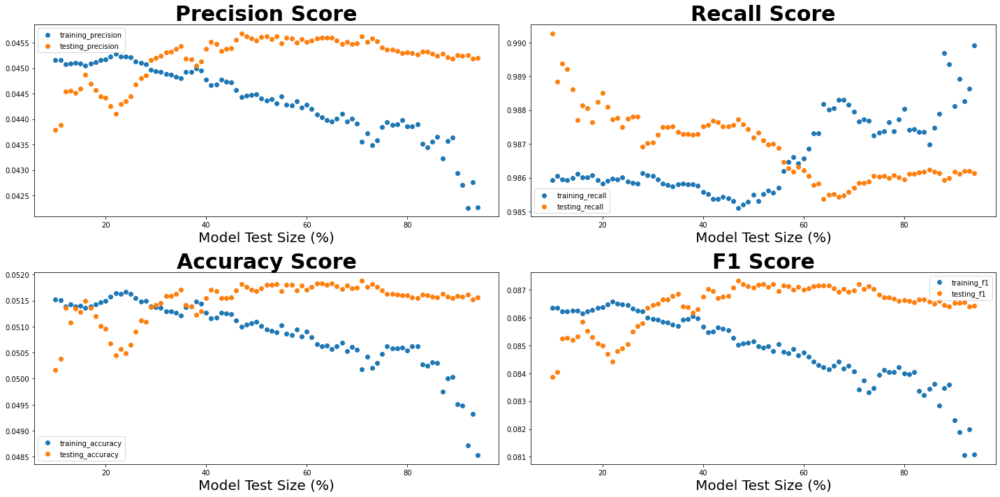

In [152]:
# Print residual scatter plot for 4 main logistic model metrics, iterating through the model and passing multiple 
# test-size objects to visualize effects of train/test size on model performance
print_metric_comparisons(X, y)

Training AUC: 0.6445944854355286
Test AUC: 0.6437320399041286


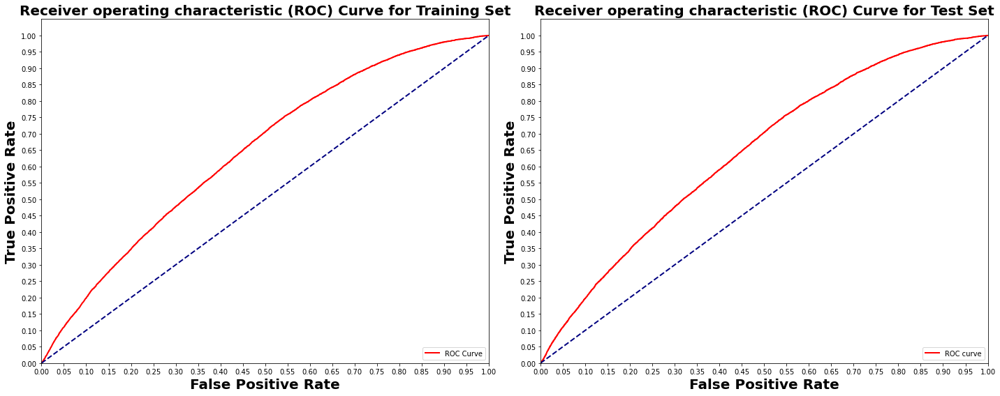

In [156]:
plot_auc(logreg, x_train_rf, x_test_rf, y_train_rf, y_test_rf)

In [ ]:
#### Trying a glm model

In [184]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator

In [240]:
# set GLM modeling parameters
# and initialize model training
glm_model = H2OGeneralizedLinearEstimator(family= "binomial",
                                          lambda_ = 0,
                                          compute_p_values = True,
                                         remove_collinear_columns = True)
glm_model.train(predictors, response, training_frame= hf_under)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%
Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_model_python_1702245397796_22473


GLM Model: summary


,,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
0,,binomial,logit,None,84,70,4,py_14_sid_9e8d




ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.23214082269006892
RMSE: 0.48180994457365545
LogLoss: 0.656655260282205
Null degrees of freedom: 25443
Residual degrees of freedom: 25373
Null deviance: 35272.873724339486
Residual deviance: 33415.872885240846
AIC: 33557.872885240846
AUC: 0.6509532689684312
AUCPR: 0.6216033955790455
Gini: 0.3019065379368624

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3630131953280679: 


,,0,1,Error,Rate
0,0,2889.0,9833.0,0.7729,(9833.0/12722.0)
1,1,892.0,11830.0,0.0701,(892.0/12722.0)
2,Total,3781.0,21663.0,0.4215,(10725.0/25444.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.363013,0.688091,295.0
1,max f2,0.152638,0.834429,379.0
2,max f0point5,0.440041,0.612095,242.0
3,max accuracy,0.461645,0.608474,226.0
4,max precision,0.775499,0.741379,33.0
5,max recall,0.068664,1.000000,396.0
6,max specificity,0.992170,0.999686,0.0
7,max absolute_mcc,0.423968,0.234533,254.0
8,max min_per_class_accuracy,0.504105,0.600535,194.0
9,max mean_per_class_accuracy,0.461645,0.608474,226.0



Gains/Lift Table: Avg response rate: 50.00 %, avg score: 10.00 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.010061,0.313807,1.093750,1.093750,0.546875,0.486671,0.546875,0.486671,0.011005,0.011005,9.375000,9.375000,0.001886
1,2,0.020005,0.238183,1.130435,1.111984,0.565217,0.271618,0.555992,0.379778,0.011240,0.022245,13.043478,11.198428,0.004480
2,3,0.030027,0.205387,1.043137,1.089005,0.521569,0.217178,0.544503,0.325507,0.010454,0.032699,4.313725,8.900524,0.005345
3,4,0.040009,0.193806,1.188976,1.113949,0.594488,0.198851,0.556974,0.293906,0.011869,0.044568,18.897638,11.394892,0.009118
4,5,0.050031,0.181892,0.878431,1.066771,0.439216,0.188715,0.533386,0.272834,0.008804,0.053372,-12.156863,6.677141,0.006681
5,6,0.100024,0.134148,1.141509,1.104126,0.570755,0.150207,0.552063,0.211545,0.057066,0.110439,14.150943,10.412574,0.020830
6,7,0.150016,0.120394,0.885220,1.031176,0.442610,0.126972,0.515588,0.183361,0.044254,0.154693,-11.477987,3.117632,0.009354
7,8,0.200008,0.107898,1.031447,1.031244,0.515723,0.113777,0.515622,0.165969,0.051564,0.206257,3.144654,3.124386,0.012498
8,9,0.299992,0.097888,1.139151,1.067208,0.569575,0.102138,0.533604,0.144695,0.113897,0.320154,13.915094,6.720818,0.040324
9,10,0.400016,0.092149,1.093910,1.073885,0.546955,0.094869,0.536942,0.132236,0.109417,0.429571,9.390963,7.388485,0.059110




Scoring History: 


,,timestamp,duration,iterations,negative_log_likelihood,objective,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error
0,,2024-01-11 11:32:17,0.000 sec,0,17636.436862,0.693147,,,,,,,
1,,2024-01-11 11:32:17,0.010 sec,1,16718.445556,0.657068,,,,,,,
2,,2024-01-11 11:32:17,0.015 sec,2,16707.972975,0.656657,,,,,,,
3,,2024-01-11 11:32:17,0.025 sec,3,16707.936444,0.656655,,,,,,,
4,,2024-01-11 11:32:17,0.029 sec,4,16707.936443,0.656655,0.48181,0.656655,0.0714367,0.650953,0.621603,1.09375,0.421514



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,tenure,0.305645,1.000000,0.096585
1,lr_increase,0.158770,0.519458,0.050172
2,segment_emerging,0.149289,0.488440,0.047176
3,tenure_group_<2yr,0.147983,0.484166,0.046763
4,tenure_group_2yr to 3yr,0.118264,0.386932,0.037372
5,lsm_-9999999999999999999,0.114981,0.376190,0.036335
6,one_yr_loss_ratio,0.109477,0.358185,0.034595
7,ad_loss_of_si,0.090797,0.297066,0.028692
8,count_th_lo,0.089568,0.293046,0.028304
9,three_yr_lr_band_a: 0 to 20%,0.085032,0.278204,0.026870



See the whole table with table.as_data_frame()


In [190]:
predict = glm_model.predict(hf_under)

glm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


In [246]:
perf = glm_model.model_performance(h20_x_test)
threshold = 0.775499
glm_model.model_performance(h20_x_test).confusion_matrix(thresholds=threshold)

Could not find exact threshold 0.775499; using closest threshold found 0.7763223524502982.

Confusion Matrix (Act/Pred) @ threshold = 0.7763223524502982: 


,,0,1,Error,Rate
0,0,66230.0,789.0,0.0118,(789.0/67019.0)
1,1,3097.0,84.0,0.9736,(3097.0/3181.0)
2,Total,69327.0,873.0,0.0554,(3886.0/70200.0)


In [260]:
perf = glm_model.model_performance(h20_x_test)
threshold = 0.7
glm_model.model_performance(h20_x_test).confusion_matrix(thresholds=threshold)

Could not find exact threshold 0.7; using closest threshold found 0.7010793343798454.

Confusion Matrix (Act/Pred) @ threshold = 0.7010793343798454: 


,,0,1,Error,Rate
0,0,64440.0,2579.0,0.0385,(2579.0/67019.0)
1,1,2912.0,269.0,0.9154,(2912.0/3181.0)
2,Total,67352.0,2848.0,0.0782,(5491.0/70200.0)


In [213]:
threshold = 0.876709
y_pred = (predict[:, 2] > threshold)
#confusion_matrix(y_test, y_pred)

In [194]:
glm_model.model_performance(h20_x_test)


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.23409475796334625
RMSE: 0.48383339897463284
LogLoss: 0.6605466749452783
Null degrees of freedom: 70199
Residual degrees of freedom: 70129
Null deviance: 97317.8641506317
Residual deviance: 92740.75316231708
AIC: 92882.75316231708
AUC: 0.6527732152174313
AUCPR: 0.07348469382383921
Gini: 0.3055464304348625

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5686998152954762: 


,,0,1,Error,Rate
0,0,53344.0,13675.0,0.204,(13675.0/67019.0)
1,1,2022.0,1159.0,0.6356,(2022.0/3181.0)
2,Total,55366.0,14834.0,0.2236,(15697.0/70200.0)



Maximum Metrics: Maximum metrics at their respective thresholds


,metric,threshold,value,idx
0,max f1,0.568700,0.128671,131.0
1,max f2,0.486539,0.236732,194.0
2,max f0point5,0.657154,0.104382,75.0
3,max accuracy,0.988669,0.954587,0.0
4,max precision,0.876709,0.112360,10.0
5,max recall,0.011731,1.000000,399.0
6,max specificity,0.988669,0.999881,0.0
7,max absolute_mcc,0.445408,0.094071,226.0
8,max min_per_class_accuracy,0.503367,0.600486,180.0
9,max mean_per_class_accuracy,0.445408,0.611070,226.0



Gains/Lift Table: Avg response rate:  4.53 %, avg score:  2.12 %


,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain,kolmogorov_smirnov
0,1,0.01,0.061098,1.477523,1.477523,0.066952,0.104486,0.066952,0.104486,0.014775,0.014775,47.752279,47.752279,0.005002
1,2,0.02,0.047345,1.257466,1.367494,0.056980,0.054061,0.061966,0.079273,0.012575,0.027350,25.746621,36.749450,0.007699
2,3,0.03,0.043279,1.320340,1.351776,0.059829,0.045232,0.061254,0.067926,0.013203,0.040553,32.033952,35.177617,0.011054
3,4,0.04,0.041543,1.005973,1.265325,0.045584,0.042302,0.057336,0.061520,0.010060,0.050613,0.597296,26.532537,0.011117
4,5,0.05,0.037817,0.691606,1.150582,0.031339,0.040102,0.052137,0.057237,0.006916,0.057529,-30.839359,15.058158,0.007886
5,6,0.10,0.028269,1.207168,1.178875,0.054701,0.031136,0.053419,0.044186,0.060358,0.117887,20.716756,17.887457,0.018736
6,7,0.15,0.025862,0.641308,0.999686,0.029060,0.027057,0.045299,0.038477,0.032065,0.149953,-35.869224,-0.031437,-0.000049
7,8,0.20,0.022832,1.144294,1.035838,0.051852,0.024165,0.046937,0.034899,0.057215,0.207168,14.429425,3.583779,0.007508
8,9,0.30,0.020740,1.235461,1.102379,0.055983,0.021637,0.049953,0.030478,0.123546,0.330714,23.546055,10.237871,0.032171
9,10,0.40,0.019517,1.213455,1.130148,0.054986,0.020099,0.051211,0.027883,0.121345,0.452059,21.345489,13.014775,0.054530


In [ ]:
aml.train(x=predictors,
        y=response,
        training_frame=train,
        validation_frame=valid

In [263]:
# Build and train the model:
from h2o.estimators import H2OKMeansEstimator

In [275]:
# Split into train and test
train, valid = hf_over.split_frame(ratios=[.8], seed=123)

In [276]:
# Build and train the model:
iris_kmeans = H2OKMeansEstimator(k=2,
                                 estimate_k=True,
                                 standardize=False,
                                 seed=1234)
iris_kmeans.train(x=predictors,
                  training_frame=train,
                  validation_frame=valid)

# Eval performance:
perf = iris_kmeans.model_performance()
perf

kmeans Model Build progress: |███████████████████████████████████████████████████| (done) 100%

ModelMetricsClustering: kmeans
** Reported on train data. **

Total Within Cluster Sum of Square Error: 3.999962323611667e+38
Total Sum of Square Error to Grand Mean: 1.311277283557276e+42
Between Cluster Sum of Square Error: 1.3108772873249147e+42

Centroid Statistics: 


,,centroid,size,within_cluster_sum_of_squares
0,,1.0,4415.0,5.033081e+24
1,,2.0,424845.0,3.999962e+38


In [278]:
iris_kmeans.model_performance(h20_x_test)


ModelMetricsClustering: kmeans
** Reported on test data. **

Total Within Cluster Sum of Square Error: 6.1769393185790775e+32
Total Sum of Square Error to Grand Mean: 1.5454887964192076e+41
Between Cluster Sum of Square Error: 1.5454887902422682e+41

Centroid Statistics: 


,,centroid,size,within_cluster_sum_of_squares
0,,1.0,519.0,5.916578e+23
1,,2.0,69681.0,6.176939e+32


In [280]:
preds = iris_kmeans.predict(h20_x_test)

kmeans prediction progress: |████████████████████████████████████████████████████| (done) 100%


In [ ]:
h20_x_test = h2o.H2OFrame(x_y_test)

In [297]:
ss = preds.cbind(h20_x_test)

In [301]:
ss['predict']

predict
1
1
1
1
1
1
1
1
1
1


In [294]:
preds.shape

(70200, 1)

In [282]:
print(confusion_matrix(h20_x_test, preds))

cancellation_check,tenure,one_yr_loss_ratio,three_yr_loss_ratio,lr_increase,tp_2,psr_2,psr_2_increase_loading,new_premium_2,count_th_lo,count_ad_repair,count_ad_replace,count_ad,gross_ad_repair,gross_ad_replace,gross_ad,gross_th_lo,three_yr_all,five_yr_claims,ad_loss_of_si,insured_value,three_yr_lr_band_a: 0 to 20%,three_yr_lr_band_b: 20 to 40%,three_yr_lr_band_c: 40 to 60%,three_yr_lr_band_d: 60 to 80%,three_yr_lr_band_e: 80 to 100%,three_yr_lr_band_f: 100%+,segment_?,segment_achiever,segment_affluent,segment_aspiration seeker,segment_bottom of pyramid,segment_emerging,lsm_-9999999999999999999,lsm_Group 1,lsm_Group 10,lsm_Group 2,lsm_Group 3,lsm_Group 4,lsm_Group 5,lsm_Group 6,lsm_Group 7,lsm_Group 8,lsm_Group 9,lsm_No_LSM,policy_make_mapped_Apple,policy_make_mapped_Huawei,policy_make_mapped_Other,policy_make_mapped_Samsung,tenure_group_2yr to 3yr,tenure_group_3yr to 4yr,tenure_group_4yr to 5yr,tenure_group_<2yr,tenure_group_gt 5yr,most_used_prov_-9999999999999999999,most_used_prov_Central,most_used_prov_Eastern,most_used_prov_Kwazulu Natal,most_used_prov_Limpopo,most_used_prov_Mpumalanga,most_used_prov_Northern Gauteng,most_used_prov_Southern Gauteng,most_used_prov_Western,dmuc_24h_distnct_cell_site_qty_-9999999999999999999,dmuc_24h_distnct_cell_site_qty_1,dmuc_24h_distnct_cell_site_qty_2,dmuc_24h_distnct_cell_site_qty_3,dmuc_24h_distnct_cell_site_qty_4,dmuc_24h_distnct_cell_site_qty_5,dmuc_24h_distnct_cell_site_qty_6,dmuc_24h_distnct_cell_site_qty_7plus,peril_filter_AD,peril_filter_COMP,five_yr_all_0,five_yr_all_1,five_yr_all_2,five_yr_all_3plus,map_age_11 to 20,map_age_21 to 30,map_age_31 to 40,map_age_41 to 50,map_age_51 to 60,map_age_61 to 70,map_age_71 to 80,map_age_81 to 90
0,12,0,0,0,65.9741,1.04586,0,74.52,0,0,0,0,0,0,0,0,0,0,0,13313.7,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0
0,29,0,0,0,72.5941,0.854064,0.005,67.27,0,0,0,0,0,0,0,0,0,0,0,7543.28,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0
0,20,0,0,0,400.802,0.835823,0.005,363.475,0,0,0,0,0,0,0,0,0,0,0,20827.6,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,1,0,0,0
1,17,4.62238,3.26286,0.07,306.235,1.01882,0,358.8,0,0,0,0,0,0,0,0,0,0,0,19411.6,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0
0,21,3.63231,2.07561,0.07,67.1294,0.834209,0.005,64.68,0,0,0,0,0,0,0,0,0,0,0,7543.28,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0
0,3,0,0,0,93.6172,0.779772,0.005,79.205,0,0,0,0,0,0,0,0,0,0,0,4175.48,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0,0,0,0
0,29,0,0,0,199.18,1.12963,0,243,0,0,0,0,0,0,0,0,0,0,0,11647,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0
0,29,0,0,0,451.054,0.629636,0.01,309.56,0,0,0,0,0,0,0,0,0,0,0,19411.6,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0
0,14,0,0,0,16.9881,1.64821,0,30.24,0,0,0,0,0,0,0,0,0,0,0,3771.64,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0
0,4,0,0,0,11.7274,2.21703,0,28.08,0,0,0,0,0,0,0,0,0,0,0,3940.52,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0


ValueError: Expected array-like (array or non-string sequence), got 

In [35]:
sc.stop()